In [39]:
# Import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.axes as axes
import seaborn as sns
import geopandas as gpd
#import osmnx as ox
from shapely.geometry import Point
import statsmodels.api
from scipy.stats import chi2_contingency
from scipy.stats import pearsonr

import warnings
warnings.filterwarnings('ignore')

# Chemins d'accès aux données
repDataConsolidees = '../../dataConsolidees.gouv/'

# Liste des fichiers usagers disponibles
!pwd
!ls {repDataConsolidees}*  -lrt
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


/Users/stephane/Documents/Professionnel/Formation/Certificats/Datascientest/4 - Projet AccidentsRoutiers/scripts/1 - ExplorationDonnees
ls: -lrt: No such file or directory
../../dataConsolidees.gouv/agg_accidents.csv
../../dataConsolidees.gouv/agg_usagers.csv
../../dataConsolidees.gouv/test_set.csv
../../dataConsolidees.gouv/train_set.csv
../../dataConsolidees.gouv/usagers.csv


## ETAPE 1 - CHARGEMENT DE L'ENSEMBLE TRAIN POUR EXPLORATION DES DONNEES

In [40]:
# ETAPE 1 - Chgt des données 
train = pd.read_csv (repDataConsolidees + "train_set.csv", dtype={'user_actp' : str}, ) 
train.describe()
save_train = train.copy()                                     # On sauvegarde train (si besoin)

#train = train[train.user_gravite != -1]


In [41]:
# ETAPE 2 - Préparation d'un dataset équilibré
from imblearn.over_sampling import RandomOverSampler, SMOTE
import math
# Préparation 
train = save_train.copy()
y = train.user_gravite                                             # target à rééquilibrer
x = train.drop(['id_accident', 'id_vehicule', 'num_veh', 'user_actp'], axis = 1)                 # suppression des colonnes non numérique et/ou inutile
x = x.fillna(-1)                                                   # Suppression des NaN



In [42]:
# REEQUILIGRABE OVERSAMPLING : SMOTE
x_train_smote, y_smote = SMOTE().fit_resample(x, y)
x_train_smote.vehi_motor = train.vehi_motor.apply(lambda valeur : math.floor(valeur))
x_train_smote.carac_com = train.carac_com.apply(lambda valeur : math.floor(valeur))
x_train_smote.carac_dept = train.carac_dept.apply(lambda valeur : math.floor(valeur))
x_train_smote.vehi_senc = train.vehi_senc.apply(lambda valeur : math.floor(valeur))


In [43]:

# REEQUILIBRAGE OVERSAMPLING : RandomOverSampling
x_train_ro, y_train_ro  = RandomOverSampler().fit_resample(x, y)
x_train_ro.vehi_motor = train.vehi_motor.apply(lambda valeur : math.floor(valeur))
x_train_ro.carac_com = train.carac_com.apply(lambda valeur : math.floor(valeur))
x_train_ro.carac_dept = train.carac_dept.apply(lambda valeur : math.floor(valeur))
x_train_ro.vehi_senc = train.vehi_senc.apply(lambda valeur : math.floor(valeur))



## ETAPE 2 - DECLARATION DES FONCTIONS UTILISEES LORS DE L'EXPLORATION DES DONNEES

In [44]:
def interquantile (df: pd.DataFrame, x: str, afficheDetail: bool = True, exclure_1: bool = True):
    """ Analyse des Outliers d'une colonne de df """
    # Retire les -1 (valeur NaN pour certaines variables 
    if exclure_1 :
        df_column = df.loc[(df[x] != -1), x]
        
    else :
        df_column = df.loc[:, x]


    # Analyse des Outliers via IQR :
    Q1 = df_column.quantile(0.25)
    Q3 = df_column.quantile(0.75)
    IQR = Q3 - Q1
    inf = Q1 - 1.5 * IQR
    sup = Q3 + 1.5 * IQR

    print ("-> Q1=", Q1, "- Q3=", Q3, "- IQR=", IQR, "- Borne inf=", inf, "- Borne sup=", sup)
    
    if afficheDetail or df_column[(df_column < inf)].count() > 0 :
        print ("-> Outlier(s) inférieur(s) - min=", df_column[(df_column < inf)].min(),
               "- max=", df_column[(df_column < inf)].max(),
               "- nb=", df_column[(df_column < inf)].count()
        )
        
    if afficheDetail :
        print (df_column[(df_column < inf)].sort_values().values)

    if afficheDetail or df_column[(df_column > sup)].count() > 0 :
        print ("-> Outlier(s) supérieur(s) - min=", df_column[(df_column > sup)].min(),
               "- max=", df_column[(df_column > sup)].max(),
               "Outliers nb=", df_column[(df_column > sup)].count()
        )
        
    if afficheDetail :
        print (df_column[(df_column > sup)].sort_values().values)
    

In [45]:
def monboxplot (
    df: pd.DataFrame, 
    x: str=None, 
    y: str=None, 
    title: str=None, 
    viewOutliers: bool=True, 
    exclure_1: bool=True,
    code_to_xlabel: {}={}, 
    rotation_xlabel: int=0,
    axe:plt.Axes=None) -> ():
    """ Affiche une figure composée de 2 graphes (un boxplot et une ditribution de la variable) de 1 à n boxplots (si x et y définis) 
        Affiche l'analyse des Outliers via les intervales inter Quantile. 

        - df : DataFrame contenant les données à afficher
        - x (str) : variable à analyser
        - y (str) : OPTIONNEL - variable complémentaire (varaible de découpage)
        - title (str) : OPTIONNEL - Titre du graphe
        - viewOutliers (bool) : OPTIONNEL - Le détail des outliers sera affichée sous forme de liste (True).
        - exclure_1 (bool) : OPTIONNEL - Les valeurs -1 seront exclues du graphe (True)
        - code_to_xlabel (dict) : OPTIONNEL - Dictionnaire permettant d'afficher le libellés plutôt que les modalité de 'x'
        - rotation_xlabel (int) : OPTIONNEL - Applique une rotation aux libellés sur l'axe des x
        - axe (plt.Axes) : OPTIONNEL - Affichage dans cet axe, création d'un nouveau sinon
        
        Returns :
        - figure
        - axes[]
        
    """
    fig = None
    if axe is None :
        fig, axe = plt.subplots(1, 1, figsize=(15, 5))
        
    sns.boxplot(x=x, y=y, data = df, ax = axe)
    axe.set_title (title, fontsize = 12);
    print ("Outliers=") 
    interquantile(df, y, viewOutliers, exclure_1)
    if code_to_xlabel is not None :
        xticks_labels = axe.get_xticklabels()
        labels = [label.get_text() for label in xticks_labels]
        new_xlabels = [code_to_xlabel[label] if label in code_to_xlabel else label for label in labels]
        axe.set_xticks(ticks = range(len(new_xlabels)), labels = new_xlabels, rotation=rotation_xlabel);

    return fig, axe 
    


In [46]:
def moncountplot (df: pd.DataFrame, 
                  x: str, 
                  hue: str=None, 
                  title: str=None, 
                  code_to_xlabel: {}={}, 
                  rotation_xlabel: int=0,
                  code_to_huelabel: {}={},
                  viewPercent: float=0.0,
                  axe:plt.Axes=None ) -> ():
    """ Affiche un Countplot personnalisé :
        - df : DataFrame contenant les données à afficher
        - x (str) : nom de la variable à afficher sur l'axe des abscisses 
        - hue (str) : OPTIONNEL - variable complémentaire (découpage graphe par cette variable) 
        - title (str) : OPTIONNEL - Titre à afficher
        - code_to_xlabel (dict) : OPTIONNEL - Libellés à privilégier pour les modalités de la variable 'x' (les modalités sinon)
        - rotation_xlabel (int) : OPTIONNEL - Angle de rotation des libellés de l'axe des absisses
        - code_to_huelabel (dict) : OPTIONNEL - Libellés à privilégierpour les modalités de la variable 'hue' (les modalités sinon)
        - viewPercent (float) : OPTIONNEL - seuil à partir duquel le % sera affiché sur le graphe pour chaque modalité (>100 pour ne pas afficher les %)
        - axe (plt.Axes) : OPTIONNEL - Affichage dans cet axe, création d'un nouveau sinon

        Return :
        - fig, axe : fig <-- None si utilisation de l'axe transmis en paramètre
    
    """
    fig = None
    if axe is None :
        fig, axe = plt.subplots(1, 1, figsize=(15, 5))
        
    # Passe les colonnes en str pour éviter un plantage sur startwith
    if hue is None :
        df_str = df[[x]].astype(str)  

    else :
        df_str = df[[x, hue]].astype(str)  
    
    sns.countplot(x=x, hue=hue, data=df_str, ax=axe)       # plutot que x=x pour forcer le type à str (sinon plantage startwith dans countplot

    # Calcul des % de chaque modalité 
    total = len(df_str[x])
    for p in axe.patches:
        percent = 100 * p.get_height() / total
        if viewPercent < percent :
            percentage = '{:.1f}%'.format(percent)
            X = p.get_x() + p.get_width() / 2 - 0.1
            Y = p.get_height() + 0.1
            axe.text(X, Y, percentage, ha = 'center')

    # Libellé axe des x
    xticks_labels = axe.get_xticklabels()
    labels = [label.get_text() for label in xticks_labels]
    new_xlabels = [code_to_xlabel[label] if label in code_to_xlabel else label for label in labels]
    axe.set_xticks(ticks = range(len(new_xlabels)), labels = new_xlabels, rotation=rotation_xlabel);
    axe.set_title(title, fontsize = 12)

    # Libellé légende (si hue est défini)
    if hue is not None:
        handles, labels = axe.get_legend_handles_labels()
        new_huelabels = [code_to_huelabel[label] if label in code_to_huelabel else label for label in labels]
        axe.legend(handles, new_huelabels)

    return fig, axe
   


In [47]:
def monhistplot (df: pd.DataFrame, 
                 x: str, 
                 y: str=None,
                 title: str=None, 
                 bins: int=50, 
                 viewPercent: float=0.0,
                 axe:axes._axes.Axes=None)-> ():
    """ Affiche un histplot personnalisé :
        - df : DataFrame contenant les données à afficher
        - x (str) : nom de la variable à afficher sur l'axe des abscisses 
        - y (str) : nom de la variable à afficher sur l'axe des ordonnés 
        - title (str) : Optionel - titre à afficher
        - bins (int) : nombre d'intervalles de regroupement par défaut 50
        - viewPercent (float) : seuil à partir duquel le % sera affiché sur le graphe pour chaque modalité (>100 pour ne pas afficher les %)
        - axe (matplotlib.axes._axes.Axes) : Optionel - Affichage dans cet axe, création d'un nouveau sinon

        Return :
        - fig, axe : fig <-- None si utilisation de l'axe transmis en paramètre
    
    """
    fig = None
    if axe is None :
        fig, axe = plt.subplots(1, 1, figsize=(15, 5))
        
    sns.histplot(x=x, y=y, data = df, bins=bins, ax=axe)

    total = len(df[x])
    for p in axe.patches:
        percent = 100 * p.get_height() / total
        if viewPercent < percent:
            percentage = '{:.1f}%'.format(percent)
            X = p.get_x() + p.get_width() / 2 - 0.1
            Y = p.get_height() + 0.1
            axe.text(X, Y, percentage, ha = 'center')
    
    axe.set_title(title, fontsize = 12)

    return fig, axe


In [48]:
# Fonction d'analyse d'une variable catégorielle
def analyse_variable_categorielle (df: pd.DataFrame, 
                                   x: str, 
                                   cible: str='user_gravite', 
                                   modalite_cible: any=3, 
                                   liste_taux: []=np.arange(0.0, 5.0, 0.1),
                                   valna: any=None, 
                                   # attributs pour la gestion du graphe de distribution (countplot)
                                   title: str=None,
                                   code_to_xlabel: {}={'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}, 
                                   code_to_huelabel: {}=None,
                                   rotation_xlabel: int=0,
                                   viewPercent: float=0.25,
                                   axe: plt.Axes=None,
                                   limiteModalite: int=999) :
    """ Fonction permettant de faire une analyse rapide de la répartition de chaque modalité d'une variable ainsi que de ses Missing Values.

        Des tests statistiques permettent de définir le niveau de corrélation de cette variable avec la varible cible et d'identifier
        s'il y  a un intérêt de privilégier à cette variable :
           - un regroupement binaire (le taux de regroupement sera recherché afin de maximiser le V Cramer) : (cf.regroupement_binaire_variable_categorielle())
           - un OneHotEncoding
           
        ARGS :   
        - df (DataFrame) : Encsemble de données à analyser
        - x (str) : nom de la variable catégorielle à analyser
        - cible (str) : variable cible pour affichage Tableau de contingence
        - modalite_cible (any) = OPTIONNEL - modalité de la variable cible  privilégier (par défaut : 3=Tué)
        - liste_taux (float) : OPTIONNEL - % de répartition à atteindre par la modalité pour être regroupé en modalité 1 sinon modalité 0
        - valna (any) : OPTIONNEL - Catégorie à considérer comme valeurs manquantes (en complément des nan)
        - title (str) : OPTIONNEL - Titre du graphe
        - code_to_xlabel ({}) : OPTIONNEL - Dictionnaire modalité --> libellé (si fourni, les countplot sont affichés)
        - code_to_huelabel ({}) : OPTIONNEL - Dictionnaire modalité --> libellé pour la variable à analyser (x)
        - rotation_xlabel (int) : OPTIONNEL - Angle de rotation des libellés de l'axe des absisses
        - viewPercent (float) : OPTIONNEL - seuil à partir duquel le % sera affiché sur le graphe pour chaque modalité (>100 pour ne pas afficher les %)
        - axe (plt.Axes) : OPTIONNEL - Affichage dans cet axe, création d'un nouveau sinon
        - limiteModalite (int) : OPTIONNEL - Affichage des 'limiteModalite' premières Modalités les plus utilisées

        RETURN : best_regroupement si calculé, df[x] sinon
    """
    print()
    nb_na = df[x].isna().sum()
    if valna is not None :
        nb_na += df[(df[x] == valna)][x].count()

    # Répartition des différentes modalités
    pourcentage = round(nb_na / len(df), 2) * 100
    print(f"Il y a {pourcentage}% ({nb_na}) de données manquantes (ou assimilées).", end="\n")
    nombre = df[x].nunique()
    print(f"Il y a {nombre} modalités.", end="\n\n")
    print(df[x].value_counts(normalize=True, dropna=False).head(limiteModalite), end="\n\n")

    if cible is not None :
        # Test Statistique du chi2
        ctnorm = pd.crosstab(df[x], df[cible], normalize='index')
        ct = pd.crosstab(df[x], df[cible])
        chi2, p_value_noRgmt, dof, expected = chi2_contingency(ct)
        V_Cramer_noRgmt = np.sqrt(chi2/pd.crosstab(df[x], df[cible]).values.sum())
        
        print("Test Statistique du chi2 (sans regroupement) : p-value=%.3f" % p_value_noRgmt, "; V de Cramer=%.5f" % V_Cramer_noRgmt, end="\n\n")
        print ("Tableau de contingence entre la variable et la variable cible (pour chi2): \n\n")
        print (ct.head(limiteModalite), end="\n\n")

        # Affichage d'un countPlot de la variable
        if title is not None or (code_to_huelabel is not None and len(code_to_huelabel)>0) :
            if title is None :
                title = f"Analyse de la variable {x}"

            # Ajout de 2 graphes : distribution d ela variable analysée à gauche, =f(cible) à droite
            fig, axs = plt.subplots(1, 2, figsize=(15, 5))
            axe = axs[0]
            moncountplot(df, 
                         x=x, 
                         title=title, 
                         code_to_xlabel=code_to_huelabel, 
                         rotation_xlabel=rotation_xlabel,
                         viewPercent=viewPercent,
                         axe=axe
                    )

            axe = axs[1]
            moncountplot(df, 
                         x=cible, 
                         hue=x, 
                         title="en fonction de la variable cible", 
                         code_to_xlabel=code_to_xlabel, 
                         code_to_huelabel=code_to_huelabel,
                         rotation_xlabel=rotation_xlabel,
                         viewPercent=viewPercent,
                         axe=axe
                    )
            plt.show();

        # Recherche d'un regroupement binaire maximisant la corrélation avec la variable cible
        best_optimisation = 'BINAIRE'
        _modalite_1 = "Liste des catégories regroupée sur la modalité 1 : "
        _modalite_0 = f"Liste des modalités regroupées sur la modalité 0 :"
        print ("TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE")

        # Tableau de contingence normalisé
        print ("Tableau de contingence normalisé entre la variable et la variable cible : \n\n")
        print (ctnorm.head(limiteModalite), end="\n\n")
        best_regroupement, best_taux, best_p_value, best_V_Cramer, best_modalite_1, best_modalite_0, _ = regroupement_variable_categorielle (
                                                                      train, 
                                                                      x=x, 
                                                                      cible=cible, 
                                                                      modalite_cible=modalite_cible, 
                                                                      binary = True,                  # regroupement en catégorie binaire
                                                                      liste_taux=liste_taux, 
                                                                      code_to_xlabel=code_to_xlabel)
        
        # Recherche d'un regroupement non binaire maximisant la corrélation avec la variable cible
        print ("TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE")
        best_regroupement_Rgmt, best_taux_Rgmt, best_p_value_Rgmt, best_V_Cramer_Rgmt, best_modalite_1_Rgmt, best_modalite_0_Rgmt, new_modalite = regroupement_variable_categorielle (
                                                                    train, 
                                                                    x=x, 
                                                                    cible=cible, 
                                                                    modalite_cible=modalite_cible, 
                                                                    binary=False,
                                                                    liste_taux=liste_taux, 
                                                                    code_to_xlabel=code_to_xlabel)
        
        # Conservation du meilleur regroupement identifié
        if best_V_Cramer_Rgmt > best_V_Cramer :
            best_regroupement = best_regroupement_Rgmt
            best_taux = best_taux_Rgmt
            best_p_value = best_p_value_Rgmt
            best_V_Cramer = best_V_Cramer_Rgmt
            best_modalite_1 = best_modalite_1_Rgmt
            best_modalite_0 = best_modalite_0_Rgmt
            best_optimisation = 'NON BINAIRE'
            _modalite_1 = "Liste des catégories conservées : "
            _modalite_0 = f"Liste des modalités regroupées pour former la nouvelle modalité '{new_modalite}' :"

        print (f"\nOptimisation Corrélation variable '{x}':")
        if best_V_Cramer > V_Cramer_noRgmt :
            print (f"OPTIMISATION REGROUPEMENT {best_optimisation} : taux de regroupement optimal={best_taux} " \
                   f", best_p_value=%.3f" % best_p_value, " - best_V_Cramer=%.5f" % best_V_Cramer)
            print (_modalite_1, best_modalite_1)
            print (_modalite_0, best_modalite_0)

            return best_regroupement

    # La variable sans regroupement est plus performante...
    print (" ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.")
    
    return df[x]

In [49]:
# Permet de regouper en 2 modalités une variable catégorielle selon le taux de la modalité tué qui nous intéresse
def regroupement_variable_categorielle(df: pd.DataFrame, 
                                       x: str, 
                                       cible: str='user_gravite', 
                                       modalite_cible: any=3, 
                                       binary: bool=True,
                                       liste_taux: []=np.arange(2, 5, 0.1), 
                                       code_to_xlabel: {}={'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}) :
    """ Fonction permettant de regrouper les catégories afin de ne conserver que certaines modalités. 2 Modes de regroupement possible :
        - df (DataFrame) : Encsemble de données à analyser
        - x (str) : nom de la variable catégorielle à analyser
        - cible (str) : OPTIONNAL - variable cible pour affichage Tableau de contingence
        - modalite_cible (any) = OPTIONNAL - modalité de la variable cible  privilégier (par défaut : 3=Tué)
        - binary (bool) = OPTIONNAL - True  --> catégorisation binaire : 2 modalités de regroupement seront réalisée : les modalités qui atteingnent le seuil et les autres
                                    - False --> Regroupement sous un nouveau code de toutes les modalités dont la proba d'atteindre la modalité cible de référence n'est pas atteinte
        - liste_taux (float) : OPTIONAL - % de répartition à atteindre par la modalité pour être regroupé en modalité 1 sinon modalité 0
        - code_to_xlabel ({}) : OPTIONNAL - Dictionnaire modalité --> libellé (si fourni, les countplot sont affichés)

        RETURN : np contenant le nouveau regroupement
    """
    print()
    ctnorm = pd.crosstab(df[x], df[cible], normalize='index')

    if binary == False :
        # Recherche de la modalité la plus grande pour la variable en cours d'analyse
        new_modalite = df[x].unique().max().astype(int) + 1
        print ("REGROUPEMENT NON BINAIRE : new_modalite=", new_modalite)
        
    else :
        new_modalite = None
        
    p_values = []
    V_Cramers = []
    best_V_Cramer = -1 
    best_p_value = -1
    best_taux = 0
    best_modalite_0 = []
    best_modalite_1 = []
    best_regroupement = []
    for taux in liste_taux :
        if binary :
            regroupement = np.where(df[x].isin(ctnorm[ctnorm[modalite_cible] >= taux/100].index.tolist()), 1, 0)

        else :
            regroupement = np.where(df[x].isin(ctnorm[ctnorm[modalite_cible] >= taux/100].index.tolist()), df[x], new_modalite)
            
        # Test statistique à partir de ce regroupement
        stat, p_value, _, _ = chi2_contingency(pd.crosstab(regroupement, df[cible]))
        V_Cramer = np.sqrt(stat/pd.crosstab(regroupement, df[cible]).values.sum())
        
        #print("TAUX=", taux, " - Test Statistique du chi2 : p-value=%.3f" % p_value, " ; V de Cramer=%.5f" %V_Cramer)
        
        if p_value > 0.05 :
            p_values.append(0.05)
            V_Cramers.append(0)
        
        else :
            p_values.append(p_value)
            V_Cramers.append(V_Cramer)

        if (p_value < 0.05) & (best_V_Cramer <= V_Cramer) :
            # Si égalité entre best_model et current_modele, on ne garde le best_modele que si binary == False afin de garder le plus grand taux 
            if (best_V_Cramer == V_Cramer) & binary == True :
                continue
            else :
                best_taux = taux
                best_p_value = p_value
                best_V_Cramer = V_Cramer
                best_modalite_0 = ctnorm[ctnorm[modalite_cible] < taux/100].index.tolist()
                best_modalite_1 = ctnorm[ctnorm[modalite_cible] >= taux/100].index.tolist()
                best_regroupement = regroupement
        
    print(f"Meilleurs résultats obtenu avec taux=", best_taux)
    if binary == False :
        print(f"Liste des modalités regroupées dans la nouvelle catégorie {new_modalite} :", best_modalite_0)

    else :
        print("Liste des modalités retenues en modalité de regroupement 1 :", best_modalite_1)
    
    print("Test Statistique du chi2 : p-value=%.3f" % best_p_value, " ; V de Cramer=%.5f" % best_V_Cramer, end="\n\n")

    # Résultat de la maximisation de la corrélation entre la variable et la variable cible
    plt.plot(np.array(liste_taux), V_Cramers, color='blue', label='V Cramer')
    plt.plot(np.array(liste_taux), p_values, color='orange', marker='o', label='p_value')

    plt.xlabel('Taux')
    plt.ylabel('p-value')
    plt.title('Comparaison des valeurs de p-value et de V Cramer pour différents taux de regroupement')
    plt.xticks(rotation=45)
    plt.legend()
    plt.show();

    if best_V_Cramer == -1 :
        best_regroupement = df[x]
        
    return best_regroupement, best_taux, best_p_value, best_V_Cramer, best_modalite_1, best_modalite_0, new_modalite
                                       

In [50]:
# Fonction d'analyse d'une variable catégorielle binaire
def analyse_variable_binaire(df: pd.DataFrame, x: str, cible: str=None, valna: any=None, code_to_xlabel: {}=None) :
    """ Fonction permettant de faire une analyse rapide de la répartition de chaque modalité ainsi que des Missing Values
        - df (DataFrame) : Encsemble de données à analyser
        - x (str) : nom de la variable catégorielle à analyser
        - cible (str) : OPTIONAL - variable cible pour affichage Tableau de contingence
        - valna (any) : OPTIONAL - Catégorie à considérer comme valeurs manquantes (en complément des nan)
        - code_to_xlabel ({}) : OPTIONAL - Dictionnaire modalité --> libellé (si fourni, les countplot sont affichés)
    """
    print()
    nb_na = df[x].isna().sum()
    if valna is not None :
        nb_na += df[(df[x] == valna)][x].count()
    
    # Répartition des différentes modalités
    pourcentage = round(nb_na / len(df), 3) * 100
    print(f"Il y a {pourcentage} % de données manquantes (ou assimilées).", end="\n\n")
    nombre = df[x].nunique()
    print(f"Répartition de la variable :", end="\n\n")
    print(df[x].value_counts(normalize=True, dropna=False), end="\n\n")

    # Graphe de répartition de la variable
    if code_to_xlabel :
        moncountplot(df, 
                     x, 
                     title=f"Répartition de la variable '{x}'", 
                     code_to_xlabel=code_to_xlabel, 
                    )
    
    # Tableau de contingence avec la variable cible 
    if cible is not None :
        # Test Statistique du chi2
        ctnorm = pd.crosstab(df[x], df[cible], normalize='index')
        ct = pd.crosstab(df[x], df[cible])
        chi2, p_value, dof, expected = chi2_contingency(ct)
        V_Cramer = np.sqrt(stat/pd.crosstab(df[cible], df[x]).values.sum())
        
        print("Test Statistique du chi2 : p-value=%.3F" % p_value, " ; V de Cramer=", V_Cramer, end="\n\n")

        print ("Tableau de contingence entre la variable et la variable cible (pour chi2): \n\n")
        print (ct, end="\n\n")
        
        print ("Tableau de contingence normalisé entre la variable et la variable cible : \n\n")
        print (ctnorm, end="\n\n")
        
        
        if code_to_xlabel :
            code_to_huelabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
            moncountplot(df, 
                     x, 
                     cible, 
                     f"Analyse variable '{x}'", 
                     code_to_xlabel=code_to_xlabel, 
                     code_to_huelabel=code_to_huelabel
                    )
    
        

In [51]:
# Fonction d'analyse d'une variable quantitative
def analyse_variable_quantitative (df: pd.DataFrame, x: str, cible: str=None, valna: any=None, code_to_xlabel: {}=None) :
    """ Fonction permettant de faire une analyse rapide de la distribution de chaque modalité ainsi que des Missing Values
        
        Affichage possible de boxplot
        
        - df (DataFrame) : Encsemble de données à analyser
        - x (str) : nom de la variable catégorielle à analyser
        - cible (str) : OPTIONAL - variable cible pour affichage Tableau de contingence
        - valna (any) : OPTIONAL - Catégorie à considérer comme valeurs manquantes (en complément des nan)
        - code_to_xlabel ({}) : OPTIONAL - Dictionnaire modalités cible --> libellé (si fourni, les boxplots sont affichés)
    """
    print()
    nb_na = df[x].isna().sum()
    if valna is not None :
        nb_na += df[(df[x] == valna)][x].count()
    
    # Répartition des différentes modalités
    pourcentage = round(nb_na / len(df), 3) * 100
    print(f"Il y a {pourcentage}% de données manquantes (ou assimilées).", end="\n\n")
    
    if valna is not None :
        print("Statistiques de la variable (hors valeur nan): ", end="\n\n")
        print(df[(df[x] != valna)][x].describe(), end="\n\n")

    else :
        print("Statistiques de la variable : ", end="\n\n")
        print(df[x].describe(), end="\n\n")

    if code_to_xlabel is not None :
        # Affichage de la distribution de la variable sous forme de boxplot
        monboxplot(df, y=x, title=f"Distribution de la variable '{x}'", code_to_xlabel=code_to_xlabel,)

    if cible is not None :
        # Analyse statistique - test Anova (entre année de naissance (quantitative) de l'usager et la variable cible ='user_gravite' (catégorielle)
        result = statsmodels.formula.api.ols(f'{cible} ~ {x}', data=df).fit()
        table = statsmodels.api.stats.anova_lm(result)
        print ("\nTest staistique ANOVA - PR(>F)=", table.iloc[0, 4], end="\n\n")
        display(table)
        
        # Affichage de la distribution de la variable en fonction de la variable cible
        monboxplot(df, x= cible, y=x, title=f"Distribution de la variable =f({cible})", code_to_xlabel=code_to_xlabel,)

In [52]:
# Fonction d'analyse des missing value pour une variable définie
def analyse_valeurs_manquantes (df: pd.DataFrame, x: str, variables_continues: []=[], variables_categorielles : []=[]) :
    """ Fonction qui permet d'analyser la tendance d'une variables par rapport à un périmètre de variables continues 
        d'une part et catégorielles d'autre part afin d'identifier des tendances

        L'objectif étant d'identifier des règles de remplacement des missing value peut être plus pertinente qu'un remplacement par défaut

        - df (DataFrame) : Ensemble des données à analyser
        - x (str) : nom de la variable à analyser
        - variables_continues ([]) : Liste des variables continues à analyser
        - variables_categorielles ([]) : Liste des variables catégorielles à analyser
        
    """

    # Variables continues
    liste_variables = variables_continues
    liste_variables.append(x)
    print("Liste=", liste_variables) 
    print (f"La valeur médiane selon {x} : ", end="\n\n")
    print (df[liste_variables].groupby(x).median(), end="\n\n")

    # Variables catégorielles
    liste_variables = variables_categorielles
    liste_variables.append(x)
    print (f"Le mode selon {x} : ", end="\n\n")
    print(df[liste_variables].groupby(x).apply(pd.DataFrame.mode).set_index(x), end="\n\n")

    # Vérification des proportions
    for variable in variables_categorielles :
        print("Proportion : ", end="\n\n")
        print(df.groupby(variable)[x].value_counts(normalize=True), end="\n\n")
        

## ETAPE 3 - EXPLORATION DES DONNEES
- 3.0. - Analyse de la variable cible
- 3.1. - Représentation des variables entre elles - Diagramme de paires
- 3.2. - Feature Engineering sur donnée date accident
- 3.3. - Analyse des variables catégorielles
  - 3.3.1. Analyse des variables binaires
  - 3.3.2. Analyse des variables non binaires
- 3.4. - Analyse des variables quantitatives

### EXPLORATION DES DONNEES
__<u> <span style="color:blue">ETAPE 3.0 - EXPLORATION DES DONNEES - ANALYSE VARIABLE CIBLE <span style="color:red">'USER_GRAVITE'</span></span></u>__




<u>ANALYSE DETAILLEE DE LA VARIABLE CIBLE <span style="color:red">__'USER_GRAVITE'__ : </span></u>

Gravité de l'accident : donnée catégorielle (4 modalités ordonnées de 0 à 3)

&#8195;

user_gravite
-1       215
 0    114001
 1    108339
 2     41182
 3      7195
Name: count, dtype: int64

(<Figure size 1500x500 with 1 Axes>,
 <Axes: title={'center': "Variable cible 'user_gravite'"}, xlabel='user_gravite', ylabel='count'>)

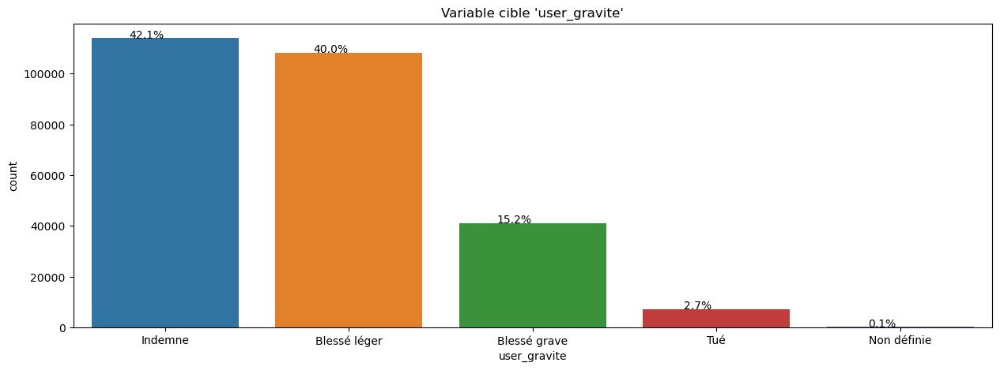

In [37]:
# 1. Analyse variable cible
display(train['user_gravite'].value_counts().sort_index())

# Countplot
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué', '-1' : 'Non définie'}
moncountplot (df=train,
              x='user_gravite', 
              title="Variable cible 'user_gravite'", 
              code_to_xlabel=code_to_xlabel, 
              viewPercent=0.0)


In [38]:
# Variable cible --> Pour la suite de l'exploration des données ==>  Suppression des missings values
train = train[(train.user_gravite != -1)]


<u>CONCLUSION <span style="color:red">__'USER_GRAVITE'__</span> :</u>
- Quelques missing values (215 enregistrements) qu'ils faudra supprimer --> pipeline_target()
- Les 2 premières classes (les moins intéressantes) représentent à elles seules 82%
- Les 2 autres représentent moins de 18% dont 2,7% pour la classe la plus intéressante à prédire

__==> Nous sommes face à un problème de catégorisation supervisé déséquilibrée__

&#8195;

### EXPLORATION DES DONNEES
__<u> <span style="color:blue">ETAPE 3.1 - EXPLORATION DES DONNEES - DIAGRAMME DE PAIRES</span></u>__



<u>DIAGRAMME DE PAIRE ENTRE CHAQUE VARIABLE FICHIER USER </u>
Entre chaque variable issues du fichier usager

___/!\ TRAITEMENT TRES LONG /!\\___

#### &#8195;
__<u> <span style="color:green">ETAPE 3.1.1 - DIAGRAMME DE PAIRES - <span style="color:red">FICHIER 'USER'</span></span></u>__



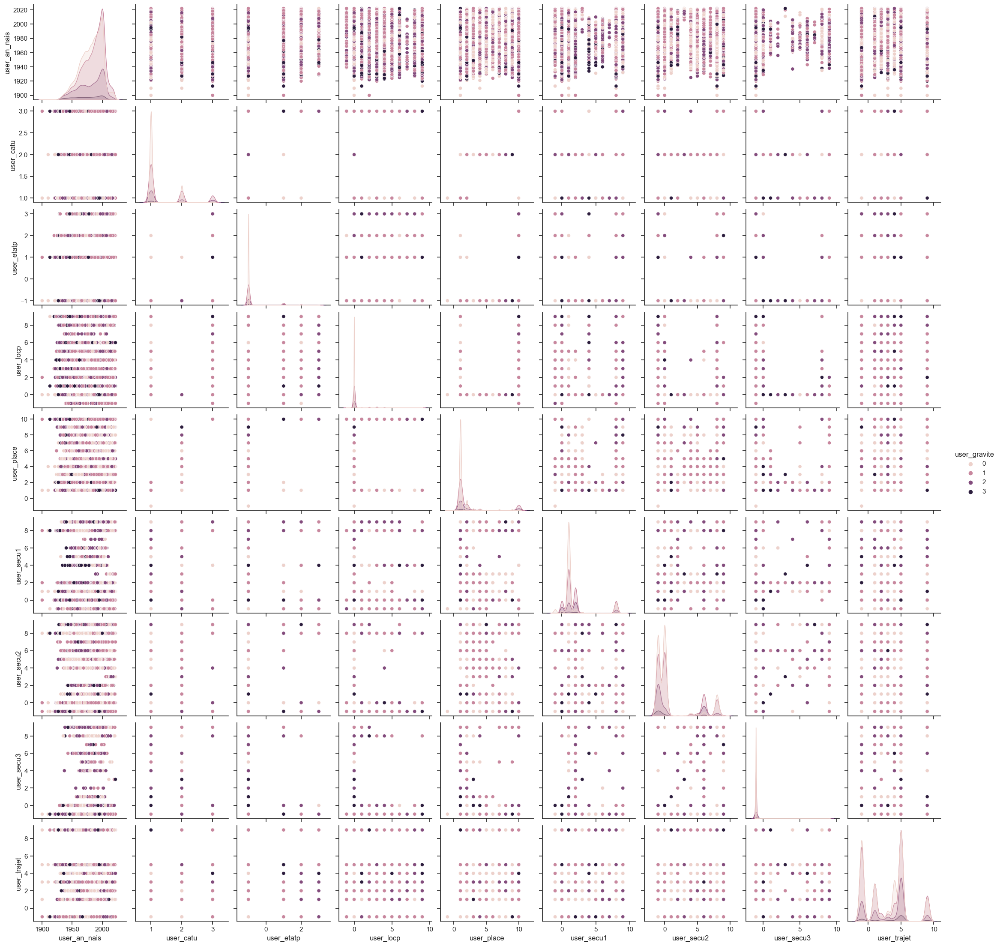

In [227]:
sns.set(style='ticks', color_codes=True)
colonnes = ['user_an_nais', 'user_catu', 'user_actp', 'user_etatp', 'user_locp', 'user_place', 'user_secu1', 'user_secu2', 'user_secu3', 'user_trajet', 'user_gravite']
sns.pairplot(train[colonnes], hue="user_gravite")

In [ ]:
sns.set(style='ticks', color_codes=True)
#sns.pairplot(train, hue="user_gravite")

#### &#8195;
__<u> <span style="color:green">ETAPE 3.1.2 - DIAGRAMME DE PAIRES - <span style="color:red">FICHIER 'VEHI'</span></span></u>__



In [ ]:
# à faire

#### &#8195;
__<u> <span style="color:green">ETAPE 3.1.3 - DIAGRAMME DE PAIRES - <span style="color:red">FICHIER 'LIEU'</span></span></u>__



In [3]:
# à faire

#### &#8195;
__<u> <span style="color:green">ETAPE 3.1.4 - DIAGRAMME DE PAIRES - <span style="color:red">FICHIER 'CARAC'</span></span></u>__



In [4]:
# à faire

<u>CONCLUSION :</u>

  __==> Cette représentation nous permet de faire ressortir des tendances que nous allons analyser plus en détail maintenant__
  

### EXPLORATION DES DONNEES
__<u> <span style="color:blue">ETAPE 3.2 - FEATURE ENGINEERING SUR DONNEES <span style="color:red">'DATES'</span></span></u>__



#### &#8195;
__<u> <span style="color:green">ETAPE 3.2.1 - FEATURE ENGINEERING SUR <span style="color:red">'DATE_ACCIDENT'</span></span></u>__


In [53]:
# Transformation de la date an + mois + jour --> date + jour de semaine + we O/N
def composer_date(row):
    jour_str = str(row['carac_jour']).zfill(2)
    mois_str = str(row['carac_mois']).zfill(2)
    année_str = str(row['carac_an'])
    return pd.to_datetime(f"{jour_str}/{mois_str}/{année_str}", format="%d/%m/%Y")

# Variable '_date_accident'
train['_date_accident'] = train.apply(composer_date, axis=1)

# Variable '_jour_semaine' (no du jour dans la semaine 0=lundi, ..., 6=dimanche
train['_jour_semaine'] = train._date_accident.apply(lambda date : date.weekday())

# Variable '_is_we' : indicateur WE 0/1
train['_is_we'] = train._jour_semaine.apply (lambda jour : 1 if jour>=5 else 0)

# Contrôle
train.head()


,id_accident,id_vehicule,num_veh,carac_an,carac_mois,carac_jour,carac_hrmn,carac_agg,carac_atm,carac_col,carac_com,carac_dept,carac_gps_lat,carac_gps_long,carac_int,carac_lum,lieu_catr,lieu_circ,lieu_infra,lieu_larrout,lieu_lartpc,lieu_nbv,lieu_plan,lieu_prof,lieu_situ,lieu_surf,lieu_vma,lieu_vosp,vehi_catv,vehi_choc,vehi_manv,vehi_motor,vehi_obs,vehi_obsm,vehi_occutc,vehi_senc,user_an_nais,user_catu,user_actp,user_etatp,user_locp,user_place,user_secu1,user_secu2,user_secu3,user_sexe,user_trajet,user_gravite,agg_catv_perso,agg_is_conducteur_vehicule,agg_is_conductrice_vehicule,agg_nb_pieton_vehicule,agg_nb_passager_vehicule,agg_nb_indemne_vehicule,agg_nb_blesse_leger_vehicule,agg_nb_blesse_grave_vehicule,agg_nb_tue_vehicule,agg_nb_total_vehicule,agg_nb_total_velo,agg_nb_total_vsp,agg_nb_total_moto,agg_nb_total_vl,agg_nb_total_pl,agg_nb_total_va,agg_nb_total_conducteur,agg_nb_total_conductrice,agg_nb_total_pieton,agg_nb_total_passager,_date_accident,_jour_semaine,_is_we
0,202000000002,154742273,A01,2020,3,7,835,2,7,6,657.0,91,48.69000,2.41000,9,2,4,2,0,-1.0,2.0,2,3,1,1,1,50.0,0,7,2,26,1.0,0,1,0,3.0,1997.0,1,0,0,0,1,8,0,-1,1,1,0,4,1,0,1,0,1,1,0,0,1,0,0,0,1,0,0,1,0,1,0,2020-03-07,5,1
1,202000000002,154742273,A01,2020,3,7,835,2,7,6,657.0,91,48.69000,2.41000,9,2,4,2,0,-1.0,2.0,2,3,1,1,1,50.0,0,7,2,26,1.0,0,1,0,3.0,1967.0,3,3,1,3,10,0,-1,-1,1,5,1,4,1,0,1,0,1,1,0,0,1,0,0,0,1,0,0,1,0,1,0,2020-03-07,5,1
2,202000000003,154742271,B01,2020,3,7,1330,2,1,3,174.0,91,48.61067,2.47582,2,1,4,-1,0,-1.0,2.0,2,1,1,1,1,50.0,0,7,1,1,1.0,0,2,0,1.0,1985.0,1,0,0,0,1,1,0,-1,1,-1,0,4,1,0,0,1,1,0,1,0,2,0,0,0,2,0,0,2,0,0,1,2020-03-07,5,1
3,202000000003,154742271,B01,2020,3,7,1330,2,1,3,174.0,91,48.61067,2.47582,2,1,4,-1,0,-1.0,2.0,2,1,1,1,1,50.0,0,7,1,1,1.0,0,2,0,1.0,2014.0,2,0,0,0,4,8,0,-1,1,-1,2,4,1,0,0,1,1,0,1,0,2,0,0,0,2,0,0,2,0,0,1,2020-03-07,5,1
4,202000000003,154742272,A01,2020,3,7,1330,2,1,3,174.0,91,48.61067,2.47582,2,1,4,-1,0,-1.0,2.0,2,1,1,1,1,50.0,0,7,8,1,0.0,0,2,0,1.0,1963.0,1,0,0,0,1,1,0,-1,1,-1,0,4,1,0,0,0,1,0,0,0,2,0,0,0,2,0,0,2,0,0,1,2020-03-07,5,1


In [ ]:
# Test Statistique sur chacune de ces variables dates/Time
dates = ['carac_an', 'carac_mois', 'carac_jour', 'carac_hrmn', '_date_accident', '_jour_semaine', '_is_we']

for variable in dates :
    stat,p = chi2_contingency(pd.crosstab(train['user_gravite'], train[variable]))[:2]
    V_Cramer = np.sqrt(stat/pd.crosstab(train["user_gravite"], train[variable]).values.sum())

    print()
    print(variable, ":\n V de Cramer=%.5f" %V_Cramer, " ; P-value= %.3f" %p)

<u>CONCLUSION <span style="color:red">__'DATE_ACCIDENT'__</span> :</u>
1. Le test de Chi2 confirme la corrélation de toutes ces variables avec la variable cible.
2. Le test de Cramer semble montrer une corrélation plus forte de la variable _date_accident
3. La variable carac_hrmn semble également avoir un intérêt particulier

&#8195;

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'DATE_ACCIDENT'__</span> :</u>

  __==> RECONSTITUER 'DATE_ACCIDENT' = F('CARAC_AN', 'CARAC_MOIS', 'CARAC_JOUR')__

  __==> SUPPRIMER LES COLONNES 'CARAC_AN', 'CARAC_MOIS', 'CARAC_JOUR'__

&#8195;

#### &#8195;
__<u> <span style="color:green">ETAPE 3.2.2 - FEATURE ENGINEERING SUR <span style="color:red">'HOLIDAYS'</span></span></u>__


In [2]:
# A ajouter...

### EXPLORATION DES DONNEES
__<u> <span style="color:blue">ETAPE 3.3 - ANALYSE DES VARIABLES CATEGORIELLES</span></u>__



In [209]:
# Nombre de modalités pour les variables catégorielles non binaires
#train[['carac_agg', 'carac_atm', 'carac_col',  'carac_com', 'carac_dept', 'carac_int', 'carac_lum', 'lieu_catr', 'lieu_circ', 
#       'lieu_infra', 'lieu_nbv', 'lieu_plan', 'lieu_prof', 'lieu_situ', 'lieu_surf', 'lieu_vosp', 'vehi_catv', 'vehi_choc', 
#       'vehi_manv', 'vehi_motor', 'vehi_obs', 'vehi_obsm', 'vehi_occutc', 'vehi_senc', 'user_catu', 'user_actp', 'user_etatp', 
#       'user_locp', 'user_place', 'user_secu1', 'user_secu2', 'user_secu3', 'user_trajet', 'agg_catv_perso']].nunique()



#### &#8195;
__<u> <span style="color:green">ETAPE 3.3.1 - Analyse des Variables catégorielles binaires</span></u>__
- carac_agg
- user_sexe
- agg_is_conducteur_vehicule
- agg_is_conductrice_vehicule


<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_AGG'__ : </span></u>

Agglomaration O/N - Donnée catégorielle binaire

<u>CONCLUSION <span style="color:red">__'CARAC_AGG'__</span> :</u>
1. Aucune missing value
2. Aucune transformation à prévoir (pas de missing value et variable binaire)
3. Le test statistique du chi2 donne une p-value de 0% ==> hypothèse nulle est rejetée (les variables sont statistiquement dépendantes)

  __==> LA VARIABLE <span style="color:red">'CARAC_AGG'</span> POURRA ETRE UTILISEE EN L'ETAT COMME VARIABLES EXPLICATIVES__


Il y a 0.0 % de données manquantes (ou assimilées).

Répartition de la variable :

carac_agg
2    0.620827
1    0.379173
Name: proportion, dtype: float64

Test Statistique du chi2 : p-value=0.000  ; V de Cramer= 0.16815110739360867

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite   -1      0      1      2     3
carac_agg                                   
1              44  39131  37053  21682  4820
2             171  74870  71286  19500  2375

Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite        -1         0         1         2         3
carac_agg                                                     
1             0.000428  0.380911  0.360683  0.211058  0.046919
2             0.001017  0.445120  0.423812  0.115932  0.014120



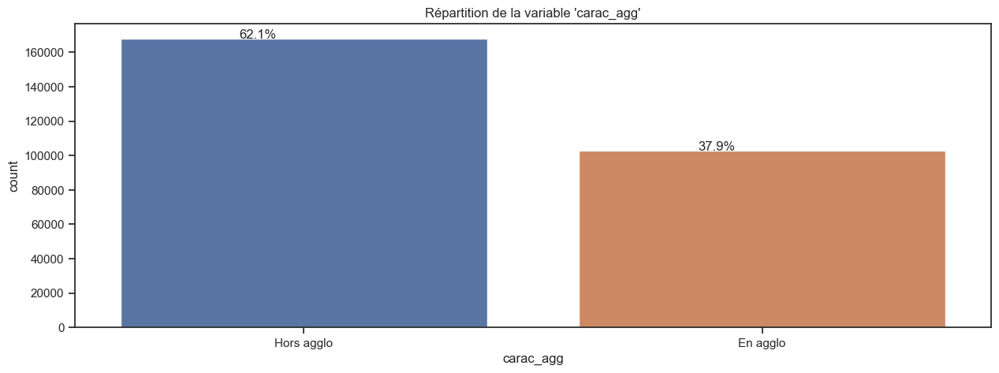

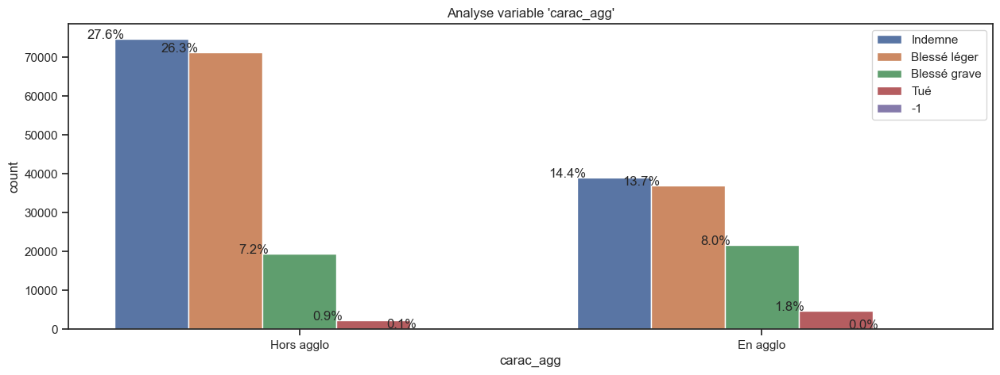

In [535]:
# CARAC_AGG - ANALYSE DETAILLE - Agglomération O/N
# ---------
analyse_variable_binaire(train, 'carac_agg', 'user_gravite', valna=-1, code_to_xlabel={'1': 'En agglo', '2': 'Hors agglo', '-1': 'NAN'})


<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_SEXE'__ : </span></u>

genre des usagers : donnée catégorielle binaire

<u>CONCLUSION <span style="color:red">__'USER_SEXE'__</span> :</u>
1. Quelques missiong values (1,5%) : aucune tendance identifiée sur ces enregistrements qui permettrait de remplacer les
   valeurs manquantes : à priori, cela ne concerne que les petits accidents sans aucune conséquence.
   Lorsque la variable sexe n'est pas renseignée, de nombreux autres champs (liés à user) semblent manquants également
2. Transformations possibiles
   ==> 2 options à paramétrer dans la fonction transformation :
   - Remplacement des missing values par la modalité la plus représentée (1-Homme) : _PAR DEFAUT_
   - Suppression des enregistrements

3. Le test Statistique de chi2 donne une p-value > 98% : h0 ne peut être écartée :

   __==> LA VARIABLE <span style="color:red">'USER_SEXE'</span> DEVRA ETRE ECARTEE DES VARIABLES EXPLICATIVES --> à ajouter à pipeline_drop()__


Il y a 1.6 % de données manquantes (ou assimilées).

Répartition de la variable :

user_sexe
 1    0.674276
 2    0.309631
-1    0.016093
Name: proportion, dtype: float64

Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16815

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite   -1      0      1      2     3
user_sexe                                   
-1            215   4145      0      0     0
 1              0  78745  68959  29340  5639
 2              0  31111  39380  11842  1556

Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite        -1         0         1         2         3
user_sexe                                                     
-1            0.049312  0.950688  0.000000  0.000000  0.000000
 1            0.000000  0.431047  0.377479  0.160606  0.030868
 2            0.000000  0.370859  0.469430  0.141163  0.018548



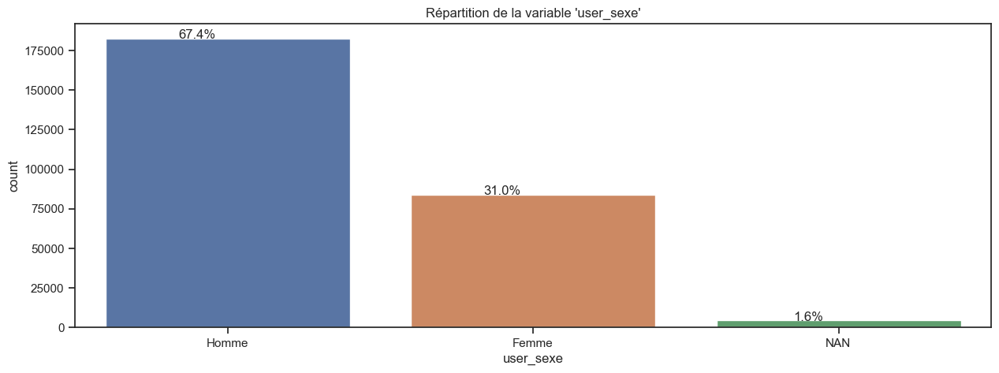

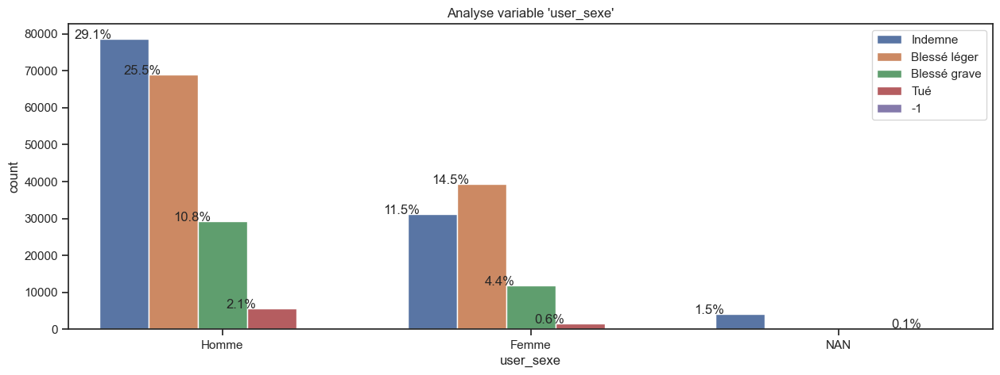

In [517]:
# USER_SEXE - Analyse Variable binaire
analyse_variable_binaire(train, 'user_sexe', 'user_gravite', valna=-1, code_to_xlabel={'1': 'Homme', '2': 'Femme', '-1' : 'NAN'})



In [518]:
# USER_SEXE - Analyse des missing values (inutile car p_value Chi2 > 99%)
analyse_valeurs_manquantes(train, 
                           'user_sexe', 
                           variables_continues=['user_an_nais'], 
                           variables_categorielles=['user_gravite', 'user_catu', 'user_actp', 'user_etatp', 'user_locp', 'user_place', 'user_secu1', 'user_secu2', 'user_secu3', 'user_trajet'])


Liste= ['user_an_nais', 'user_sexe']
La valeur médiane selon user_sexe : 

           user_an_nais
user_sexe              
-1               1993.0
 1               1986.0
 2               1986.0

Le mode selon user_sexe : 

           user_gravite  user_catu user_actp  user_etatp  user_locp  \
user_sexe                                                             
-1                    0          1        -1          -1          0   
 1                    0          1         0          -1          0   
 2                    1          1         0          -1          0   

           user_place  user_secu1  user_secu2  user_secu3  user_trajet  
user_sexe                                                               
-1                  1          -1          -1          -1           -1  
 1                  1           1          -1          -1            5  
 2                  1           1          -1          -1            5  

Proportion : 

user_gravite  user_sexe
-1            -

<u>ANALYSE DETAILLEE DE <span style="color:red">__'AGG_IS_CONDUCTEUR_VEHICULE'__ : </span></u>

indicateur portant la catégorie genrée du conducteur(rice)

<u>CONCLUSION <span style="color:red">__'AGG_IS_CONDUCTEUR_VEHICULE'__</span> :</u>
1. Aucune missing value
2. Aucune transformation à prévoir (pas de missing value et variable binaire)
3. Le test statistique du chi2 donne une p-value proche de 0% ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)

  __==> LA VARIABLE <span style="color:red">'AGG_IS_CONDUCTEUR_VEHICULE'</span> POURRA ETRE CONSERVEE EN L'ETAT COMME VARIABLES EXPLICATIVES__


Il y a 0.0 % de données manquantes (ou assimilées).

Répartition de la variable :

agg_is_conducteur_vehicule
1    0.743467
0    0.256533
Name: proportion, dtype: float64

Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16815

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite                 -1      0      1      2     3
agg_is_conducteur_vehicule                                
0                             0  28801  30947   8580  1175
1                           215  85200  77392  32602  6020

Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite                      -1         0         1         2         3
agg_is_conducteur_vehicule                                                  
0                           0.000000  0.414385  0.445261  0.123448  0.016906
1                           0.001067  0.422978  0.384215  0.161854  0.029886



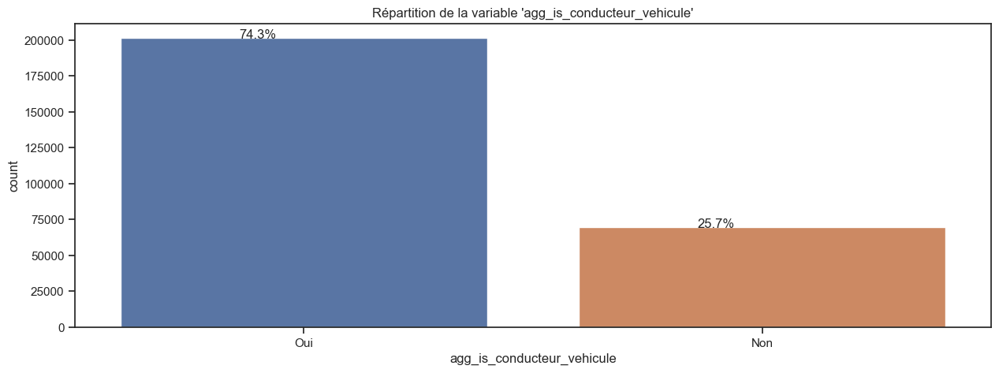

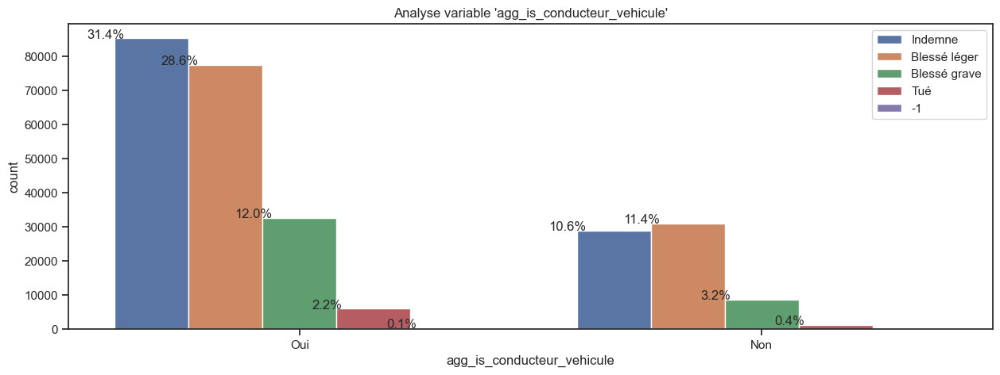

In [519]:
# Variable catégorielle binaire
analyse_variable_binaire(train, 'agg_is_conducteur_vehicule', 'user_gravite', valna=-1, code_to_xlabel={'0': 'Non', '1': 'Oui', '-1' : 'NAN'})




<u>ANALYSE DETAILLEE DE <span style="color:red">__'AGG_IS_CONDUCTRICE_VEHICULE'__ : </span></u>

indicateur portant la catégorie genrée du conducteur(rice)

<u>CONCLUSION <span style="color:red">__'AGG_IS_CONDUCTRICE_VEHICULE'__</span> :</u>
1. Aucune missing value
2. Aucune transformation à prévoir (pas de missing value et variable binaire)
3. Le test statistique du chi2 donne une p-value proche de 0% ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)

  __==> LA VARIABLE <span style="color:red">'AGG_IS_CONDUCTRICE_VEHICULE'</span> POURRA ETRE CONSERVEE EN L'ETAT COMME VARIABLES EXPLICATIVES__


Il y a 0.0 % de données manquantes (ou assimilées).

Répartition de la variable :

agg_is_conductrice_vehicule
0    0.746929
1    0.253071
Name: proportion, dtype: float64

Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16815

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite                  -1      0      1      2     3
agg_is_conductrice_vehicule                                
0                            215  85321  77981  32804  6046
1                              0  28680  30358   8378  1149

Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite                       -1         0         1         2         3
agg_is_conductrice_vehicule                                                  
0                            0.001062  0.421615  0.385344  0.162102  0.029876
1                            0.000000  0.418289  0.442762  0.122191  0.016758



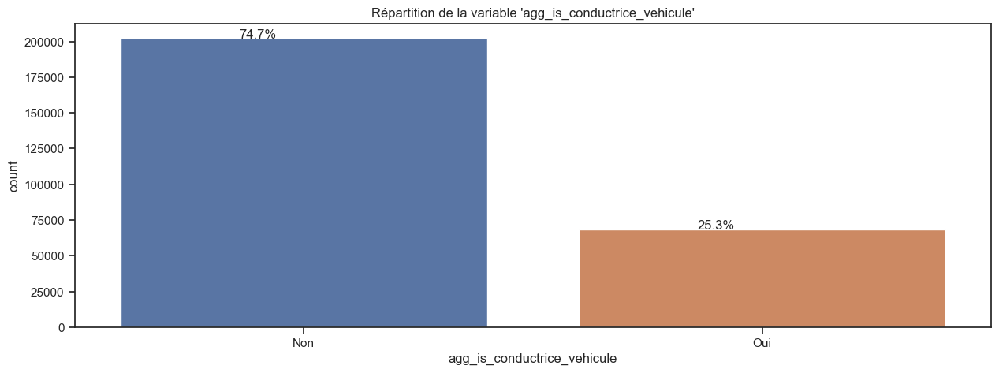

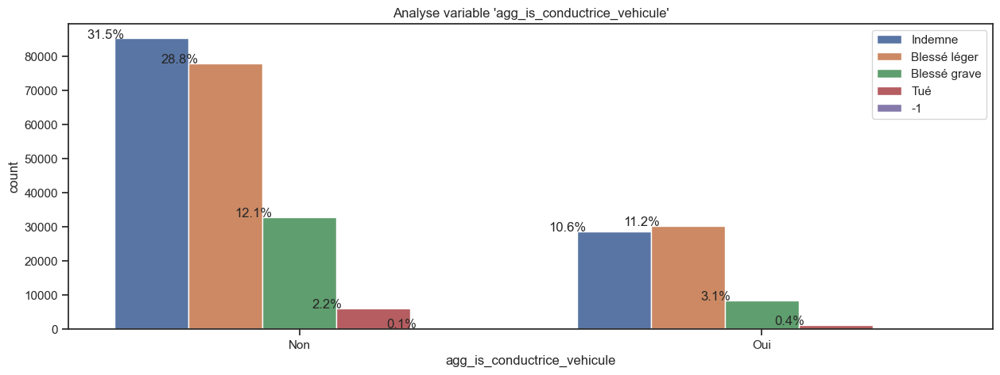

In [520]:
# Variable catégorielle binaire
analyse_variable_binaire(train, 'agg_is_conductrice_vehicule', 'user_gravite', valna=-1, code_to_xlabel={'0': 'Non', '1': 'Oui', '-1' : 'NAN'})




#### &#8195;
__<u> <span style="color:green">ETAPE 3.3.2 - Analyse des Variable catégorielles non binaire</span></u>__

##### INITIALISATION PRE ANALYSE : PERMET DE Définir les plages de taux ainsi que le dataset (initial, rééquilibrer à privilégier

In [58]:
# ANALYSE SUR DATASET INITIAL
train = save_train.copy()
liste_taux = np.arange(0, 5.0, 0.1)

# ANALYSE SUR DATASET REEQUILIBRE VIA SMOTE
#train = x_train_smote.copy()
#liste_taux = np.arange(5, 35, 0.1)

# ANALYSE SUR DATASET REEQUILIBRE VIA SMOTE
#train = x_train_ro.copy()
#liste_taux = np.arange(5, 35, 0.1)

# Variable cible --> Suppression des missings values (normalement fait précédemment à l'étape d'analyse de la variable cible)
train = train[(train.user_gravite != -1)]



##### FICHIER __'CARAC'__

<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_ATM'__ : </span></u>

Conditions atmosphériques au moment de l'accident



Il y a 0.0% (23) de données manquantes (ou assimilées).
Il y a 10 modalités.

carac_atm
 1    0.802964
 2    0.103100
 8    0.036976
 3    0.020412
 7    0.018606
 5    0.007340
 9    0.004429
 4    0.003675
 6    0.002412
-1    0.000085
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.05701

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
carac_atm                              
-1                8     12      1     2
 1            91982  86513  33234  5647
 2            11599  12118   3535   659
 3             2291   2218    849   168
 4              440    372    162    21
 5              724    713    428   122
 6              220    223    175    35
 7             2251   1513   1114   159
 8             4078   4170   1439   323
 9              408    487    245    59



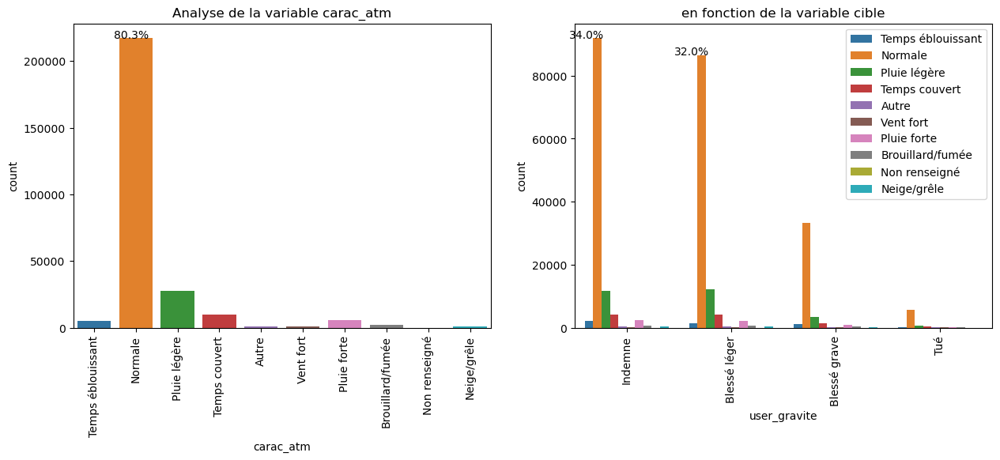

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_atm                                           
-1            0.347826  0.521739  0.043478  0.086957
 1            0.423147  0.397988  0.152887  0.025978
 2            0.415571  0.434166  0.126653  0.023611
 3            0.414586  0.401375  0.153637  0.030402
 4            0.442211  0.373869  0.162814  0.021106
 5            0.364368  0.358832  0.215400  0.061399
 6            0.336907  0.341501  0.267994  0.053599
 7            0.446893  0.300377  0.221163  0.031566
 8            0.407393  0.416583  0.143756  0.032268
 9            0.340284  0.406172  0.204337  0.049208


Meilleurs résultats obtenu avec taux= 3.3000000000000003
Liste des modalités retenues en modalité de regroupement 1 : [-1, 5, 6, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.03339



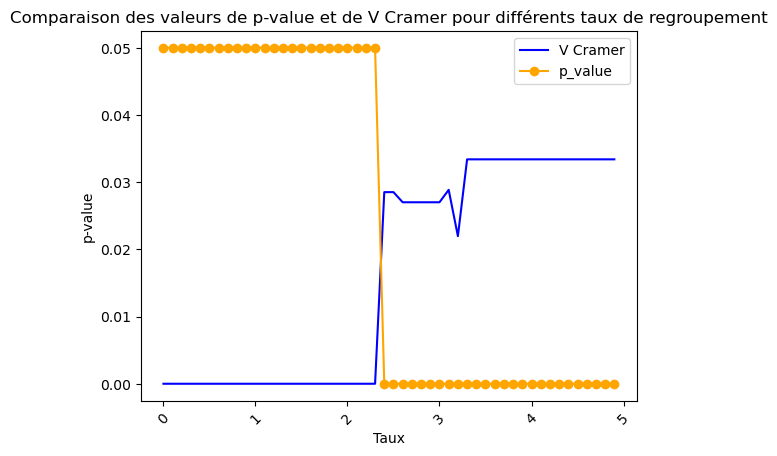

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 2.3000000000000003
Liste des modalités regroupées dans la nouvelle catégorie 10 : [4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.05701



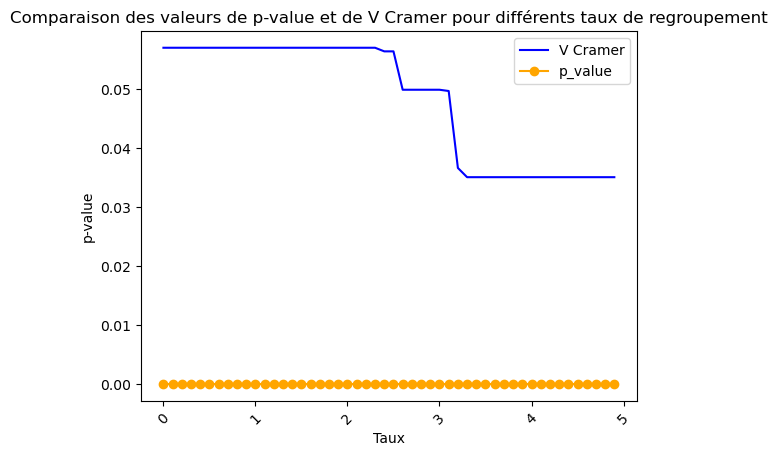


Optimisation Corrélation variable 'carac_atm':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [59]:
# 'carac_atm'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '1' : 'Normale', 
    '2' : 'Pluie légère', 
    '3' : 'Pluie forte', 
    '4' : 'Neige/grêle', 
    '5' : 'Brouillard/fumée', 
    '6' : 'Vent fort', 
    '7' : 'Temps éblouissant', 
    '8' : 'Temps couvert',
    '9' : 'Autre'
}

new_rgmt = analyse_variable_categorielle(train, 'carac_atm', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=25.0, rotation_xlabel=90)




Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

carac_atmMV
1    0.809458
2    0.085497
8    0.024555
3    0.023965
7    0.017691
5    0.013186
4    0.013110
6    0.009653
9    0.002783
0    0.000103
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.17320

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
carac_atmMV                             
0                 0      0      5     42
1             91990  91376  93926  91824
2             11599  12457   7623   7308
3              2291   2333   2803   3501
4               440    468   1916   3154
5               724    792   1918   2579
6               220    298   1535   2349
7              2251   1578   2184   2054
8              4078   4208   1820   1091
9               408    491    271     99



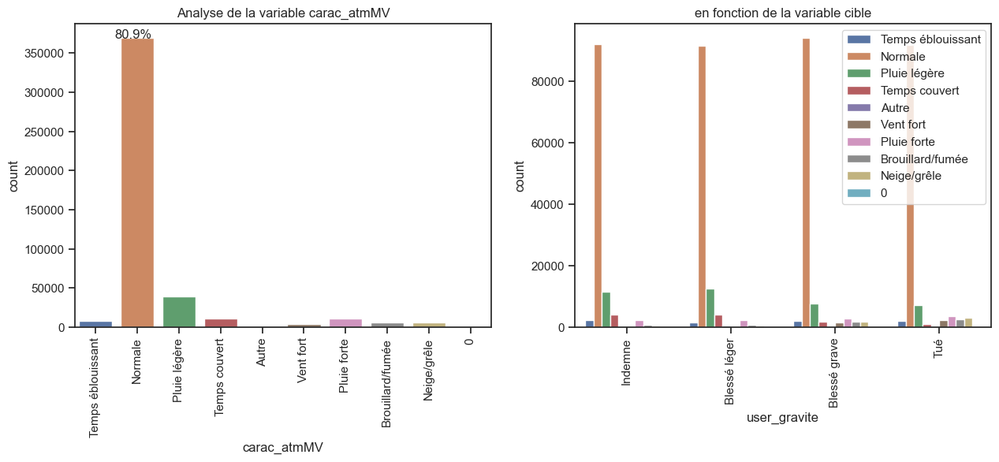

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_atmMV                                         
0             0.000000  0.000000  0.106383  0.893617
1             0.249217  0.247554  0.254462  0.248767
2             0.297509  0.319517  0.195527  0.187447
3             0.209645  0.213488  0.256497  0.320370
4             0.073603  0.078287  0.320509  0.527601
5             0.120406  0.131715  0.318976  0.428904
6             0.049977  0.067697  0.348705  0.533621
7             0.279038  0.195612  0.270733  0.254618
8             0.364205  0.375815  0.162544  0.097437
9             0.321513  0.386919  0.213554  0.078014


Meilleurs résultats obtenu avec taux= 32.0999999999999
Liste des modalités retenues en modalité de regroupement 1 : [0, 4, 5, 6]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.13237



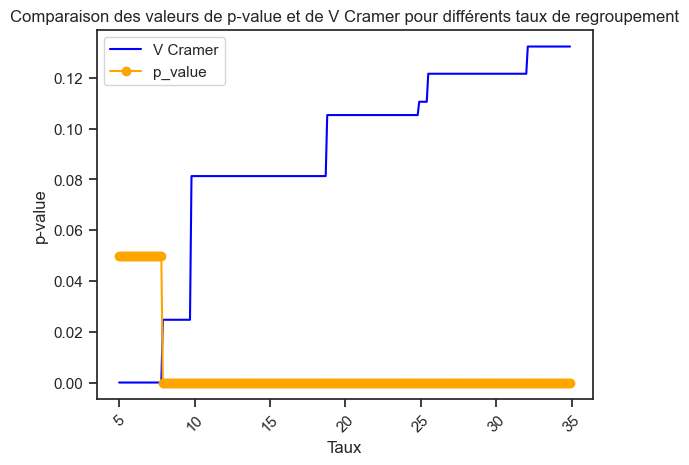

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 9.699999999999983
Liste des modalités regroupées dans la nouvelle catégorie 10 : [9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.17320



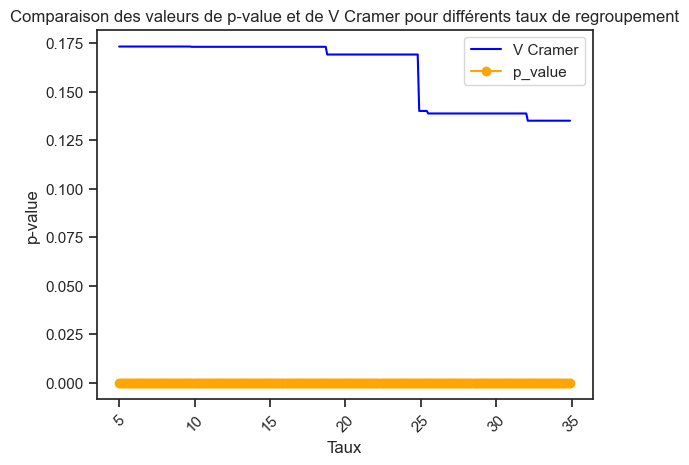


Optimisation Corrélation variable 'carac_atmMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [771]:
# 'CARAC_ATM' - Remplacement des missing values
train['carac_atmMV'] = train.carac_atm.fillna(train.carac_atm.mode()[0])                      # valeur NaN si existante
train['carac_atmMV'] = train.carac_atm.replace(-1, train.carac_atm.mode()[0]).astype(int)     # valeur -1 si existante

new_rgmt = analyse_variable_categorielle(train, 'carac_atmMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=25.0, rotation_xlabel=90)



<u>CONCLUSION <span style="color:red">__'CARAC_ATM'__</span> :</u>
1. Très peu de missing value (23 au total) : Le remplacement par la modalité n'a pas d'incidence sur le Test de Cramer 
2. 9 modalités : les deux premières représentent plus de 90%
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) : 
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0,057)
   - après missing Values via classe : V Cramer =0.057
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.17329
6. Regroupement (binaire) des catégories entre elles : aucune amélioration notable
7. Regroupement (non binaire) : aucune amélioration notable

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'CARAC_ATM'__</span> :</u>

  __==> REMPLACEMENT DES MISSING VALUES PAR LA MODALITE LA PLUS REPRESENTEE OU MAINTIEN DE LA CATEGORIE '-1'__
  
  <span style="color:red">__==> UN RETRAIT DE CETTE VARIABLE DU SCOPE DES VARIABLES EXPLICATIVE AURAIT DU SENS__</span>

###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_COL'__ : </span></u>

Type de Collision



Il y a 1.0% (2955) de données manquantes (ou assimilées).
Il y a 9 modalités.

carac_col
 6    0.260732
 3    0.253903
 2    0.135244
 1    0.127284
 4    0.085238
 5    0.083363
 7    0.045526
-1    0.006480
 0    0.002228
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.29041

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
carac_col                               
-1             1353   1123    445     34
 0                0     50    647    319
 1            11185  11791  17756  17310
 2            18407  18001  13214  12050
 3            40325  36300  24366  14790
 4            10487   7408   8969  12005
 5             7361   5447  10273  14933
 6            22198  25552  31401  39744
 7             2685   8329   6930   2816



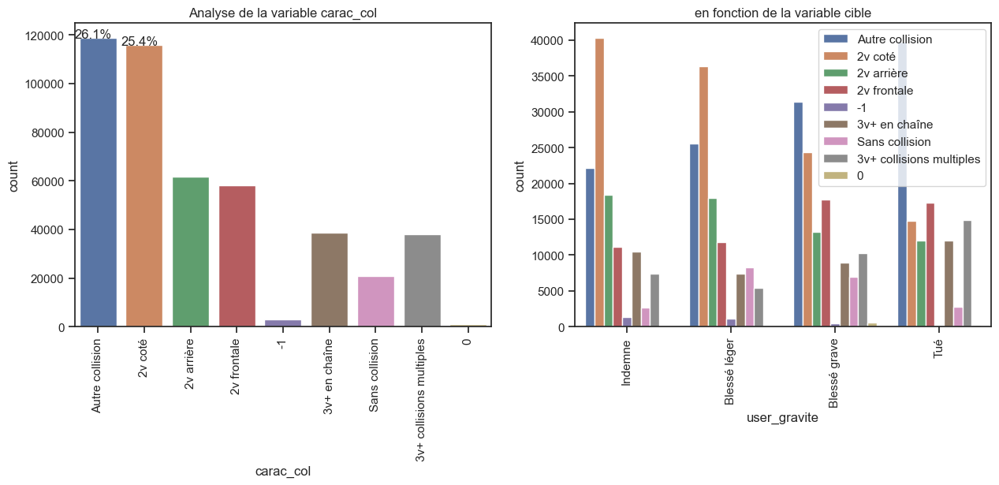

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_col                                           
-1            0.457868  0.380034  0.150592  0.011506
 0            0.000000  0.049213  0.636811  0.313976
 1            0.192705  0.203146  0.305916  0.298232
 2            0.298466  0.291883  0.214263  0.195389
 3            0.348287  0.313523  0.210449  0.127741
 4            0.269804  0.190589  0.230749  0.308858
 5            0.193639  0.143289  0.270243  0.392829
 6            0.186703  0.214912  0.264107  0.334278
 7            0.129335  0.401204  0.333815  0.135645


Meilleurs résultats obtenu avec taux= 19.599999999999948
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 4, 5, 6]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.24825



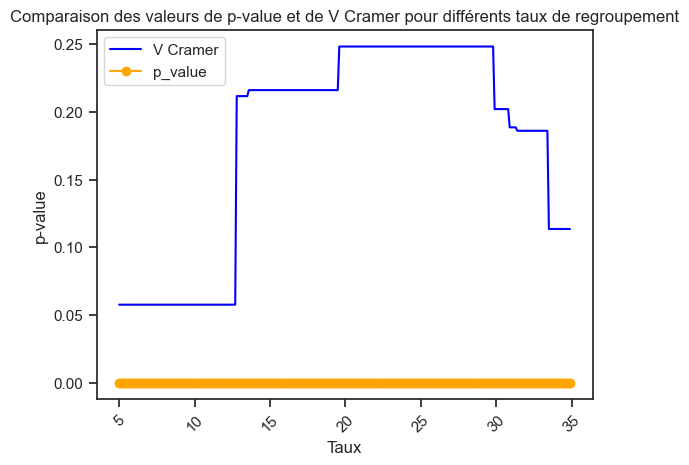

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 8
Meilleurs résultats obtenu avec taux= 12.699999999999973
Liste des modalités regroupées dans la nouvelle catégorie 8 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.29041



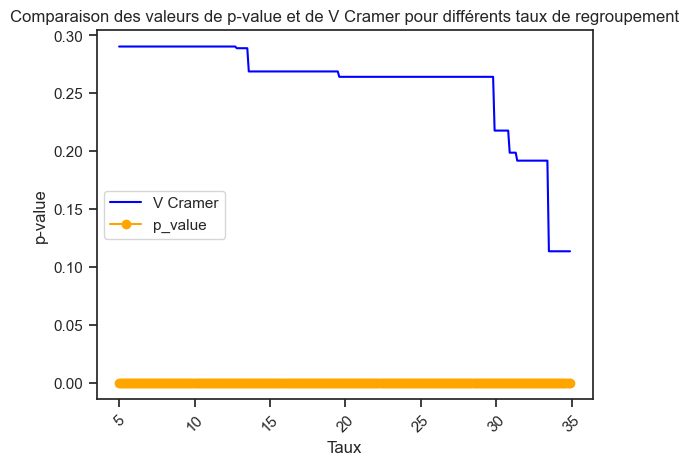


Optimisation Corrélation variable 'carac_col':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [773]:
# 'carac_col'
code_to_huelabel = {
    '1' : '2v frontale', 
    '2' : '2v arrière', 
    '3' : '2v coté', 
    '4' : '3v+ en chaîne', 
    '5' : '3v+ collisions multiples', 
    '6' : 'Autre collision', 
    '7' : 'Sans collision'
}

new_rgmt = analyse_variable_categorielle(train, 'carac_col', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=25.0, rotation_xlabel=90)



Liste= ['carac_gps_lat', 'carac_gps_long', 'lieu_larrout', 'lieu_lartpc', 'lieu_vma', 'carac_col']
La valeur médiane selon carac_col : 

           carac_gps_lat  carac_gps_long  lieu_larrout  lieu_lartpc  lieu_vma
carac_col                                                                    
-1             47.393684        2.470510          -1.0          2.0      50.0
 1             46.175200        2.557600          -1.0          2.0      50.0
 2             48.113873        2.401894          -1.0          2.0      50.0
 3             47.977912        2.386693          -1.0          2.0      50.0
 4             48.502830        2.381773          -1.0          3.0      80.0
 5             47.000846        2.469300          -1.0          2.0      80.0
 6             47.999160        2.388331          -1.0          2.0      50.0
 7             47.437464        2.387500          -1.0          2.0      50.0

Le mode selon carac_col : 

           carac_atm  carac_com  carac_dept  carac_int

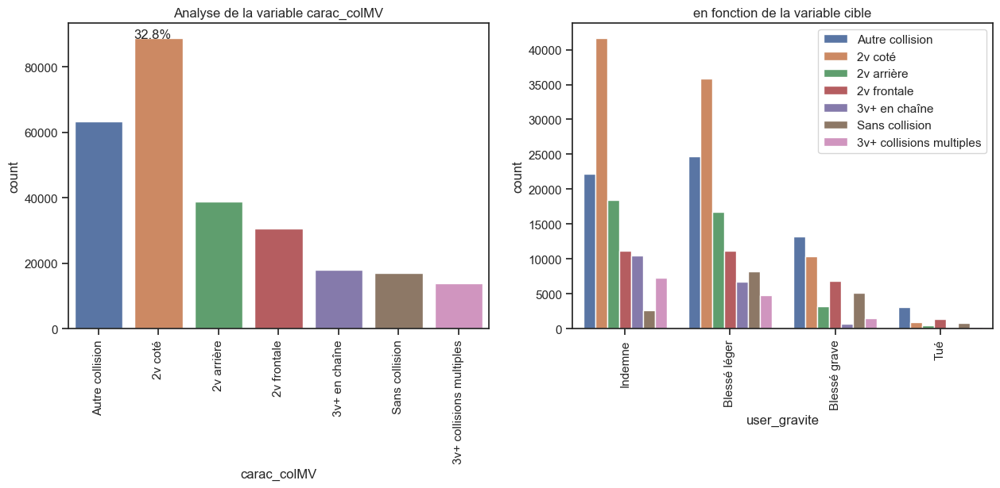

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_colMV                                         
1             0.365571  0.364557  0.225193  0.044679
2             0.473797  0.432510  0.082008  0.011686
3             0.469278  0.403105  0.116897  0.010719
4             0.580836  0.372030  0.041429  0.005705
5             0.524848  0.346738  0.105668  0.022745
6             0.350154  0.390536  0.209606  0.049704
7             0.158099  0.485368  0.306542  0.049991


Meilleurs résultats obtenu avec taux= 2.3000000000000003
Liste des modalités retenues en modalité de regroupement 1 : [1, 6, 7]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.23336



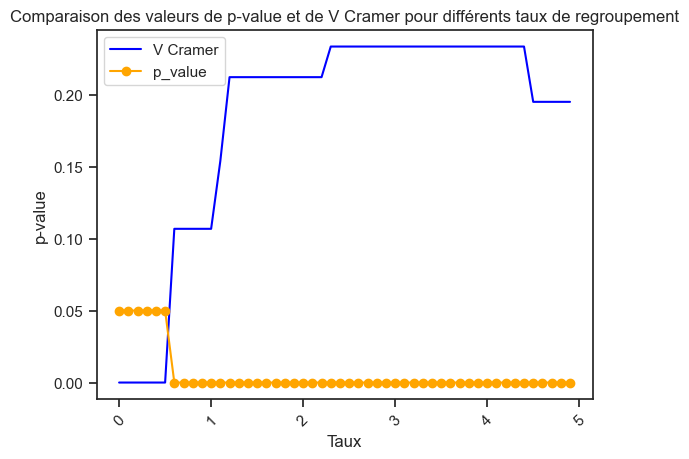

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 8
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 8 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.26385



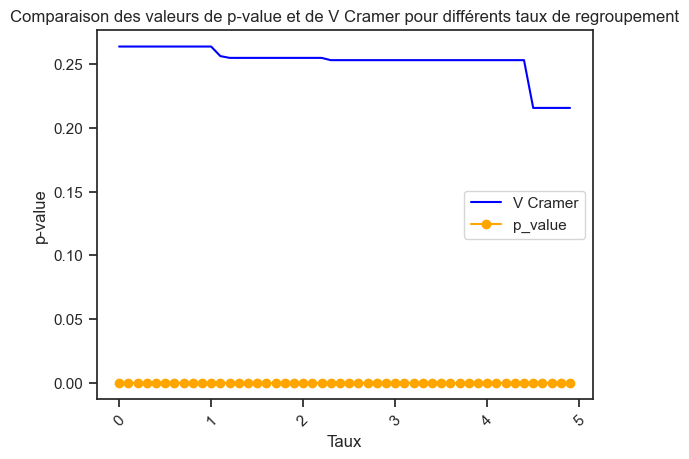


Optimisation Corrélation variable 'carac_colMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [659]:
# 'CARAC_COL' - analyse de la meilleure sttratégie de remplacement des missing values
liste_variables_categorielles = []

analyse_valeurs_manquantes(train, 'carac_col', 
                           variables_continues=['carac_gps_lat', 'carac_gps_long', 'lieu_larrout', 'lieu_lartpc', 'lieu_vma'], 
                           variables_categorielles=['carac_atm', 'carac_com', 'carac_dept', 'carac_int', 'carac_lum', 'lieu_catr', 'lieu_circ', 
                                                    'user_secu2', 'user_secu3', 'user_trajet', 'lieu_infra', 'lieu_nbv', 'lieu_plan', 'lieu_prof', 
                                                    'lieu_situ', 'lieu_surf', 'lieu_vosp'])

# ==> aucune tendance ne ressort ==> on privilégiera le mode[0]

# Remplacement des missing values
train['carac_colMV'] = train.carac_col.fillna(train.carac_col.mode()[0])                      # valeur NaN si existante
train['carac_colMV'] = train.carac_col.replace(-1, train.carac_col.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'carac_colMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=25.0, rotation_xlabel=90)

# ==> Dégradation de Cramer --> maintien de la catégorie '-1' pour les Missing Values

<u>CONCLUSION <span style="color:red">__'CARAC_COL'__</span> :</u>
1. Quelques missing value (1% soit 2910 au total) : l'analyse détaillée n'a pas permis de faire ressortir de tendance.
2. Remplacement des missing Values par la modalité la plus fréquente n'impacte pas le test de Cramer
3. 7 modalités : les deux premières représentent plus de 55%, 3 premières=70% et 4 premières=80%
4. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
5. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.264)
   - après missing Values via classe : V Cramer =0.057
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.29041
6. Regroupement (binaire) des catégories entre elles : si la corrélation de cette nouvelle variable est maintenue, le test de Cramer des modalités regroupées n'atteint pas la valeur sans regroupement (0,033) ==> intérêt de réaliser ce regroupement est peu évident.
7. Regroupement (binaire) après avoir remplacer les missing values par la modalité la plus représentée : pas de différence notable

  
###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'CARAC_COL'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR LA MODALITE LA PLUS FREQUENTE__



###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_COM'__ : </span></u>

Commune de l'accident



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 906 modalités.

carac_com
113    0.009292
116    0.008553
7      0.008007
112    0.007458
69     0.007182
117    0.007125
118    0.007000
63     0.006550
119    0.006542
4      0.006375
115    0.006303
66     0.005805
120    0.005649
108    0.005568
114    0.005555
213    0.005550
302    0.005360
209    0.005355
5      0.005340
27     0.005101
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.35935

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite     0     1    2    3
carac_com                         
1              806   831  408  142
2              416   461  317  263
3              291   265  401  249
4              876   945  630  456
5              790   864  438  343
6              257   270  430  296
7             1258  1238  755  400
8              401   382  388  326
9              292   311  336  305
10        

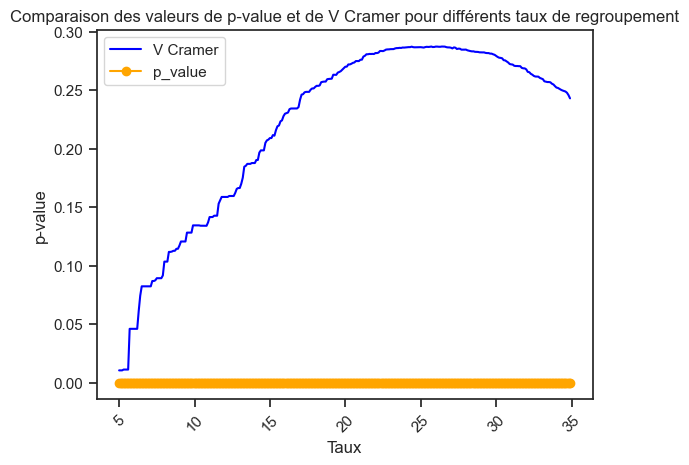

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 909
Meilleurs résultats obtenu avec taux= 5.199999999999999
Liste des modalités regroupées dans la nouvelle catégorie 909 : [869, 871, 875, 878, 882, 888, 892, 896, 900, 906, 907]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.35929



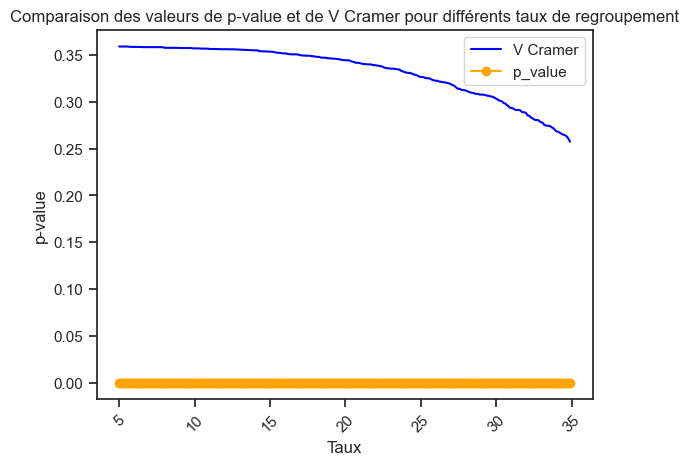


Optimisation Corrélation variable 'carac_com':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [783]:
new_rgmt = analyse_variable_categorielle(train, 'carac_com', valna=-1, liste_taux=liste_taux, limiteModalite=20)  # pas d'affichage de graphe de dist.


<u>CONCLUSION <span style="color:red">__'CARAC_COM'__</span> :</u>
1. Aucune missing value
2. plus de 850 modalités avec une distribution relativement homogène
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.260)
   - après missing Values via classe :
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.35935
     
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration


###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'CARAC_COM'__</span> :</u>


  __==> AUCUNE, LA VARIABLE POURRA ETRE UTILISEE EN L'ETAT__

  __==> UN ONE HOT ENCODING POURRAIT ETRE INTERESSANT A TESTER__

###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_DEPT'__ : </span></u>

Département de l'accident



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 218 modalités.

carac_dept
75     0.061201
13     0.037728
93     0.035243
69     0.032245
92     0.029050
94     0.027263
33     0.021452
91     0.017706
59     0.016776
83     0.015873
974    0.014318
77     0.014081
6      0.013803
64     0.013623
31     0.012971
76     0.012917
29     0.012853
35     0.012770
34     0.012570
78     0.012546
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.45390

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite     0     1     2     3
carac_dept                          
1              812   941   847   532
2              350   289   597   565
3              459   315   749   555
4              343   325   749   621
5              479   518   815   643
6             1777  1772  1692  1053
7              380   415   852   758
8              170   142   629   722
9              327   359

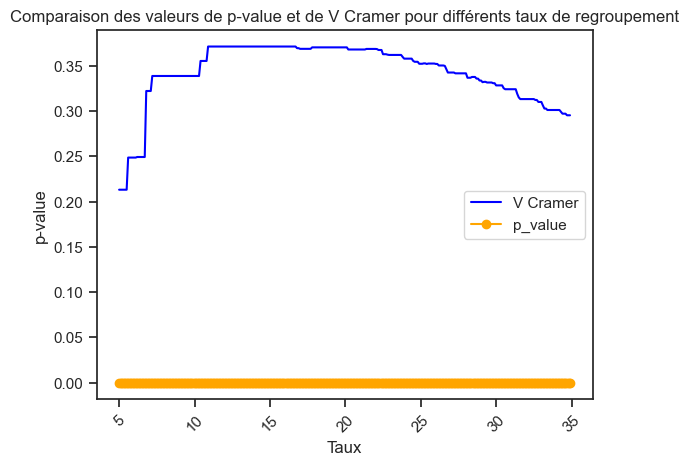

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 989
Meilleurs résultats obtenu avec taux= 5.499999999999998
Liste des modalités regroupées dans la nouvelle catégorie 989 : [93, 94, 95]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.45341



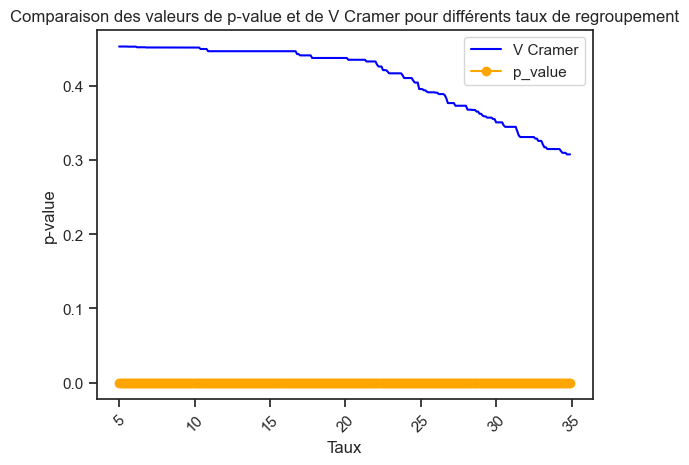


Optimisation Corrélation variable 'carac_dept':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [784]:
new_rgmt = analyse_variable_categorielle(train, 'carac_dept', valna=-1, liste_taux=liste_taux, limiteModalite=20)  # pas d'affichage de graphe de dist.


<u>CONCLUSION <span style="color:red">__'CARAC_DEPT'__</span> :</u>
1. Aucune missing value
2. 107 modalités avec une distribution relativement homogène
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.286)
   - après missing Values via classe :
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.45390
   
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'CARAC_DEPT'__</span> :</u>


  __==> AUCUNE, LA VARIABLE POURRA ETRE UTILISEE EN L'ETAT__

  __==> UN ONE HOT ENCODING POURRAIT ETRE INTERESSANT A TESTER__

###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_INT'__ : </span></u>

Département de l'accident



Il y a 0.0% (8) de données manquantes (ou assimilées).
Il y a 10 modalités.

carac_int
 1    0.693161
 2    0.118968
 3    0.081964
 6    0.028184
 9    0.026868
 4    0.023129
 5    0.012160
 7    0.010480
 8    0.005068
-1    0.000018
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.21761

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
carac_int                               
-1                4      4      0      0
 1            69518  71550  81885  93131
 2            16289  15931  13235   8795
 3            13393  12195   7646   4142
 4             2760   2730   2853   2204
 5              787    922   1930   1906
 6             4601   4263   2607   1381
 7             1331   1385    998   1065
 8              263    272    827    949
 9             5055   4749   2020    428



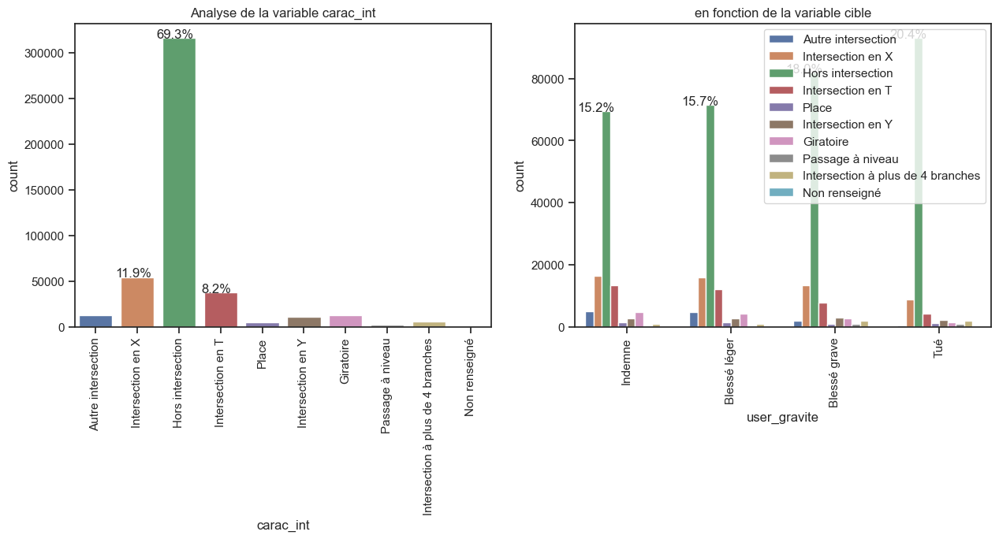

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_int                                           
-1            0.500000  0.500000  0.000000  0.000000
 1            0.219935  0.226364  0.259061  0.294640
 2            0.300258  0.293659  0.243963  0.162120
 3            0.358332  0.326279  0.204570  0.110820
 4            0.261686  0.258841  0.270503  0.208969
 5            0.141930  0.166276  0.348061  0.343733
 6            0.357999  0.331699  0.202848  0.107454
 7            0.278510  0.289810  0.208830  0.222850
 8            0.113804  0.117698  0.357854  0.410645
 9            0.412586  0.387610  0.164871  0.034933


Meilleurs résultats obtenu avec taux= 16.29999999999996
Liste des modalités retenues en modalité de regroupement 1 : [1, 4, 5, 7, 8]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.19808



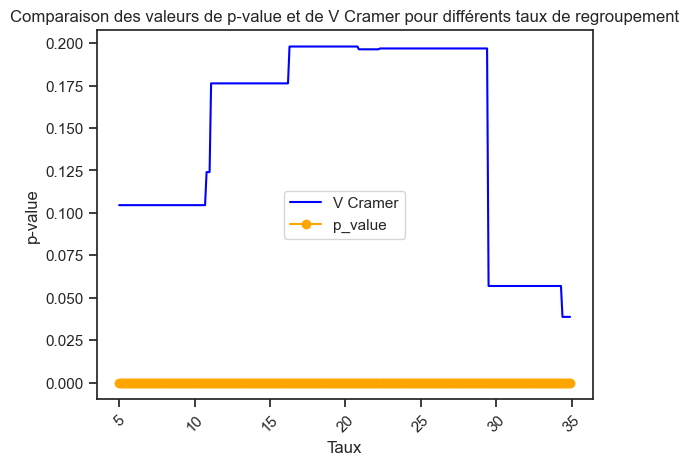

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 10.69999999999998
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.21761



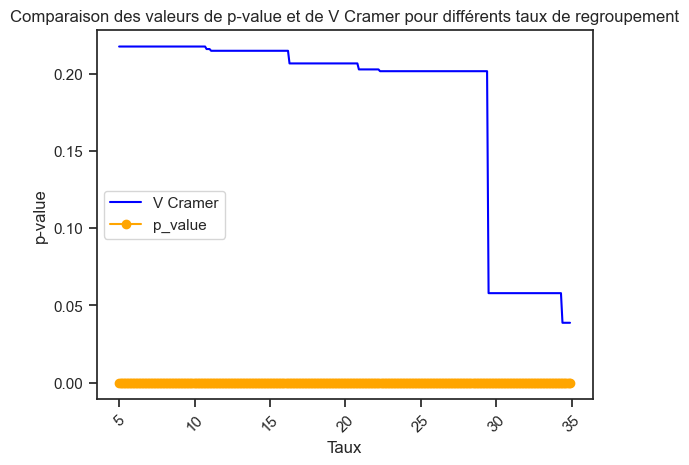


Optimisation Corrélation variable 'carac_int':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [785]:
code_to_huelabel = {
    '-1' : 'Non renseigné',
    '1' : 'Hors intersection', 
    '2' : 'Intersection en X', 
    '3' : 'Intersection en T', 
    '4' : 'Intersection en Y', 
    '5' : 'Intersection à plus de 4 branches', 
    '6' : 'Giratoire', 
    '7' : 'Place', 
    '8' : 'Passage à niveau', 
    '9' : 'Autre intersection'
}
new_rgmt = analyse_variable_categorielle(train, 'carac_int', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  





Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 9 modalités.

carac_intMV
1    0.635837
2    0.131824
3    0.108468
9    0.043296
6    0.038320
4    0.023161
7    0.010535
5    0.006368
8    0.002190
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.096

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
carac_intMV                            
1             69522  67884  28951  5775
2             16289  14953   4021   424
3             13393  11800   3771   400
4              2760   2543    851   116
5               787    779    142    16
6              4601   4135   1482   156
7              1331   1328    171    22
8               263    208     69    53
9              5055   4709   1724   233



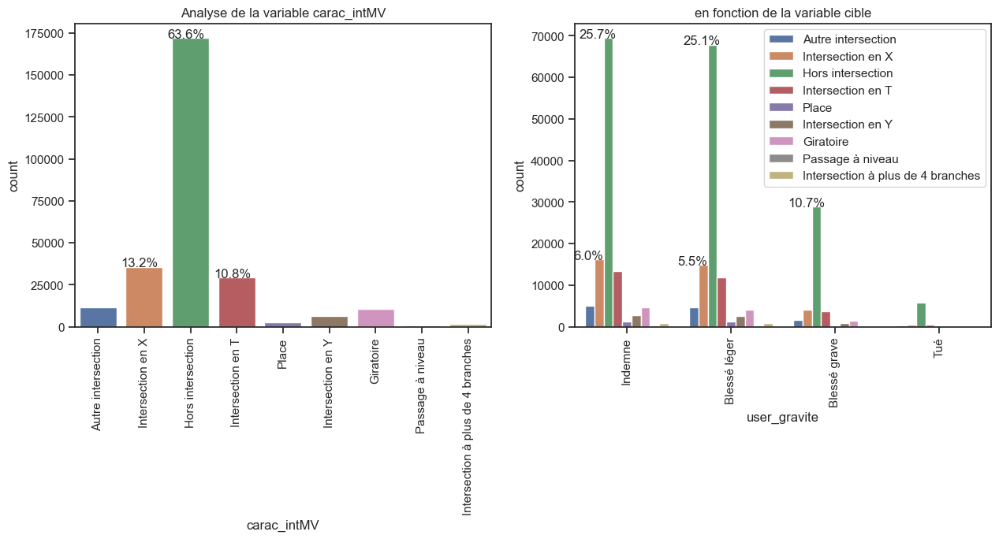

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_intMV                                         
1             0.403888  0.394372  0.168191  0.033550
2             0.456441  0.419004  0.112674  0.011881
3             0.456103  0.401853  0.128423  0.013622
4             0.440191  0.405582  0.135726  0.018501
5             0.456497  0.451856  0.082367  0.009281
6             0.443513  0.398593  0.142857  0.015038
7             0.466690  0.465638  0.059958  0.007714
8             0.443508  0.350759  0.116358  0.089376
9             0.431277  0.401758  0.147086  0.019879


Meilleurs résultats obtenu avec taux= 2.0
Liste des modalités retenues en modalité de regroupement 1 : [1, 8]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.08780



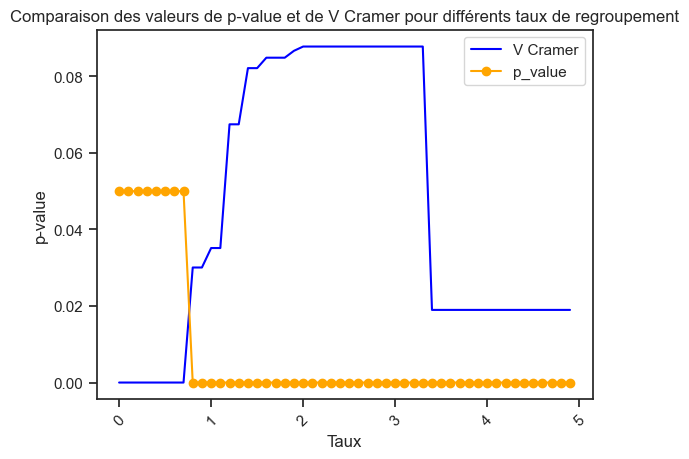

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.09557



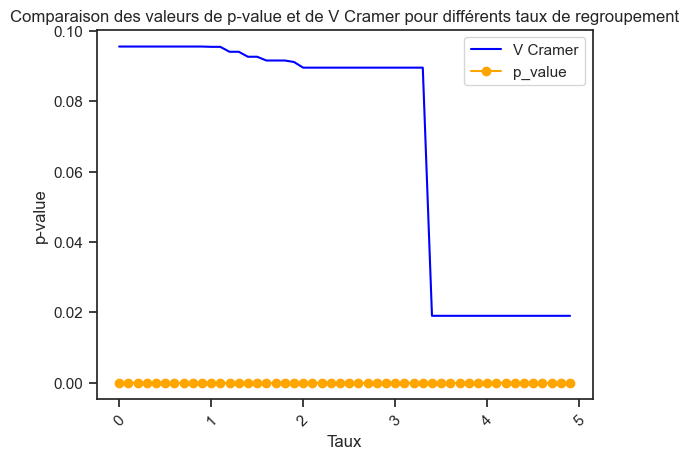


Optimisation Corrélation variable 'carac_intMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [657]:
# 'carac_int' - Remplacement des missing values
train['carac_intMV'] = train.carac_int.fillna(train.carac_int.mode()[0])                      # valeur NaN si existante
train['carac_intMV'] = train.carac_int.replace(-1, train.carac_int.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'carac_intMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'CARAC_INT'__</span> :</u>
1. 8 missing values : Le remplacement par la modalité la plus fréquente n'impacte pas le test de Cramer
2. 9 modalités : 2 modalités représentent 80% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.096)
   - après missing Values via classe :
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.21761
6. Regroupement (binaire) des catégories entre elles : aucune amélioration
7. Regroupement (non binaire) : aucune amélioration

  
###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'CARAC_COL'__</span> :</u>


  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__

<span style="color:red">__==> UN RETRAIT DE CETTE VARIABLE DU SCOPE DES VARIABLES EXPLICATIVE AURAIT DU SENS__</span>


###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'CARAC_LUM'__ : </span></u>

Luminosité au moment de l'accident



Il y a 0.0% (6) de données manquantes (ou assimilées).
Il y a 7 modalités.

carac_lum
 1    0.658825
 3    0.130025
 5    0.109098
 2    0.075210
 4    0.026809
 0    0.000020
-1    0.000013
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.25265

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
carac_lum                               
-1                2      3      0      1
 0                0      0      0      9
 1            79906  76593  76108  67820
 2             7189   7171   9075  10861
 3             8963  10278  15352  24699
 4              928   1249   3862   6186
 5            17013  18707   9604   4425



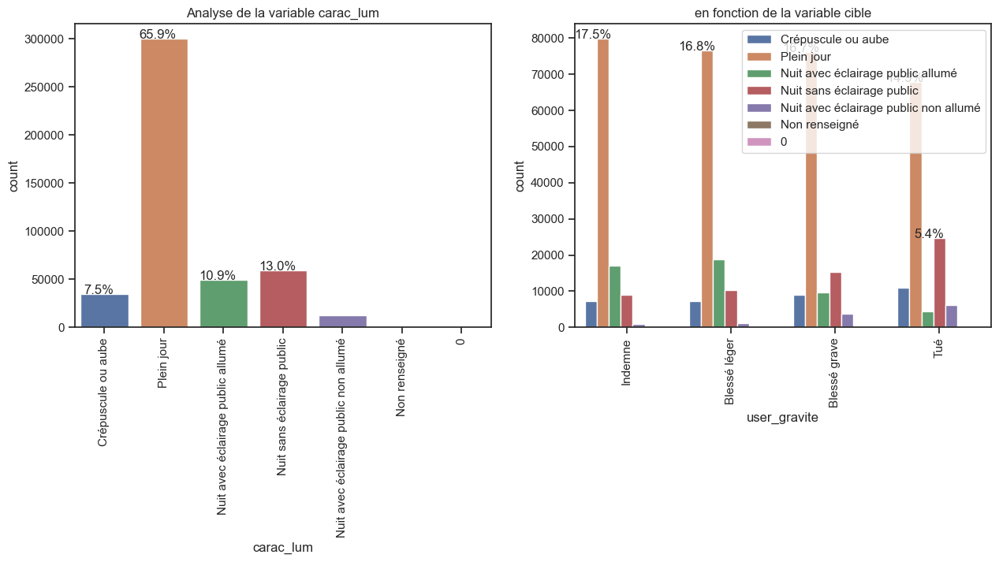

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_lum                                           
-1            0.333333  0.500000  0.000000  0.166667
 0            0.000000  0.000000  0.000000  1.000000
 1            0.265975  0.254947  0.253333  0.225745
 2            0.209616  0.209091  0.264608  0.316684
 3            0.151167  0.173345  0.258922  0.416565
 4            0.075910  0.102168  0.315910  0.506012
 5            0.341977  0.376028  0.193049  0.088947


Meilleurs résultats obtenu avec taux= 22.599999999999937
Liste des modalités retenues en modalité de regroupement 1 : [0, 2, 3, 4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.20399



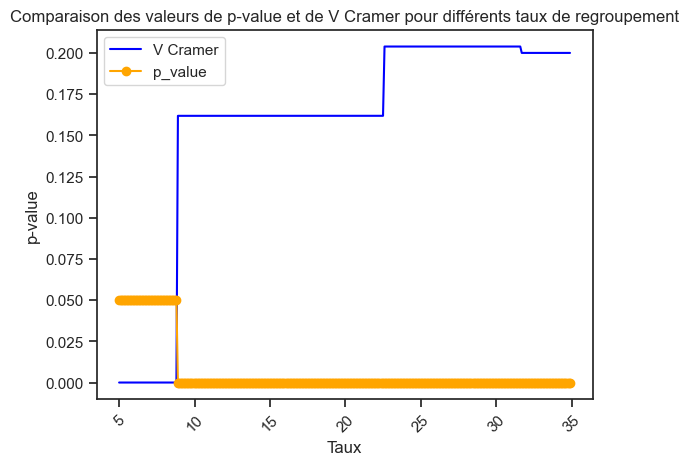

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 6
Meilleurs résultats obtenu avec taux= 16.59999999999996
Liste des modalités regroupées dans la nouvelle catégorie 6 : [5]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.25265



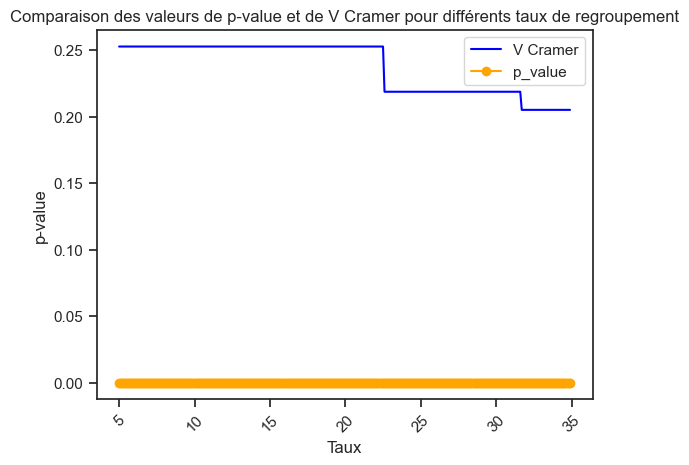


Optimisation Corrélation variable 'carac_lum':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [786]:
code_to_huelabel = {
    '-1' : 'Non renseigné',
    '1' : 'Plein jour', 
    '2' : 'Crépuscule ou aube', 
    '3' : 'Nuit sans éclairage public', 
    '4' : 'Nuit avec éclairage public non allumé', 
    '5' : 'Nuit avec éclairage public allumé'
}
new_rgmt = analyse_variable_categorielle(train, 'carac_lum', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 5 modalités.

carac_lumMV
1    0.678177
5    0.150929
3    0.097456
2    0.064606
4    0.008832
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.119

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
carac_lumMV                            
1             79908  72633  26931  4122
2              7189   6799   2986   516
3              8963   9777   5897  1746
4               928    975    386   102
5             17013  18155   4982   709



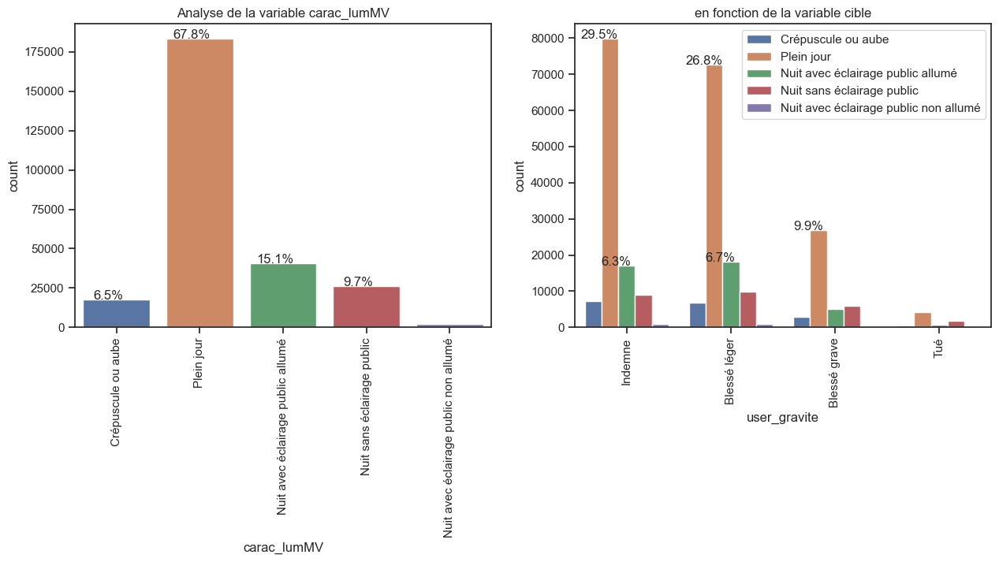

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
carac_lumMV                                         
1             0.435243  0.395618  0.146688  0.022452
2             0.411035  0.388736  0.170726  0.029503
3             0.339726  0.370580  0.223515  0.066179
4             0.388122  0.407779  0.161439  0.042660
5             0.416383  0.444333  0.121932  0.017352


Meilleurs résultats obtenu avec taux= 4.3
Liste des modalités retenues en modalité de regroupement 1 : [3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.10920



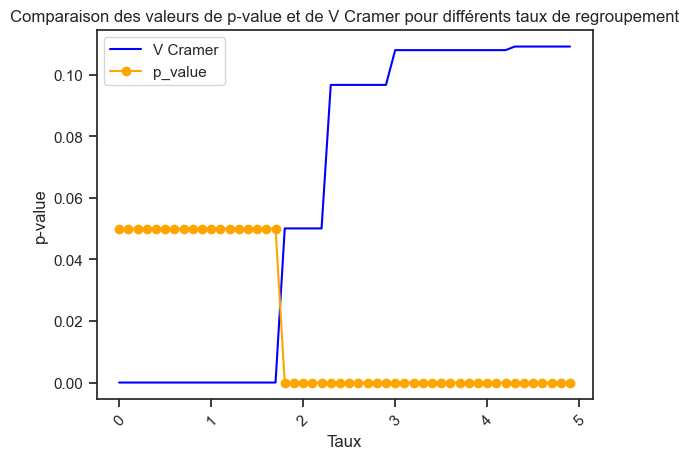

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 6
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 6 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.11889



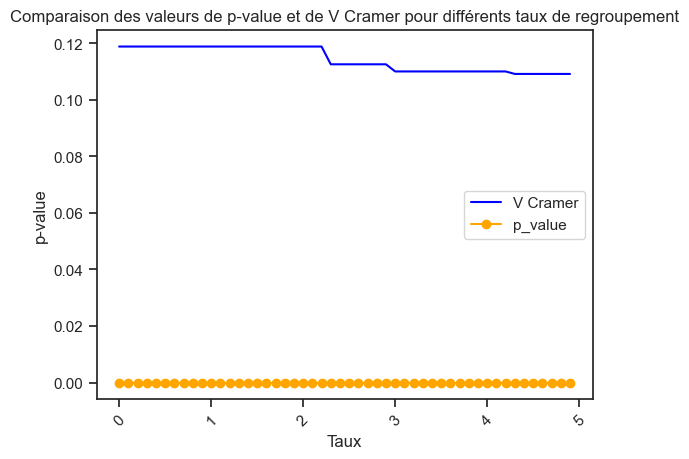


Optimisation Corrélation variable 'carac_lumMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [648]:
# 'carac_lum' - Remplacement des missing values
train['carac_lumMV'] = train.carac_lum.fillna(train.carac_lum.mode()[0])                      # valeur NaN si existante
train['carac_lumMV'] = train.carac_lum.replace(-1, train.carac_lum.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'carac_lumMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'CARAC_LUM'__</span> :</u>
1. 6 missing value : remplacement par la modalité n'a pas d'incidence sur le test de Cramer.
2. 6 modalités : 2 modalités représentent 82% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.119)
   - après missing Values via classe : Cramer=0.119
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.25265
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'CARAC_LUM'__</span> :</u>


  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  




##### FICHIER __'LIEU'__

<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_CATR'__ : </span></u>

Catégorie de route


Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 9 modalités.

lieu_catr
3    0.466294
4    0.284436
2    0.106003
1    0.095142
7    0.023397
6    0.011320
5    0.009263
9    0.003272
8    0.000873
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.39861

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
lieu_catr                               
1             14443  14040   6846   8056
2              7974   8043  11937  20384
3             38381  37233  66719  70299
4             47700  49088  22635  10281
5                85    204   1756   2179
6               847    730   1731   1854
7              4023   4133   1866    647
8                 0     13    194    191
9               548    517    317    110



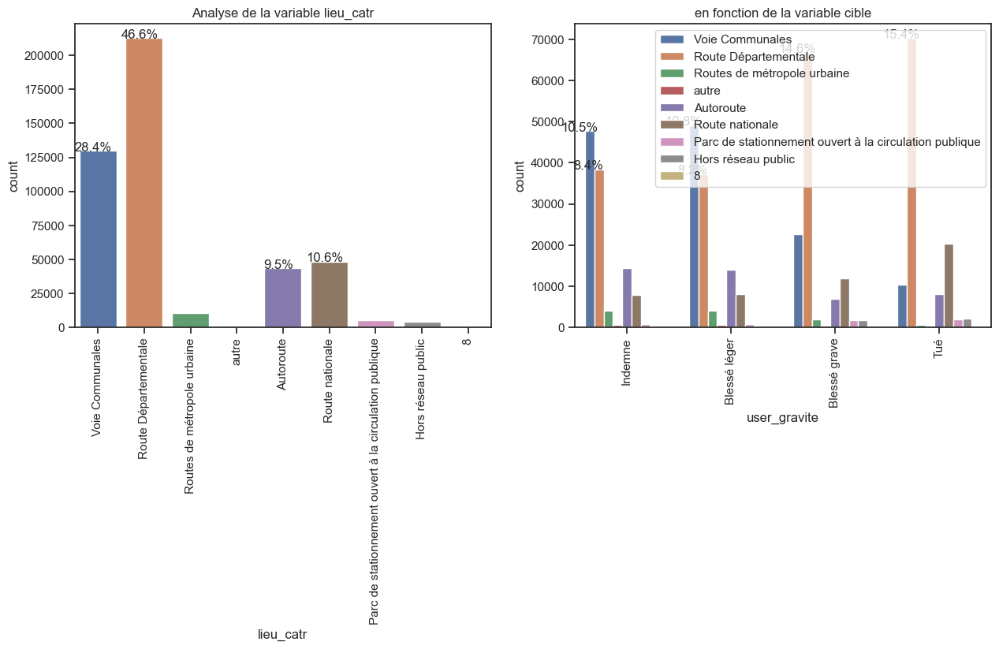

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_catr                                           
1             0.332903  0.323614  0.157796  0.185686
2             0.164963  0.166391  0.246949  0.421697
3             0.180504  0.175105  0.313777  0.330613
4             0.367760  0.378462  0.174513  0.079265
5             0.020123  0.048295  0.415720  0.515862
6             0.164084  0.141418  0.335335  0.359163
7             0.377074  0.387384  0.174899  0.060643
8             0.000000  0.032663  0.487437  0.479899
9             0.367292  0.346515  0.212466  0.073727


Meilleurs résultats obtenu avec taux= 18.59999999999995
Liste des modalités retenues en modalité de regroupement 1 : [2, 3, 5, 6, 8]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.38227



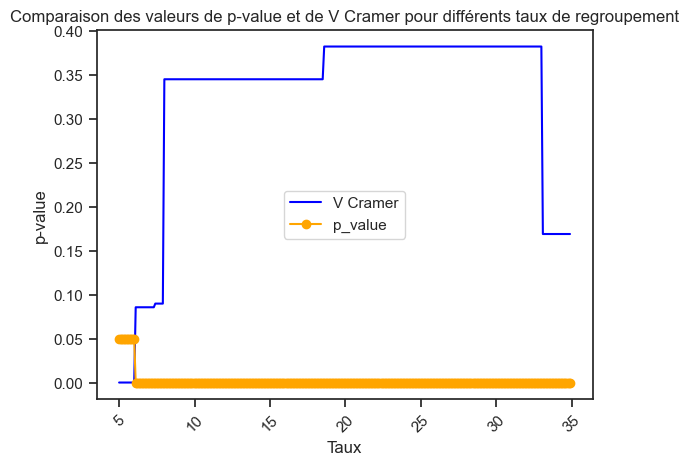

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 5.9999999999999964
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.39861



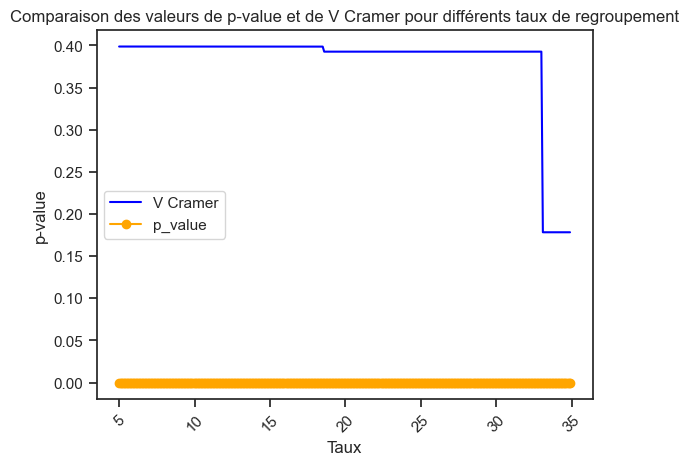


Optimisation Corrélation variable 'lieu_catr':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [787]:
# 'lieu_catr'
code_to_huelabel = {
    '1' : 'Autoroute',
    '2' : 'Route nationale',
    '3' : 'Route Départementale',
    '4' : 'Voie Communales',
    '5' : 'Hors réseau public',
    '6' : 'Parc de stationnement ouvert à la circulation publique',
    '7' : 'Routes de métropole urbaine',
    '9' : 'autre' 
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_catr', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_CATR'__</span> :</u>
1. Aucune missing value
2. 8 modalités : 3 modalités représentent 87% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.185)
   - après missing Values via classe :
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.39861
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_CATR'__</span> :</u>


  __==> LA VARIABLE POURRA ETRE CONSERVEE EN L'ETAT__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_CIRC'__ : </span></u>

Régime de circulatio:riable



Il y a 3.0% (15347) de données manquantes (ou assimilées).
Il y a 6 modalités.

lieu_circ
 2    0.672277
 1    0.163946
 3    0.107835
-1    0.033655
 0    0.018364
 4    0.003923
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.29586

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
lieu_circ                               
-1             6405   6255   2204    483
 0                0    371   3950   4053
 1            21612  23601  15733  13814
 2            65889  64521  84949  91202
 3            19291  18532   6933   4417
 4              804    721    232     32



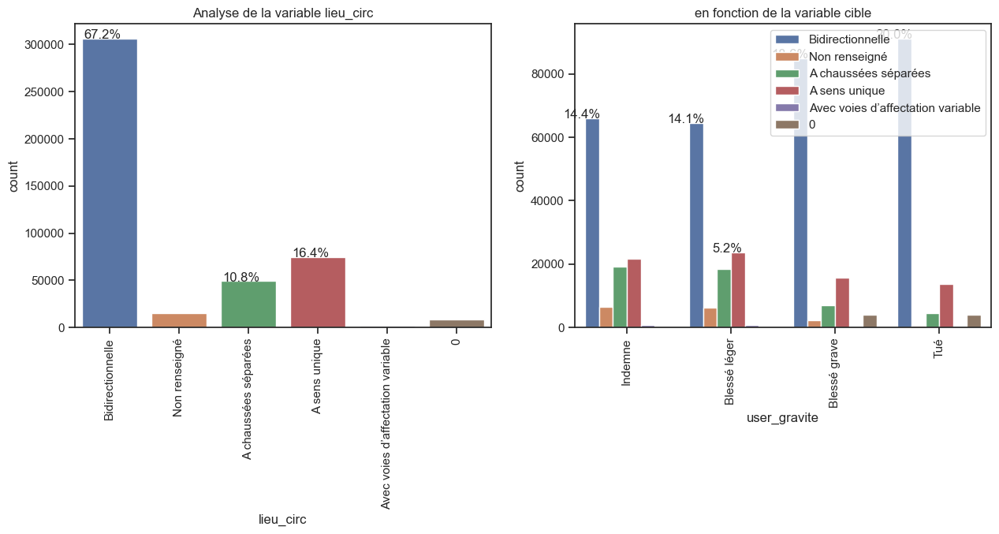

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_circ                                           
-1            0.417345  0.407572  0.143611  0.031472
 0            0.000000  0.044304  0.471698  0.483998
 1            0.289085  0.315690  0.210447  0.184778
 2            0.214929  0.210467  0.277103  0.297500
 3            0.392309  0.376873  0.140992  0.089826
 4            0.449413  0.403018  0.129681  0.017887


Meilleurs résultats obtenu avec taux= 18.49999999999995
Liste des modalités retenues en modalité de regroupement 1 : [0, 2]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.25687



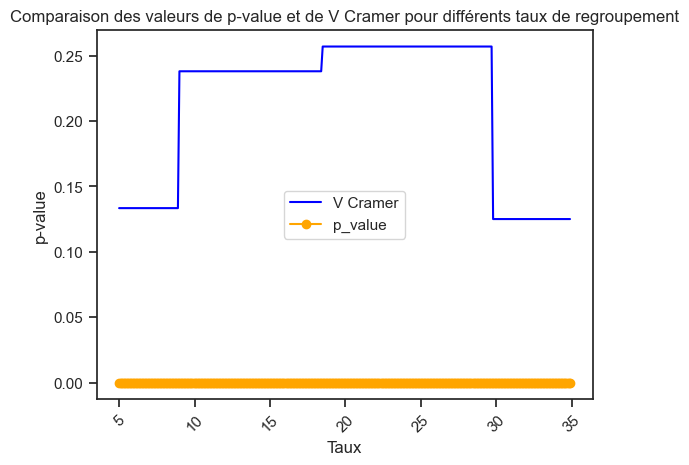

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 5
Meilleurs résultats obtenu avec taux= 8.899999999999986
Liste des modalités regroupées dans la nouvelle catégorie 5 : [-1, 4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.29582



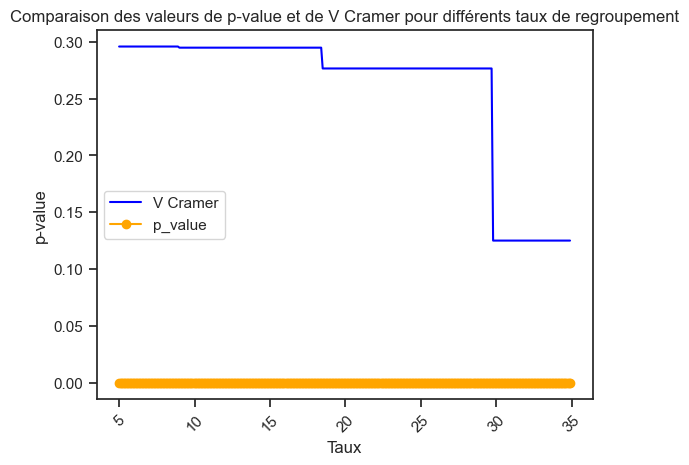


Optimisation Corrélation variable 'lieu_circ':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [788]:
# 'lieu_circ'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '1' : 'A sens unique',
    '2' : 'Bidirectionnelle',
    '3' : 'A chaussées séparées',
    '4' : 'Avec voies d’affectation variable'
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_circ', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 4 modalités.

lieu_circMV
2    0.659645
1    0.176424
3    0.157445
4    0.006486
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.140

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
lieu_circMV                            
1             21612  21877   3767   505
2             72294  67667  32903  5713
3             19291  18081   4296   955
4               804    714    216    22



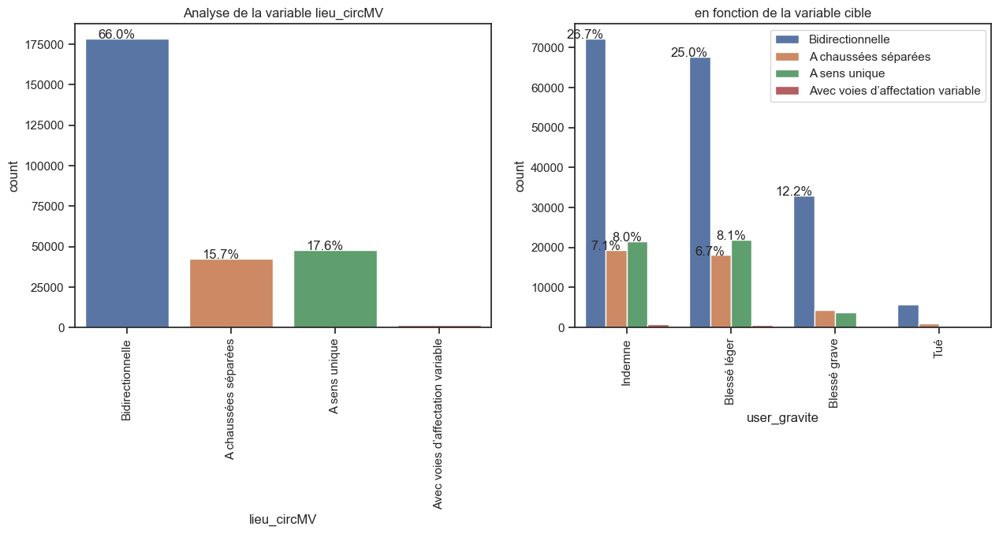

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_circMV                                         
1             0.452503  0.458052  0.078872  0.010573
2             0.404834  0.378923  0.184251  0.031992
3             0.452596  0.424208  0.100791  0.022406
4             0.457859  0.406606  0.123007  0.012528


Meilleurs résultats obtenu avec taux= 2.3000000000000003
Liste des modalités retenues en modalité de regroupement 1 : [2]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.13674



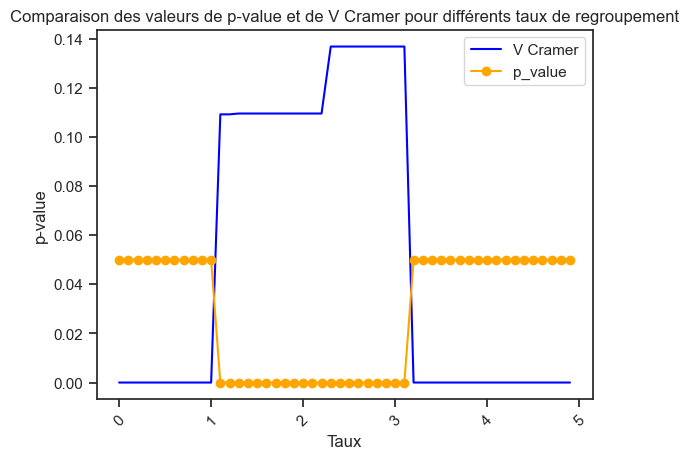

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 5
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 5 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.14039



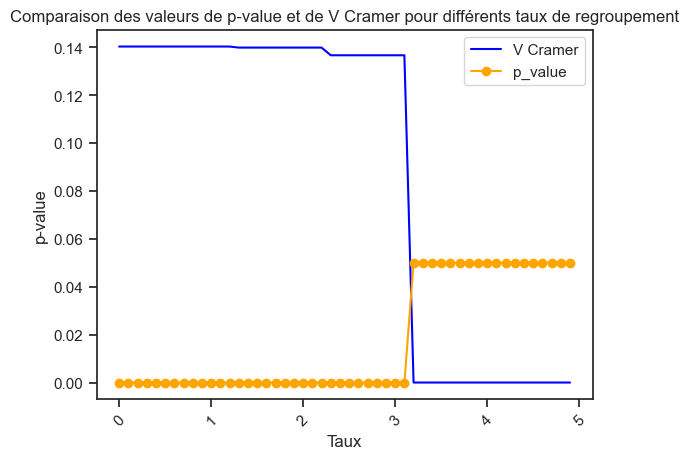


Optimisation Corrélation variable 'lieu_circMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [663]:
# 'LIEU_CIRC' - Remplacement des missing values
train['lieu_circMV'] = train.lieu_circ.fillna(train.lieu_circ.mode()[0])                      # valeur NaN si existante
train['lieu_circMV'] = train.lieu_circ.replace(-1, train.lieu_circ.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_circMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_CIRC'__</span> :</u>
1. 5% de missing value (14757 enregistrements) : Remplacement par la modalité la plus fréquente impacte légèrement le test de Cramer (0.140)
2. 4 modalités : 2 modalités représentent 78% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.148)
   - après missing Values via classe : Cramer=0.140
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.29586
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

__==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1'__

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_CIRC'__</span> :</u>


  __==> LA VARIABLE POURRA ETRE UTILISEE EN L'ETAT__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_INFRA'__ : </span></u>

Aménagement Infrastructure du lieu de l'accident



Il y a 1.0% (3292) de données manquantes (ou assimilées).
Il y a 11 modalités.

lieu_infra
 0    0.824241
 5    0.039761
 1    0.028894
 2    0.024921
 9    0.021609
 3    0.019467
 4    0.012581
 6    0.009050
 8    0.007829
-1    0.007219
 7    0.004428
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.20587

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
lieu_infra                              
-1             1400   1678    178     36
 0            94742  94599  94135  92381
 1             1670   1921   3657   5928
 2             1828   2145   3280   4111
 3             1456   1763   2633   3025
 4              332    411   2245   2749
 5             6705   5966   3648   1812
 6              999    913    994   1221
 7               82     94    687   1156
 8              824    882    890    974
 9             3963   3629   1654    608



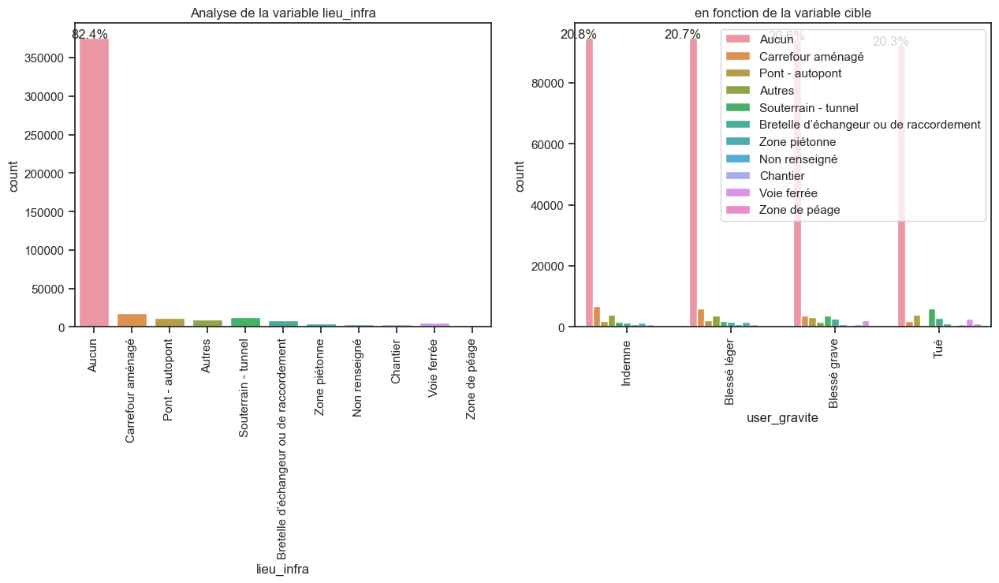

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_infra                                          
-1            0.425273  0.509721  0.054070  0.010936
 0            0.252069  0.251689  0.250454  0.245788
 1            0.126746  0.145795  0.277550  0.449909
 2            0.160859  0.188754  0.288631  0.361756
 3            0.164019  0.198603  0.296609  0.340768
 4            0.057870  0.071640  0.391320  0.479170
 5            0.369809  0.329050  0.201202  0.099939
 6            0.242064  0.221226  0.240853  0.295857
 7            0.040614  0.046558  0.340267  0.572561
 8            0.230812  0.247059  0.249300  0.272829
 9            0.402172  0.368277  0.167851  0.061701


Meilleurs résultats obtenu avec taux= 29.599999999999913
Liste des modalités retenues en modalité de regroupement 1 : [1, 2, 3, 4, 7]
Test Statistique du chi2 : p-value=0.000  ; V de C

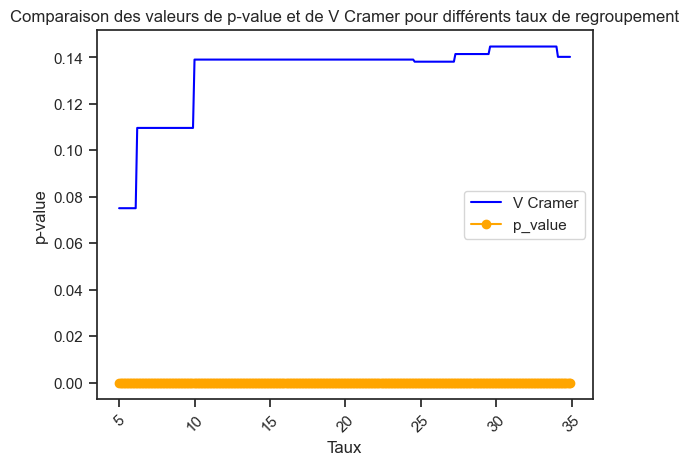

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 6.099999999999996
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.20587



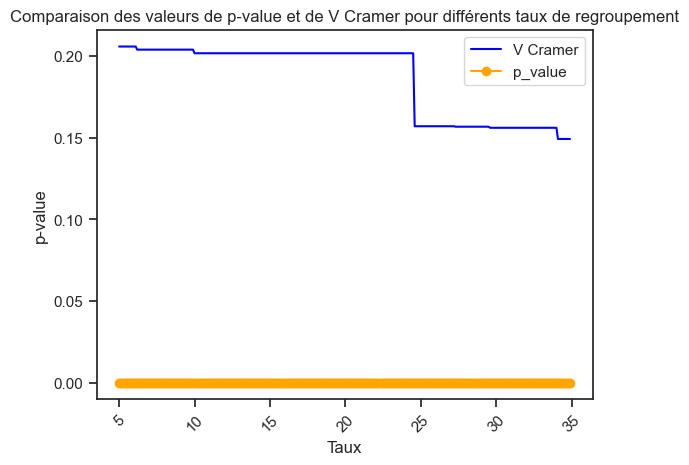


Optimisation Corrélation variable 'lieu_infra':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [789]:
# 'lieu_infra'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '0' : 'Aucun',
    '1' : 'Souterrain - tunnel',
    '2' : 'Pont - autopont',
    '3' : 'Bretelle d’échangeur ou de raccordement',
    '4' : 'Voie ferrée',
    '5' : 'Carrefour aménagé',
    '6' : 'Zone piétonne',
    '7' : 'Zone de péage',
    '8' : 'Chantier',
    '9' : 'Autres'
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_infra', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

lieu_infraMV
0    0.847169
5    0.056036
9    0.034379
2    0.017273
3    0.013298
1    0.012884
6    0.008108
8    0.007410
4    0.002767
7    0.000676
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.050

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
lieu_infraMV                           
0             96142  91660  35397  6144
1              1670   1616    184    18
2              1828   1959    684   205
3              1456   1611    424   109
4               332    272     86    59
5              6705   5863   2327   275
6               999    863    309    24
7                82     55     37     9
8               824    842    280    60
9              3963   3598   1454   292



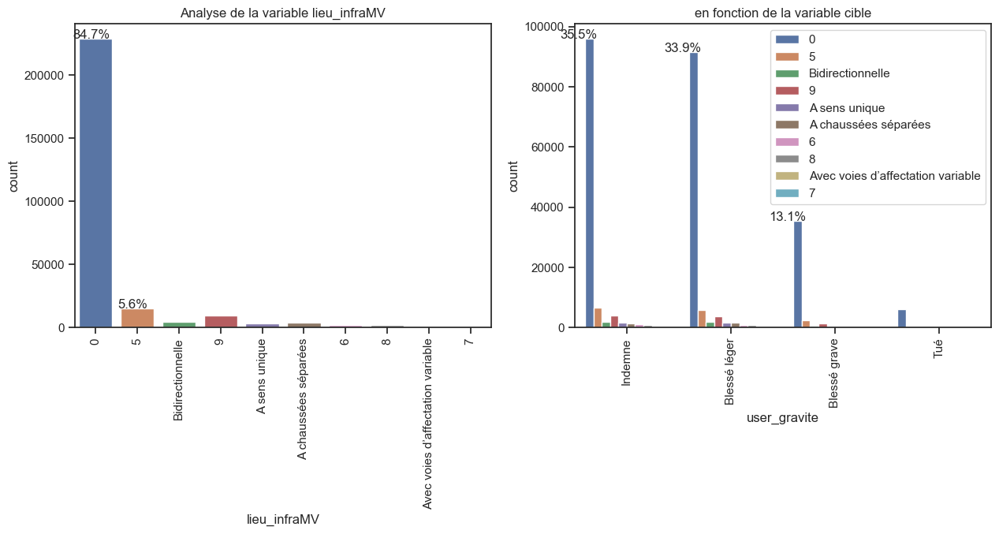

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_infraMV                                        
0             0.419206  0.399663  0.154341  0.026790
1             0.478784  0.463303  0.052752  0.005161
2             0.390932  0.418948  0.146279  0.043841
3             0.404444  0.447500  0.117778  0.030278
4             0.443258  0.363151  0.114820  0.078772
5             0.441991  0.386486  0.153395  0.018128
6             0.455125  0.393166  0.140774  0.010934
7             0.448087  0.300546  0.202186  0.049180
8             0.410768  0.419741  0.139581  0.029910
9             0.425809  0.386591  0.156226  0.031374


Meilleurs résultats obtenu avec taux= 0.6000000000000001
Liste des modalités retenues en modalité de regroupement 1 : [0, 2, 3, 4, 5, 6, 7, 8, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.03613



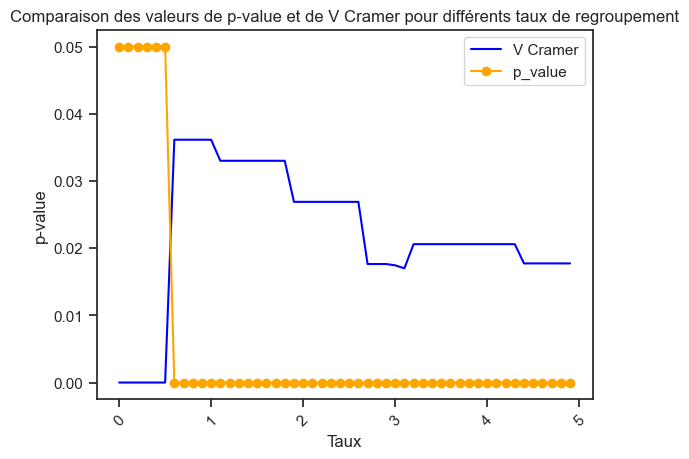

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.05043



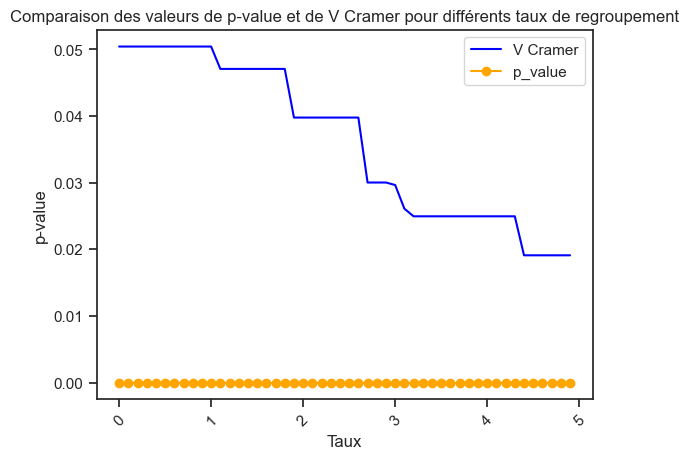


Optimisation Corrélation variable 'lieu_infraMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [664]:
# 'LIEU_INFRA' - Remplacement des missing values
train['lieu_infraMV'] = train.lieu_infra.fillna(train.lieu_infra.mode()[0])                      # valeur NaN si existante
train['lieu_infraMV'] = train.lieu_infra.replace(-1, train.lieu_infra.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_infraMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_INFRA'__</span> :</u>
1. 1% de missing value (3249) : Le remplacement par la modalité la plus fréquente dégrade légèrement le test de Cramer (0.050)
2. 10 modalités : 1 modalités représentent plus de 83% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.063)
   - après missing Values via classe : Cramer=0.050
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.20587
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

__==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1'__

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_INFRA'__</span> :</u>


<span style="color:red">__==> UN RETRAIT DE CETTE VARIABLE DU SCOPE DES VARIABLES EXPLICATIVE AURAIT DU SENS__</span>
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_PLAN'__ : </span></u>

Tracé en plan

-1 – Non renseigné
1 – Partie rectiligne
2 – En courbe à gauche
3 – En courbe à droite



Il y a 0.0% (38) de données manquantes (ou assimilées).
Il y a 6 modalités.

lieu_plan
 1    0.807100
 2    0.117245
 3    0.067618
 4    0.007831
 0    0.000123
-1    0.000083
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.13360

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
lieu_plan                               
-1               13     14      8      3
 0                0      0     12     44
 1            97174  94642  88155  88070
 2             8052   9674  16591  19147
 3             7729   8425   8199   6481
 4             1033   1246   1036    256



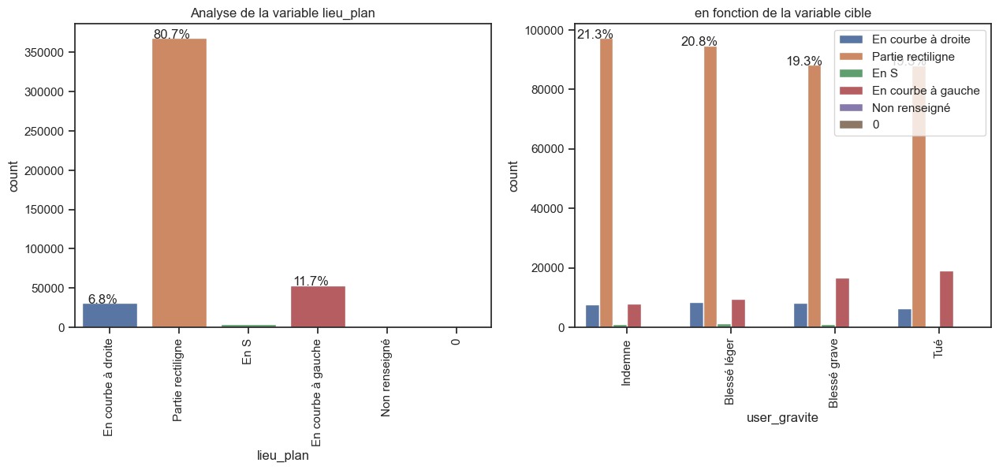

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_plan                                           
-1            0.342105  0.368421  0.210526  0.078947
 0            0.000000  0.000000  0.214286  0.785714
 1            0.264030  0.257151  0.239525  0.239294
 2            0.150606  0.180944  0.310321  0.358129
 3            0.250665  0.273237  0.265908  0.210190
 4            0.289275  0.348922  0.290115  0.071689


Meilleurs résultats obtenu avec taux= 23.999999999999932
Liste des modalités retenues en modalité de regroupement 1 : [0, 2]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.12657



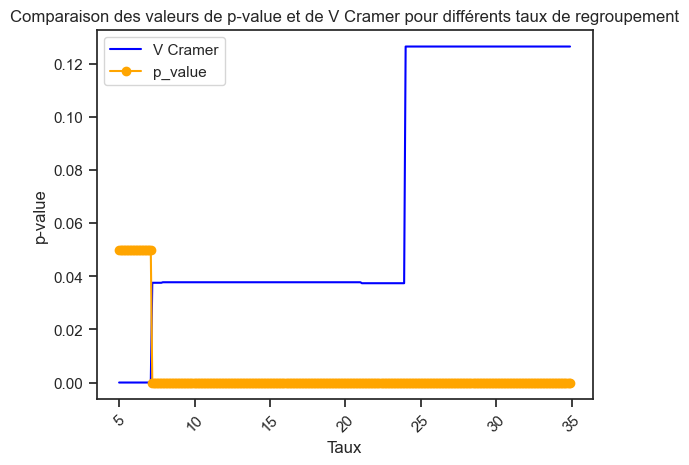

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 5
Meilleurs résultats obtenu avec taux= 7.79999999999999
Liste des modalités regroupées dans la nouvelle catégorie 5 : [4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.13360



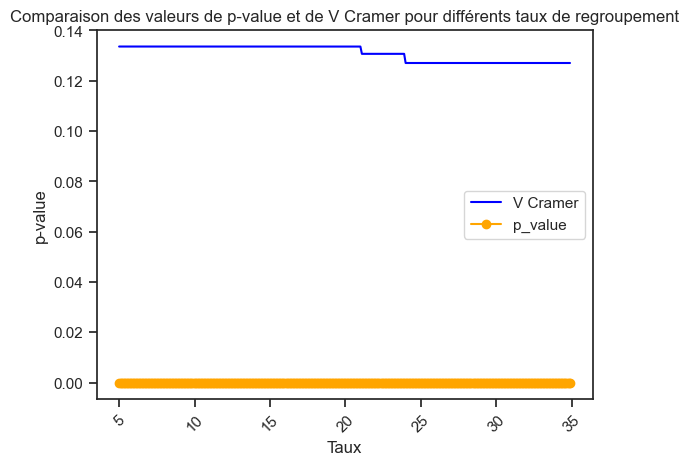


Optimisation Corrélation variable 'lieu_plan':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [790]:
# 'lieu_plan'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '1' : 'Partie rectiligne',
    '2' : 'En courbe à gauche',
    '3' : 'En courbe à droite',
    '4' : 'En S'
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_plan', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 4 modalités.

lieu_planMV
1    0.818855
2    0.086884
3    0.081849
4    0.012411
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.125

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
lieu_planMV                            
1             97187  89653  29819  5019
2              8052   9161   5339   969
3              7729   8291   5093  1045
4              1033   1234    931   162



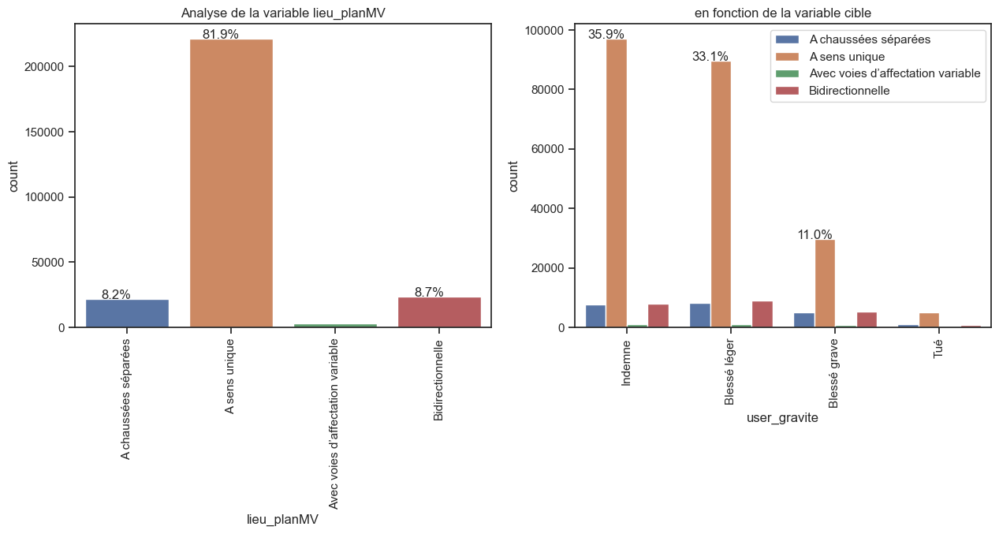

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_planMV                                         
1             0.438415  0.404429  0.134515  0.022641
2             0.342332  0.389482  0.226989  0.041197
3             0.348813  0.374176  0.229849  0.047161
4             0.307440  0.367262  0.277083  0.048214


Meilleurs résultats obtenu avec taux= 2.3000000000000003
Liste des modalités retenues en modalité de regroupement 1 : [2, 3, 4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.12356



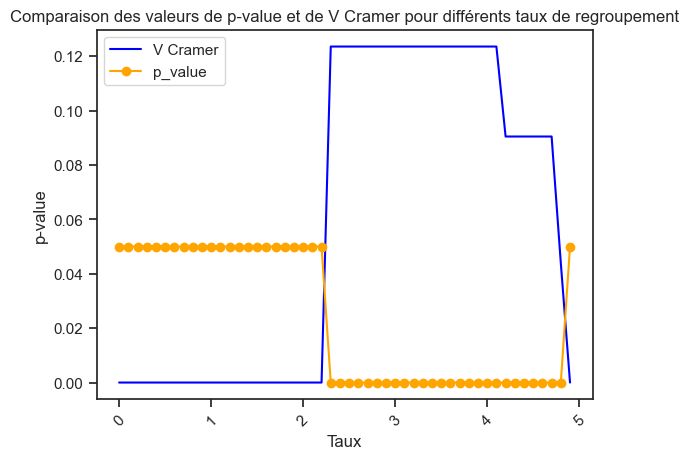

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 5
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 5 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.12485



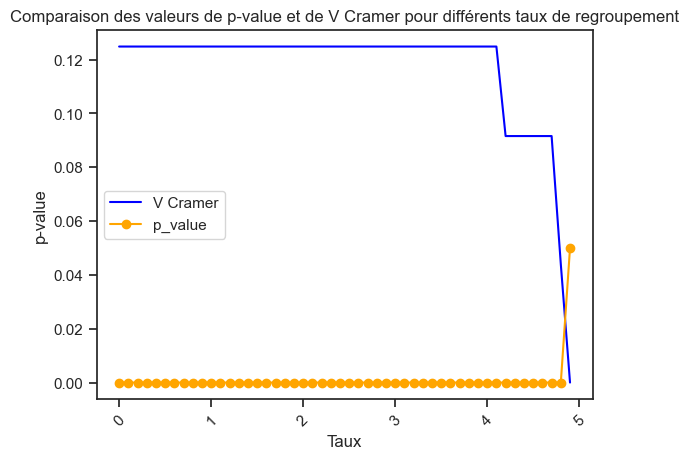


Optimisation Corrélation variable 'lieu_planMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [665]:
# 'LIEU_PLAN' - Remplacement des missing values
train['lieu_planMV'] = train.lieu_plan.fillna(train.lieu_plan.mode()[0])                      # valeur NaN si existante
train['lieu_planMV'] = train.lieu_plan.replace(-1, train.lieu_plan.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_planMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_PLAN'__</span> :</u>
1. Quelques missing value (38). Le remplacement par la modalité la plus fréquente n'impacte pas le test de Cramer (0.125)
2. 4 modalités : 1 modalités représentent + de 81% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.125)
   - après missing Values via classe : Cramer=0.125
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.13360
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_PLAN'__</span> :</u>


  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_PROF'__ : </span></u>


Profil en log décrit la déclivité de la route à l'endroit de l'accident :
-1 – Non renseigné
1 – Plat
2 – Pente
3 – Sommet de côte
4 – Bas de côte



Il y a 0.0% (37) de données manquantes (ou assimilées).
Il y a 6 modalités.

lieu_prof
 1    0.842688
 2    0.130780
 3    0.017493
 4    0.008824
 0    0.000134
-1    0.000081
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.06559

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
lieu_prof                               
-1               14     12      8      3
 0                0      0      9     52
 1            94714  94222  96343  98990
 2            16085  16572  14717  12262
 3             1742   1803   2069   2363
 4             1446   1392    855    331



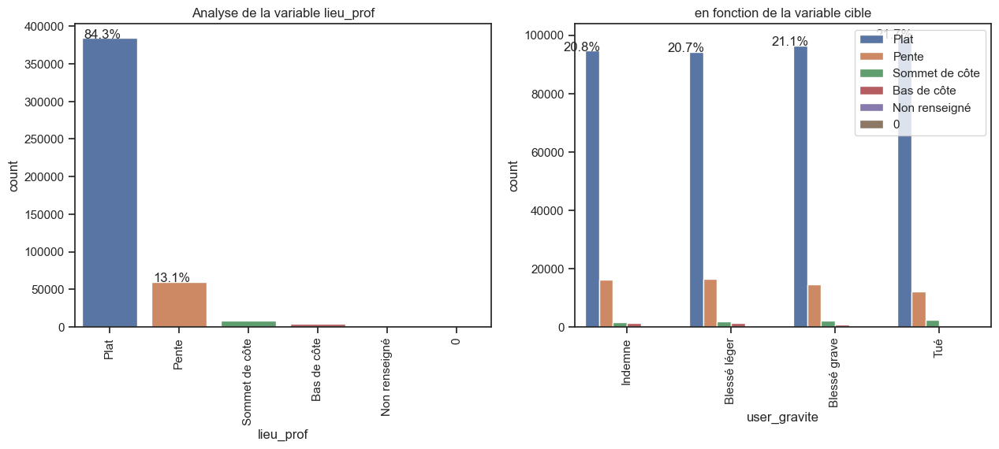

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_prof                                           
-1            0.378378  0.324324  0.216216  0.081081
 0            0.000000  0.000000  0.147541  0.852459
 1            0.246478  0.245198  0.250718  0.257606
 2            0.269720  0.277886  0.246780  0.205614
 3            0.218378  0.226025  0.259371  0.296227
 4            0.359344  0.345924  0.212475  0.082256


Meilleurs résultats obtenu avec taux= 20.599999999999945
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.05373



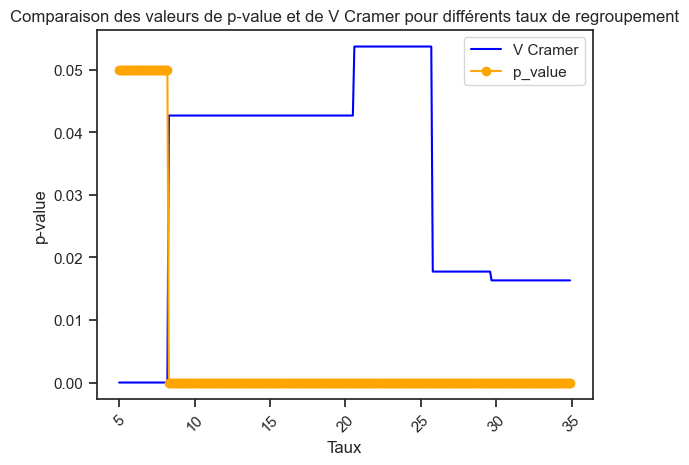

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 5
Meilleurs résultats obtenu avec taux= 8.199999999999989
Liste des modalités regroupées dans la nouvelle catégorie 5 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.06559



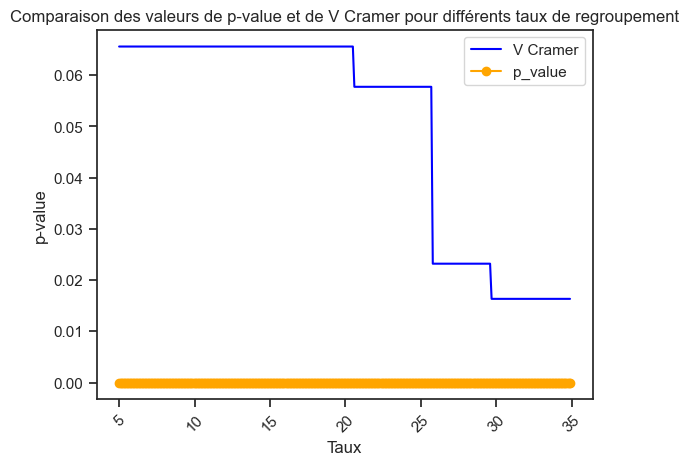


Optimisation Corrélation variable 'lieu_prof':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [791]:
# 'lieu_prof'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '1' : 'Plat',
    '2' : 'Pente',
    '3' : 'Sommet de côte',
    '4' : 'Bas de côte'
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_prof', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 4 modalités.

lieu_profMV
1    0.813613
2    0.155439
3    0.016948
4    0.014000
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.072

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
lieu_profMV                            
1             94728  88986  31267  5278
2             16085  16226   8235  1534
3              1742   1748    895   203
4              1446   1379    785   180



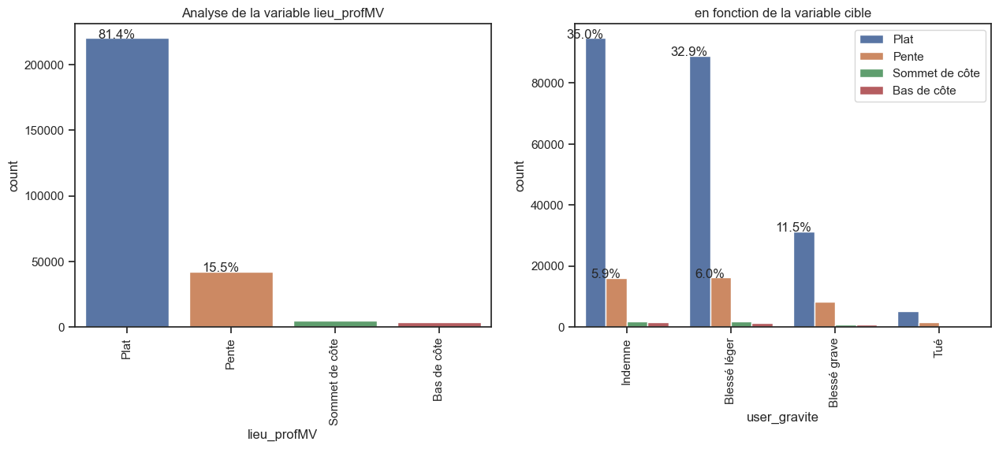

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_profMV                                         
1             0.430076  0.404006  0.141956  0.023963
2             0.382248  0.385599  0.195699  0.036454
3             0.379686  0.380994  0.195074  0.044246
4             0.381530  0.363852  0.207124  0.047493


Meilleurs résultats obtenu avec taux= 2.4000000000000004
Liste des modalités retenues en modalité de regroupement 1 : [2, 3, 4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.07128



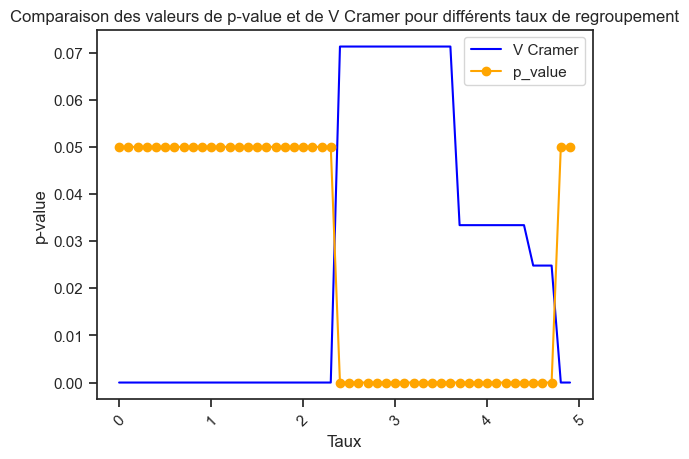

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 5
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 5 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.07207



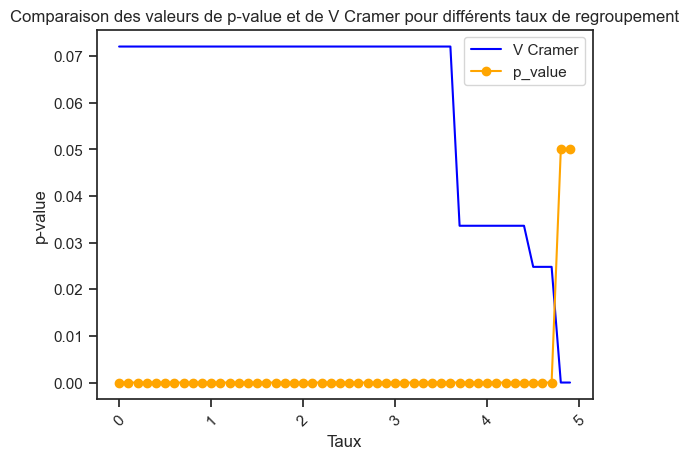


Optimisation Corrélation variable 'lieu_profMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [667]:
# 'LIEU_PROF' - Remplacement des missing values
train['lieu_profMV'] = train.lieu_prof.fillna(train.lieu_prof.mode()[0])                      # valeur NaN si existante
train['lieu_profMV'] = train.lieu_prof.replace(-1, train.lieu_prof.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_profMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_PROF'__</span> :</u>
1. Quelques missing values (37). Le remplacement n'a pas d'impact sur le test de Cramer (0.072)
2. 4 modalités : 1 modalités représentent + de 81% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.072)
   - après missing Values via classe : Cramer=0.072
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.06559 ==> Le résultat se dégrade
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_PROF'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

<span style="color:red">__==> UN RETRAIT DE CETTE VARIABLE DU SCOPE DES VARIABLES EXPLICATIVE AURAIT DU SENS__</span>
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_SITU'__ : </span></u>


Profil en log décrit la déclivité de la route à l'endroit de l'accident :
-1 – Non renseigné
1 – Plat
2 – Pente
3 – Sommet de côte
4 – Bas de côte



Il y a 0.0% (38) de données manquantes (ou assimilées).
Il y a 10 modalités.

lieu_situ
 1    0.783375
 3    0.069517
 2    0.061043
 4    0.022081
 5    0.021526
 8    0.019862
 6    0.015278
 7    0.007213
-1    0.000083
 0    0.000022
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.33267

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2      3
lieu_situ                                
-1                15     17      5      1
 0                 0      0      6      4
 1            102891  98425  84997  70909
 2               622   1069   8758  17387
 3              2436   4798  11345  13121
 4              1451   2359   2766   3493
 5              2525   2976   1599   2716
 6              1569   1553   1344   2501
 7                 0     32    883   2374
 8              2492   2772   2298   1495



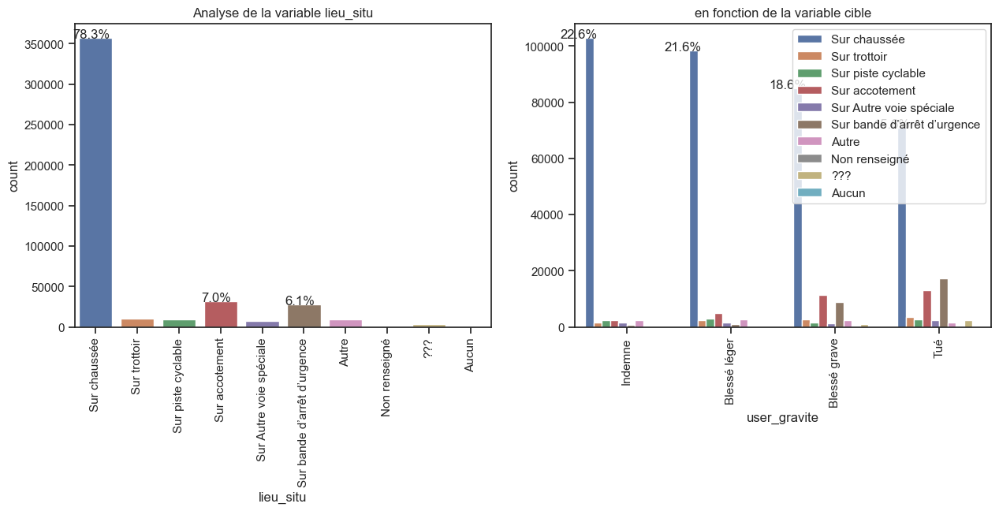

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_situ                                           
-1            0.394737  0.447368  0.131579  0.026316
 0            0.000000  0.000000  0.600000  0.400000
 1            0.288031  0.275529  0.237939  0.198501
 2            0.022345  0.038404  0.314629  0.624623
 3            0.076845  0.151356  0.357886  0.413912
 4            0.144106  0.234283  0.274705  0.346906
 5            0.257233  0.303178  0.162897  0.276691
 6            0.225205  0.222908  0.192909  0.358978
 7            0.000000  0.009729  0.268471  0.721800
 8            0.275146  0.306062  0.253726  0.165066


Meilleurs résultats obtenu avec taux= 27.699999999999918
Liste des modalités retenues en modalité de regroupement 1 : [0, 2, 3, 4, 6, 7]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.30092



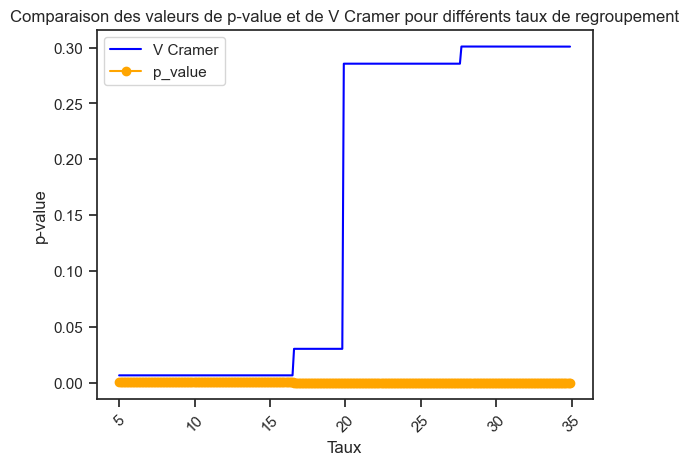

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 9
Meilleurs résultats obtenu avec taux= 16.499999999999957
Liste des modalités regroupées dans la nouvelle catégorie 9 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.33267



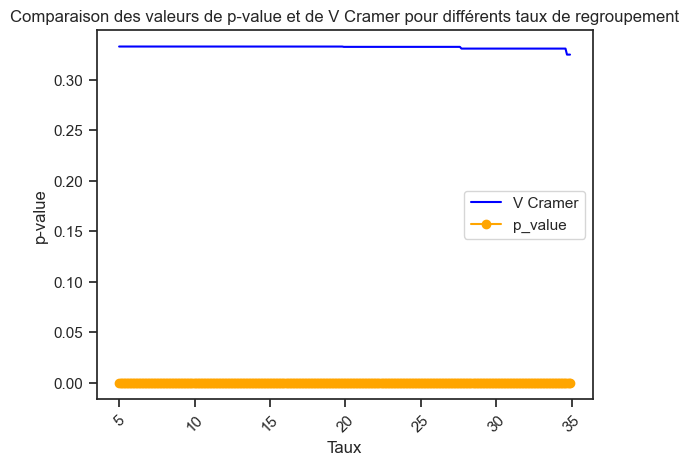


Optimisation Corrélation variable 'lieu_situ':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [796]:
# 'lieu_situ'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '0' : 'Aucun',
    '1' : 'Sur chaussée',
    '2' : 'Sur bande d’arrêt d’urgence', 
    '3' : 'Sur accotement',
    '4' : 'Sur trottoir',
    '5' : 'Sur piste cyclable',
    '6' : 'Sur Autre voie spéciale',
    '7' : '???',
    '8' : 'Autre'
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_situ', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 9 modalités.

lieu_situMV
1    0.783458
3    0.069517
2    0.061043
4    0.022081
5    0.021526
8    0.019862
6    0.015278
7    0.007213
0    0.000022
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.33263

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2      3
lieu_situMV                              
0                  0      0      6      4
1             102906  98442  85002  70910
2                622   1069   8758  17387
3               2436   4798  11345  13121
4               1451   2359   2766   3493
5               2525   2976   1599   2716
6               1569   1553   1344   2501
7                  0     32    883   2374
8               2492   2772   2298   1495



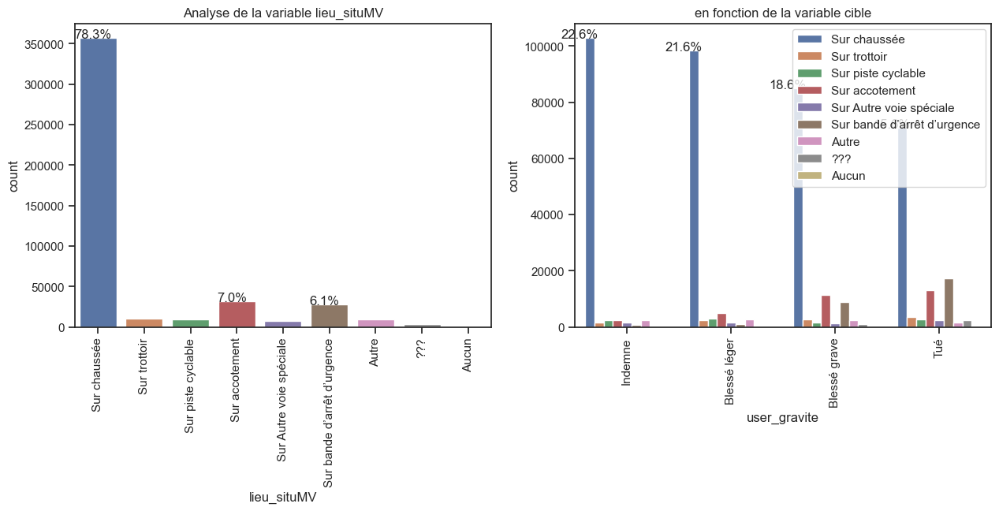

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_situMV                                         
0             0.000000  0.000000  0.600000  0.400000
1             0.288042  0.275547  0.237928  0.198483
2             0.022345  0.038404  0.314629  0.624623
3             0.076845  0.151356  0.357886  0.413912
4             0.144106  0.234283  0.274705  0.346906
5             0.257233  0.303178  0.162897  0.276691
6             0.225205  0.222908  0.192909  0.358978
7             0.000000  0.009729  0.268471  0.721800
8             0.275146  0.306062  0.253726  0.165066


Meilleurs résultats obtenu avec taux= 27.699999999999918
Liste des modalités retenues en modalité de regroupement 1 : [0, 2, 3, 4, 6, 7]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.30092



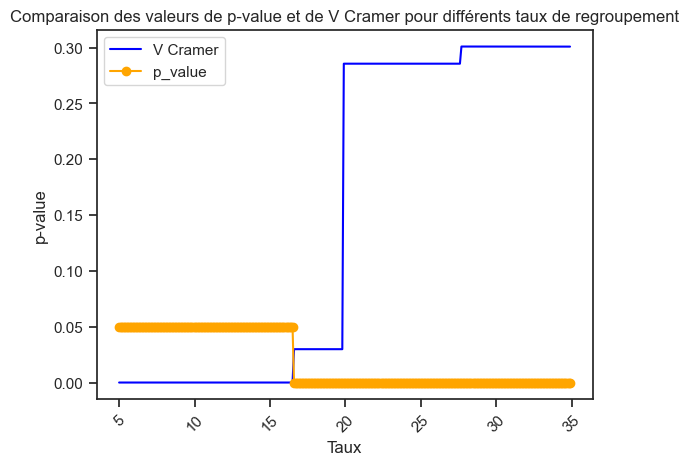

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 9
Meilleurs résultats obtenu avec taux= 19.799999999999947
Liste des modalités regroupées dans la nouvelle catégorie 9 : [8]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.33263



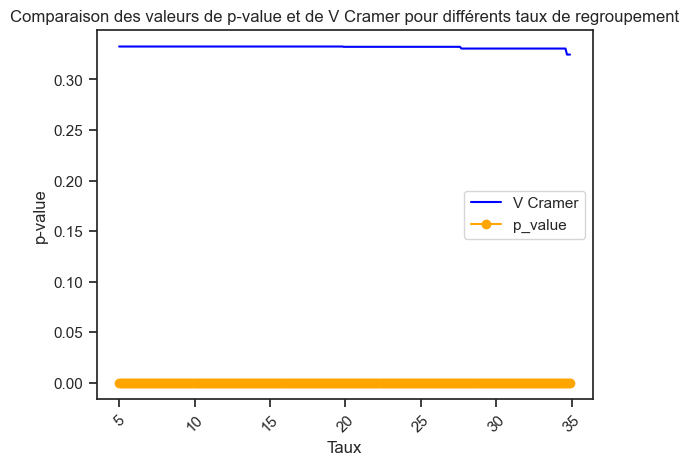


Optimisation Corrélation variable 'lieu_situMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [797]:
# 'LIEU_SITU' - Remplacement des missing values
train['lieu_situMV'] = train.lieu_situ.fillna(train.lieu_situ.mode()[0])                      # valeur NaN si existante
train['lieu_situMV'] = train.lieu_situ.replace(-1, train.lieu_situ.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_situMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_SITU'__</span> :</u>
1. Quelques missing values (38)
2. 7 modalités : 1 modalité représente 86% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.232)
   - après missing Values via modalité la plus fréquente : Cramer=0.232
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.33267
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_SITU'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_SURF'__ : </span></u>

Etat de la surfaceCorps gras



Il y a 0.0% (56) de données manquantes (ou assimilées).
Il y a 11 modalités.

lieu_surf
 1    0.858082
 2    0.122339
 7    0.003566
 3    0.003338
 5    0.003094
 9    0.002901
 4    0.002678
 6    0.002206
 8    0.001496
 0    0.000178
-1    0.000123
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.17341

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1       2       3
lieu_surf                                 
-1               22     23       8       3
 0                0      0      16      65
 1            93644  92229  101579  103837
 2            19125  20184    9641    6837
 3              122    163     499     738
 4               56     92     410     663
 5              205    199     434     573
 6               42     68     317     579
 7              350    419     475     382
 8               68    155     237     222
 9              367    469     385

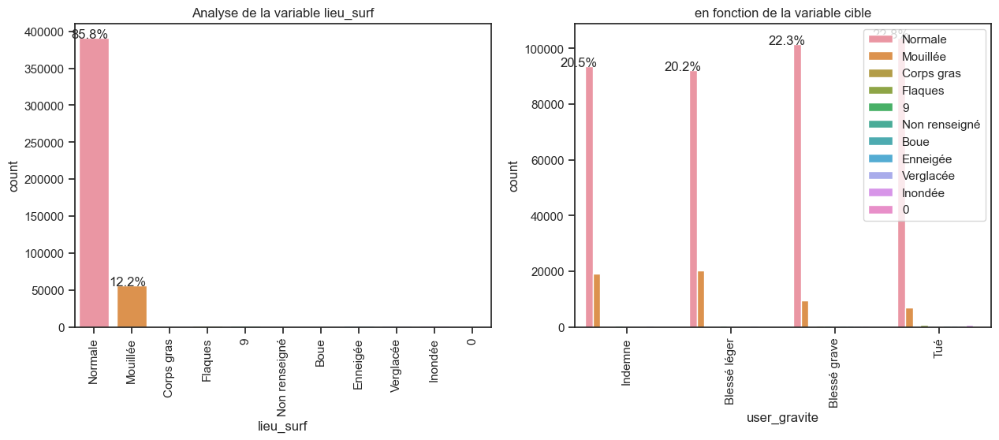

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_surf                                           
-1            0.392857  0.410714  0.142857  0.053571
 0            0.000000  0.000000  0.197531  0.802469
 1            0.239322  0.235706  0.259601  0.265372
 2            0.342822  0.361805  0.172818  0.122555
 3            0.080158  0.107096  0.327858  0.484888
 4            0.045864  0.075348  0.335790  0.542998
 5            0.145287  0.141035  0.307583  0.406095
 6            0.041750  0.067594  0.315109  0.575547
 7            0.215252  0.257688  0.292128  0.234932
 8            0.099707  0.227273  0.347507  0.325513
 9            0.277400  0.354497  0.291005  0.077098


Meilleurs résultats obtenu avec taux= 12.299999999999974
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 3, 4, 5, 6, 7, 8]
Test Statistique du chi2 : p-value=0.000 

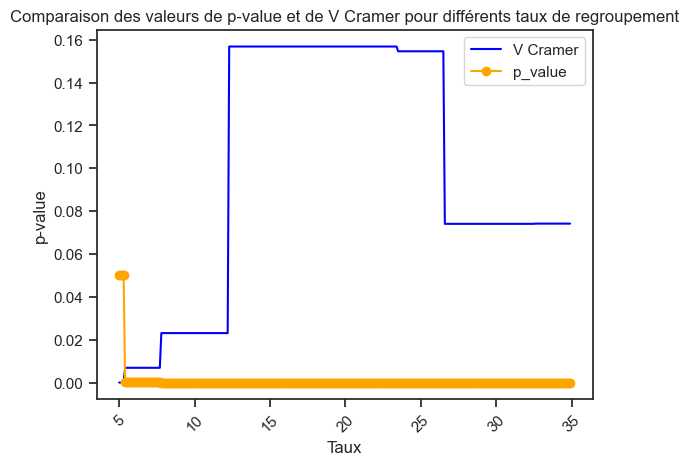

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 7.69999999999999
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.17341



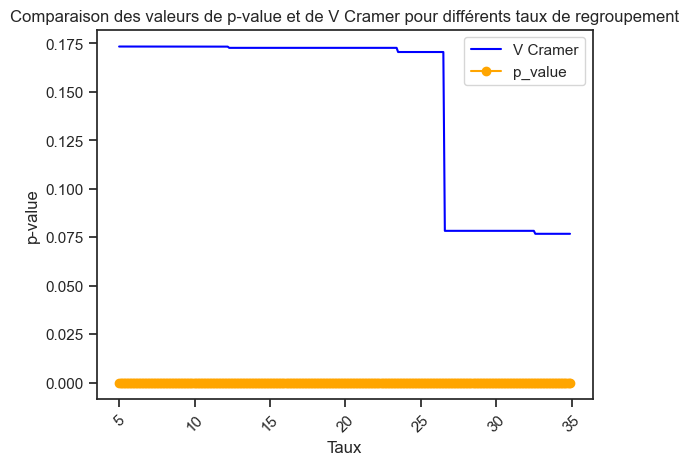


Optimisation Corrélation variable 'lieu_surf':
OPTIMISATION REGROUPEMENT NON BINAIRE : taux de regroupement optimal=7.69999999999999 , best_p_value=0.000  - best_V_Cramer=0.17341
Liste des catégories conservées :  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Liste des modalités regroupées pour former la nouvelle modalité '10' : [-1]


In [798]:
# 'lieu_surf'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '1' : 'Normale',
    '2' : 'Mouillée',
    '3' : 'Flaques',
    '4' : 'Inondée',
    '5' : 'Enneigée',
    '6' : 'Boue',
    '7' : 'Verglacée',
    '8' : 'Corps gras'
}
new_rgmt = analyse_variable_categorielle(train, 'lieu_surf', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 9 modalités.

lieu_surfMV
1    0.813425
2    0.172719
9    0.004640
7    0.003941
5    0.001777
3    0.001230
8    0.001079
6    0.000635
4    0.000554
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.049

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
lieu_surfMV                            
1             93666  87014  33826  5702
2             19125  19853   6459  1321
3               122    140     59    12
4                56     62     25     7
5               205    190     79     7
6                42     55     58    17
7               350    413    247    57
8                68    149     69     6
9               367    463    360    66



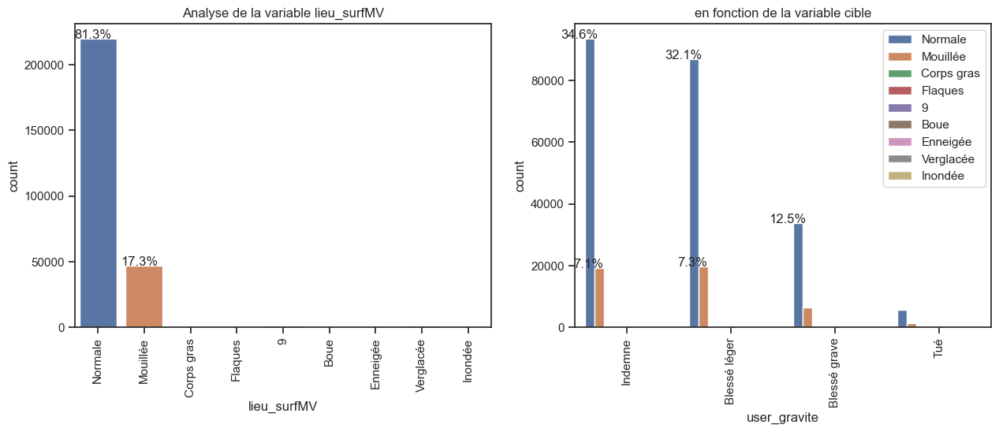

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_surfMV                                         
1             0.425352  0.395145  0.153609  0.025894
2             0.409021  0.424590  0.138137  0.028252
3             0.366366  0.420420  0.177177  0.036036
4             0.373333  0.413333  0.166667  0.046667
5             0.426195  0.395010  0.164241  0.014553
6             0.244186  0.319767  0.337209  0.098837
7             0.328022  0.387067  0.231490  0.053421
8             0.232877  0.510274  0.236301  0.020548
9             0.292197  0.368631  0.286624  0.052548


Meilleurs résultats obtenu avec taux= 4.7
Liste des modalités retenues en modalité de regroupement 1 : [6, 7, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.03774



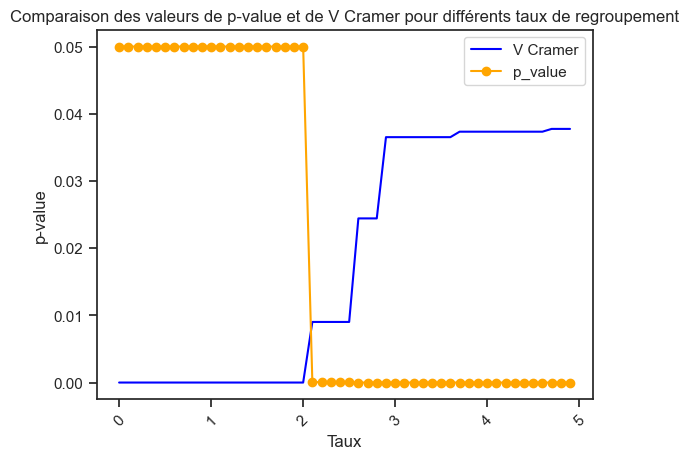

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.04930



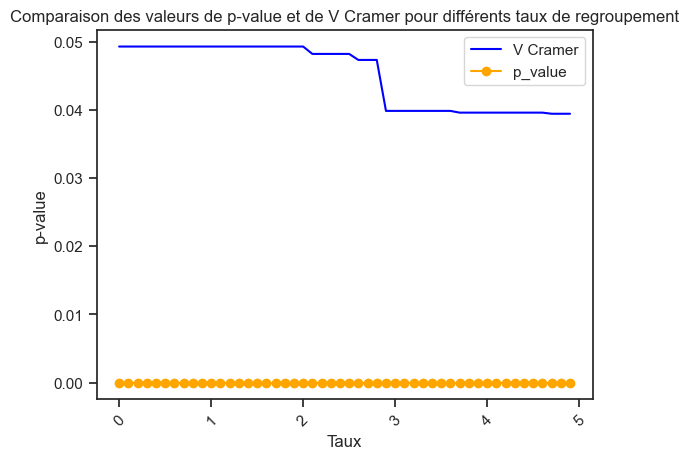


Optimisation Corrélation variable 'lieu_surfMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [671]:
# 'LIEU_SURF' - Remplacement des missing values
train['lieu_surfMV'] = train.lieu_surf.fillna(train.lieu_surf.mode()[0])                      # valeur NaN si existante
train['lieu_surfMV'] = train.lieu_surf.replace(-1, train.lieu_surf.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_surfMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_SURF'__</span> :</u>
1. Quelques missing values (56)
2. 9 modalités : 1 modalité représente 81% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.049)
   - après missing Values via modalité la plus fréquente : Cramer=0.049
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.17341
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_SURF'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

<span style="color:red">__==> UN RETRAIT DE CETTE VARIABLE DU SCOPE DES VARIABLES EXPLICATIVE AURAIT DU SENS__</span>
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_VOSP'__ : </span></u>

Voie réservé:rvée 



Il y a 0.0% (1073) de données manquantes (ou assimilées).
Il y a 5 modalités.

lieu_vosp
 0    0.912944
 1    0.040995
 3    0.022395
 2    0.021313
-1    0.002353
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.14138

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1       2       3
lieu_vosp                                  
-1               446    408     157      62
 0            100154  99796  107209  109147
 1              5844   6358    3562    2930
 2              3116   3099    1883    1621
 3              4441   4340    1190     241



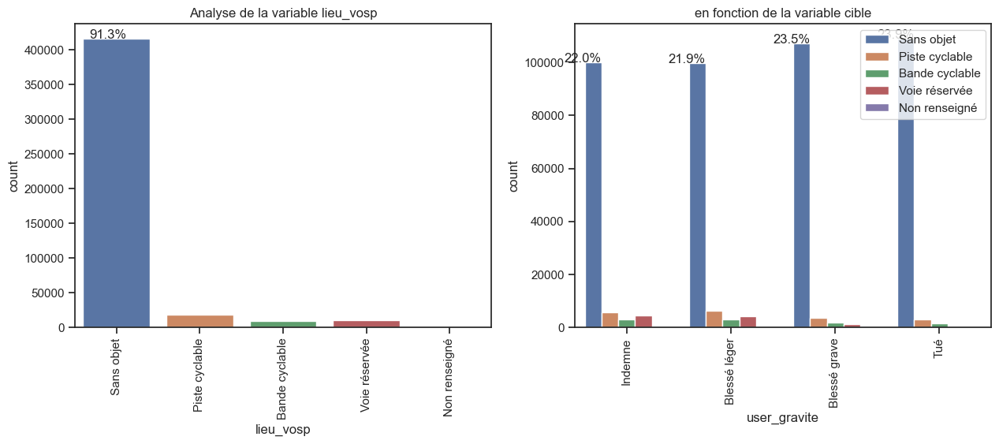

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_vosp                                           
-1            0.415657  0.380242  0.146319  0.057782
 0            0.240578  0.239718  0.257525  0.262180
 1            0.312614  0.340109  0.190542  0.156735
 2            0.320609  0.318860  0.193744  0.166787
 3            0.434881  0.424990  0.116530  0.023600


Meilleurs résultats obtenu avec taux= 16.69999999999996
Liste des modalités retenues en modalité de regroupement 1 : [0]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.12945



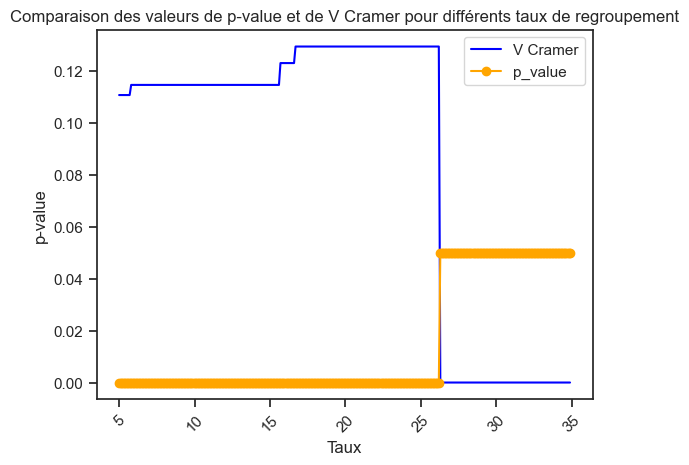

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 4
Meilleurs résultats obtenu avec taux= 5.6999999999999975
Liste des modalités regroupées dans la nouvelle catégorie 4 : [3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.14138



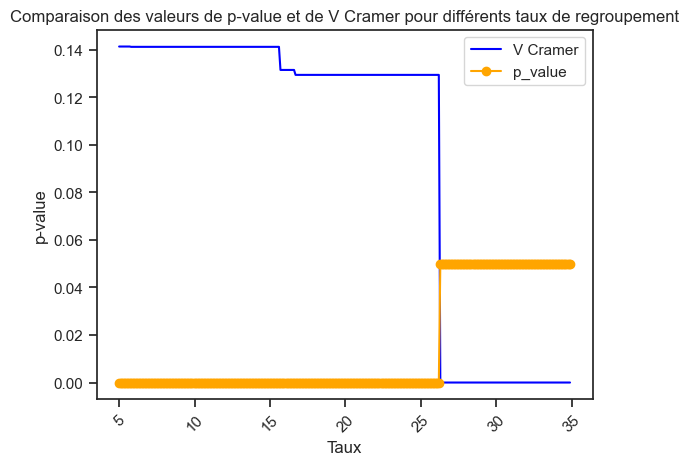


Optimisation Corrélation variable 'lieu_vosp':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [799]:
# 'lieu_vosp'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '0' : 'Sans objet',
    '1' : 'Piste cyclable',
    '2' : 'Bande cyclable',
    '3' : 'Voie réservée' 
}

new_rgmt = analyse_variable_categorielle(train, 'lieu_vosp', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 4 modalités.

lieu_vospMV
0    0.889324
1    0.048863
3    0.036632
2    0.025181
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.064

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2     3
lieu_vospMV                             
0             100600  95082  38288  6785
1               5844   6033   1190   161
2               3116   2924    686    91
3               4441   4300   1018   158



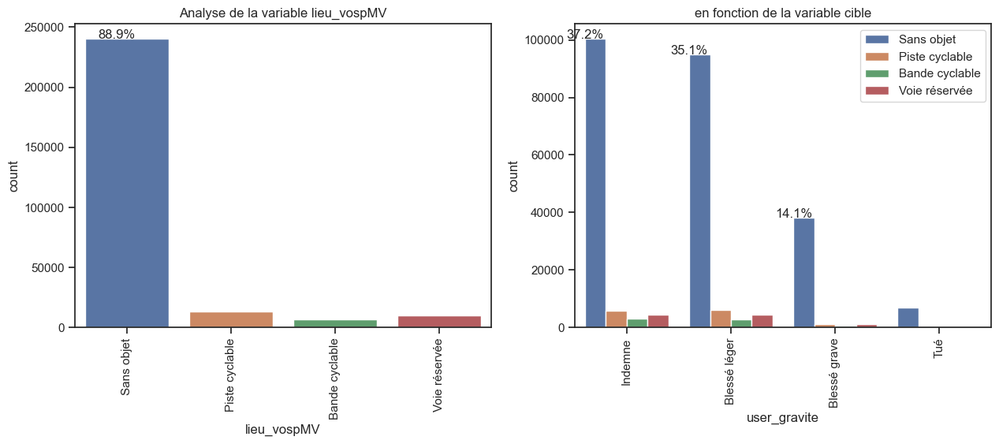

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
lieu_vospMV                                         
0             0.417852  0.394933  0.159033  0.028182
1             0.441790  0.456078  0.089961  0.012171
2             0.457093  0.428928  0.100631  0.013349
3             0.447817  0.433599  0.102652  0.015932


Meilleurs résultats obtenu avec taux= 1.6
Liste des modalités retenues en modalité de regroupement 1 : [0]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.06371



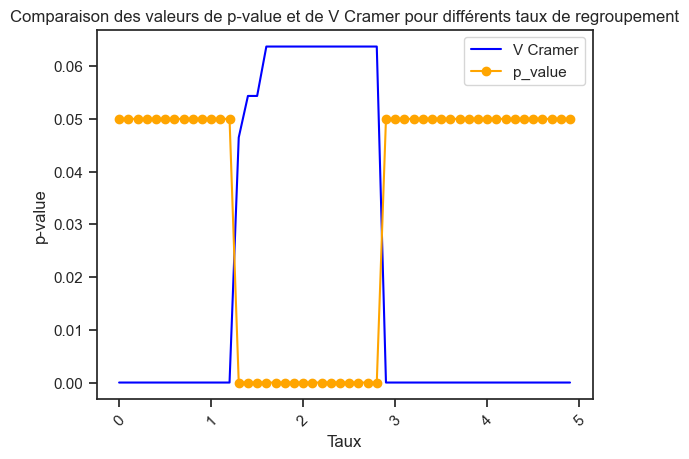

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 4
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 4 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.06440



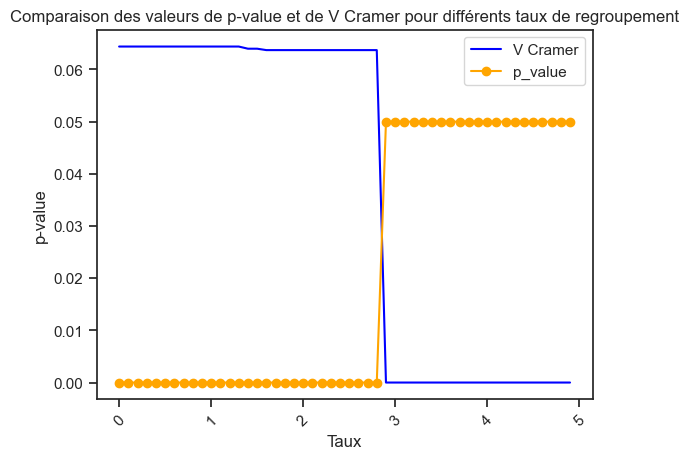


Optimisation Corrélation variable 'lieu_vospMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [673]:
# 'LIEU_VOSP' - Remplacement des missing values
train['lieu_vospMV'] = train.lieu_vosp.fillna(train.lieu_vosp.mode()[0])                      # valeur NaN si existante
train['lieu_vospMV'] = train.lieu_vosp.replace(-1, train.lieu_vosp.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'lieu_vospMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'LIEU_VOSP'__</span> :</u>
1. Quelques missing values (1038)
2. 4 modalités : 1 modalité représente + de 88% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.065)
   - après missing Values via modalité la plus fréquente : Cramer=0.064
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.14138
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'LIEU_VOSP'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

<span style="color:red">__==> UN RETRAIT DE CETTE VARIABLE DU SCOPE DES VARIABLES EXPLICATIVE AURAIT DU SENS__</span>
  

###


##### FICHIER __'VEHI'__

<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_CATV'__ : </span></u>


Catégorie détaillée de véhicule.




Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 100 modalités.

vehi_catv
7     0.543629
33    0.071673
10    0.047022
1     0.044283
2     0.034669
32    0.026642
30    0.024355
31    0.019522
3     0.014002
9     0.011842
8     0.011599
5     0.010866
4     0.010579
6     0.010572
50    0.008956
15    0.007721
34    0.007559
14    0.007517
37    0.005882
13    0.005862
17    0.005818
12    0.004221
11    0.004015
21    0.003732
43    0.003445
80    0.003353
20    0.003204
16    0.002950
99    0.002831
18    0.002548
38    0.002544
19    0.002520
22    0.002502
25    0.002482
28    0.002414
27    0.002408
24    0.002390
26    0.002357
23    0.002346
29    0.002314
36    0.002143
35    0.001914
0     0.001561
40    0.001520
60    0.001103
39    0.000857
42    0.000697
41    0.000594
45    0.000336
44    0.000325
46    0.000314
48    0.000300
47    0.000300
49    0.000279
51    0.000125
53    0.000121
76    0.000107
54    0.000101
57    0.000088
55    0.000083
66    0.000

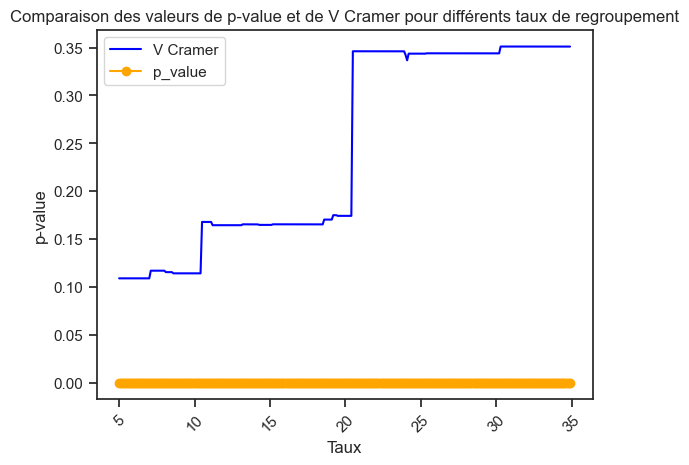

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 100
Meilleurs résultats obtenu avec taux= 6.999999999999993
Liste des modalités regroupées dans la nouvelle catégorie 100 : [50, 60, 86, 99]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.54008



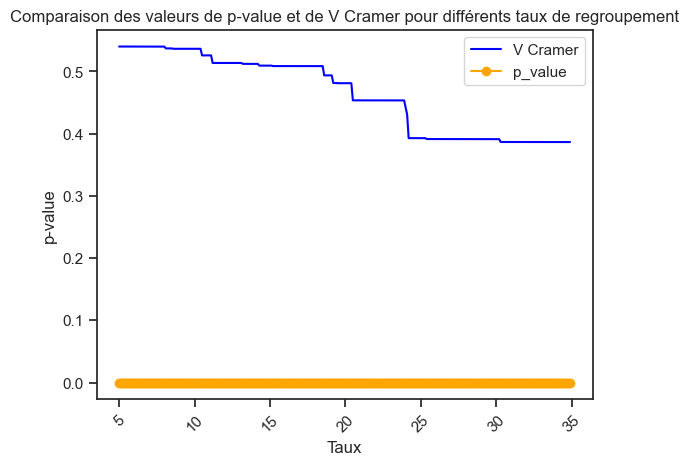


Optimisation Corrélation variable 'vehi_catv':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [800]:
# vehi_catv
new_rgmt = analyse_variable_categorielle(train, 'vehi_catv', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_CATV'__</span> :</u>
1. Aucune missing value
2. 31 modalités : 4 modalités représentent 80% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.428)
   - après missing Values via modalité la plus fréquente : Cramer=
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.54159
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

__==> A PRIORI L'UNE DES VARIABLES LA PLUS LIEE A LA VARIABLE CIBLE__

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__VEHI_CATV'__</span> :</u>

  __==> MAINTIEN EN L'ETAT__
  

###
  

<u>ANALYSE DETAILLEE DE <span style="color:red">__'AGG_CATV_PERSO'__ : </span></u>


Regroupement de types de véhicules (vhi_catv personnalisé)v2018)





Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 6 modalités.

agg_catv_perso
4    0.618258
3    0.145933
2    0.133885
1    0.052782
5    0.028059
6    0.021083
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.40481

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite        0      1      2      3
agg_catv_perso                            
1                 961   8765   8099   6244
2                3477  18206  24228  15141
3                1782  11980  24301  28483
4               98671  67660  54141  61456
5                6963   2296   1383   2153
6                2147   5094   1849    524



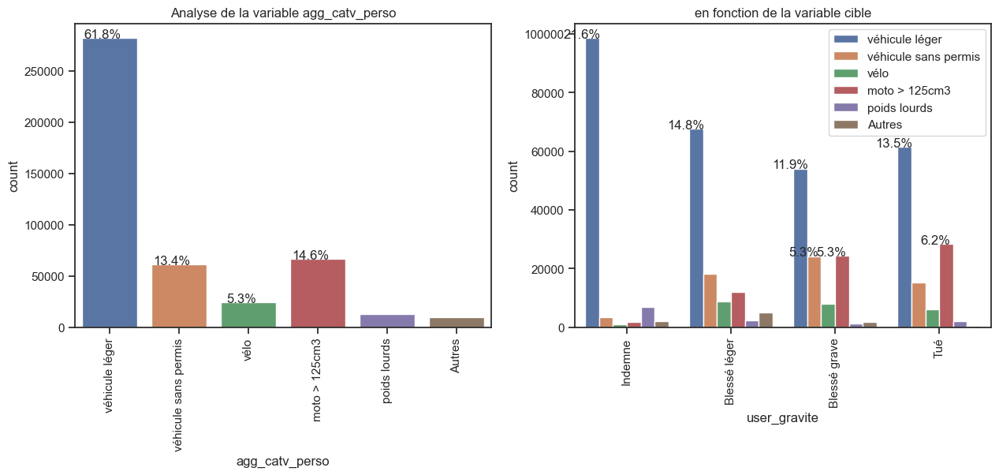

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite           0         1         2         3
agg_catv_perso                                        
1               0.039927  0.364161  0.336491  0.259421
2               0.056951  0.298205  0.396842  0.248002
3               0.026778  0.180026  0.365176  0.428020
4               0.349987  0.239990  0.192038  0.217985
5               0.544197  0.179445  0.108089  0.168269
6               0.223320  0.529852  0.192324  0.054504


Meilleurs résultats obtenu avec taux= 21.79999999999994
Liste des modalités retenues en modalité de regroupement 1 : [1, 2, 3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.36038



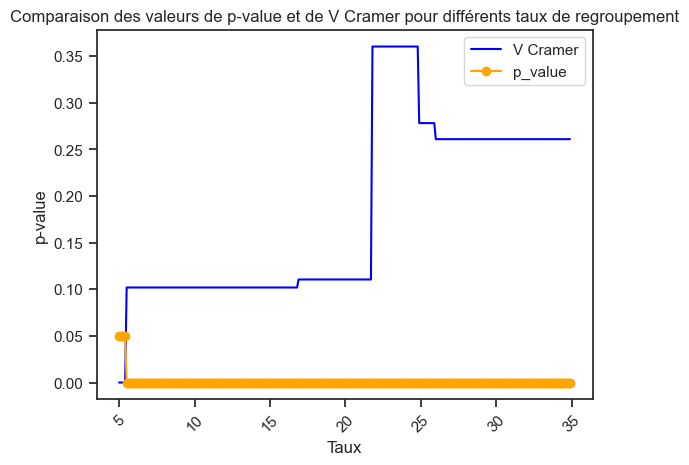

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 7
Meilleurs résultats obtenu avec taux= 16.799999999999958
Liste des modalités regroupées dans la nouvelle catégorie 7 : [6]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.40481



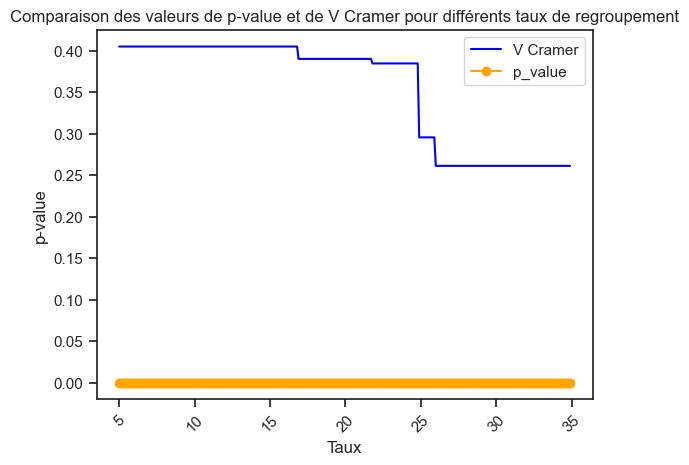


Optimisation Corrélation variable 'agg_catv_perso':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [801]:
# 'agg_catv_perso'
code_to_huelabel = {
    '1' : 'vélo',
    '2' : 'véhicule sans permis',
    '3' : 'moto > 125cm3',
    '4' : 'véhicule léger',
    '5' : 'poids lourds',
    '6' : 'Autres'
}

new_rgmt = analyse_variable_categorielle(train, 'agg_catv_perso', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'AGG_CATV_PERSO'__</span> :</u>
1. Aucune missing value
2. 6 modalités : 2 modalités représentent 80% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.395)
   - après missing Values via modalité la plus fréquente : Cramer=
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.40481
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'AGG_CATV_PERSO'__</span> :</u>

  __==> CETTE VARIABLE SEMBLE MOINS ADHERER A LA VARIABLE CIBLE QUE CATV__

  __<span style="color:red">==> LA VARIABLE SERA ECARTEE DU SCOPE DES VARIABLES EXPLICATIVES__</span>
  

###


<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_CHOC'__ : </span></u>


Point de choc initial :
 -1 - non renseigné
 0 - Aucun
 1 - Avant
 2 – Avant droit
 3 – Avant gauche
 4 – Arrière
 5 – Arrière droit
 6 – Arrière gauche
 7 – Côté droit
 8 – Côté gauche
 9 – Chocs multiples (tonneaux)



Il y a 0.0% (120) de données manquantes (ou assimilées).
Il y a 11 modalités.

vehi_choc
 1    0.389185
 2    0.145056
 3    0.128288
 4    0.079852
 0    0.077587
 7    0.049725
 8    0.046333
 6    0.037662
 5    0.034607
 9    0.011441
-1    0.000263
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.22235

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
vehi_choc                               
-1               52     46     14      8
 0             5579   7317  10303  12181
 1            34197  44274  50997  48002
 2            17797  12861  16516  18972
 3            20066  14302  12391  11741
 4            12582  12596   5560   5675
 5             4573   2457   3889   4862
 6             5622   3339   3620   4593
 7             6047   6993   5234   4401
 8             6769   7635   3962   2762
 9              717   2181   1515    804



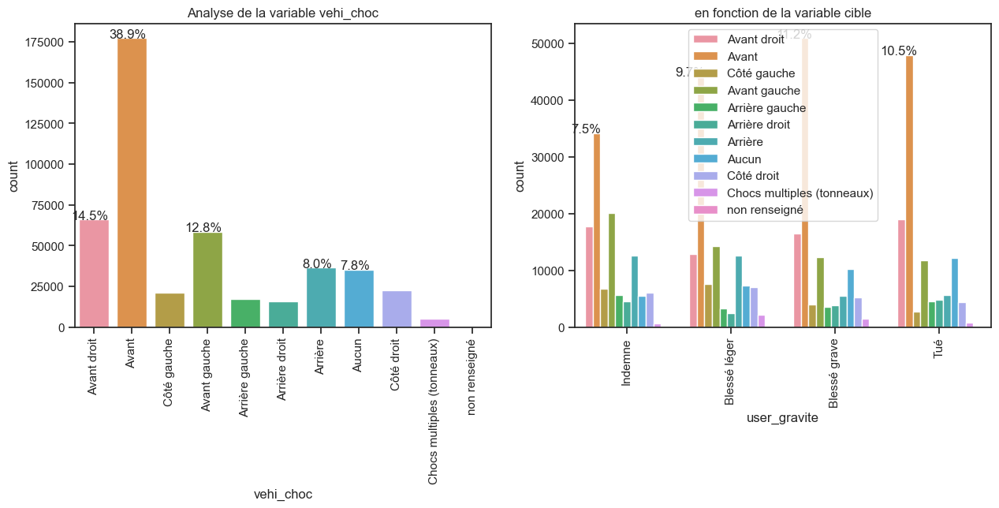

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_choc                                           
-1            0.433333  0.383333  0.116667  0.066667
 0            0.157688  0.206812  0.291210  0.344291
 1            0.192692  0.249473  0.287356  0.270480
 2            0.269056  0.194434  0.249690  0.286820
 3            0.343009  0.244479  0.211812  0.200701
 4            0.345536  0.345920  0.152693  0.155851
 5            0.289779  0.155694  0.246436  0.308092
 6            0.327355  0.194422  0.210784  0.267439
 7            0.266681  0.308401  0.230827  0.194090
 8            0.320381  0.361369  0.187524  0.130727
 9            0.137435  0.418056  0.290397  0.154112


Meilleurs résultats obtenu avec taux= 26.799999999999923
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 2, 5]
Test Statistique du chi2 : p-value=0.000  ; V de Cram

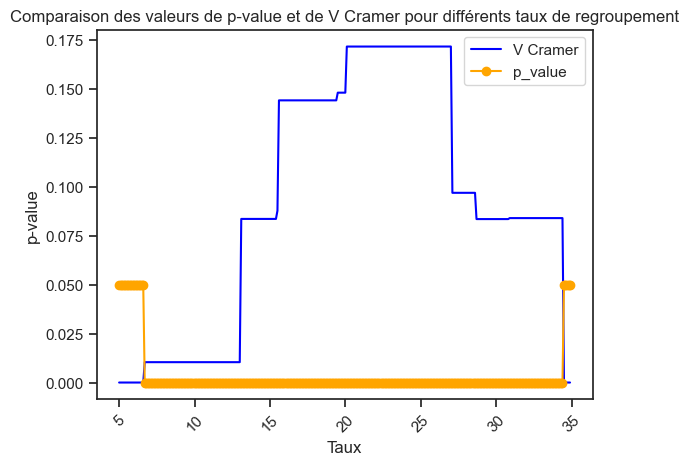

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 12.999999999999972
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.22235



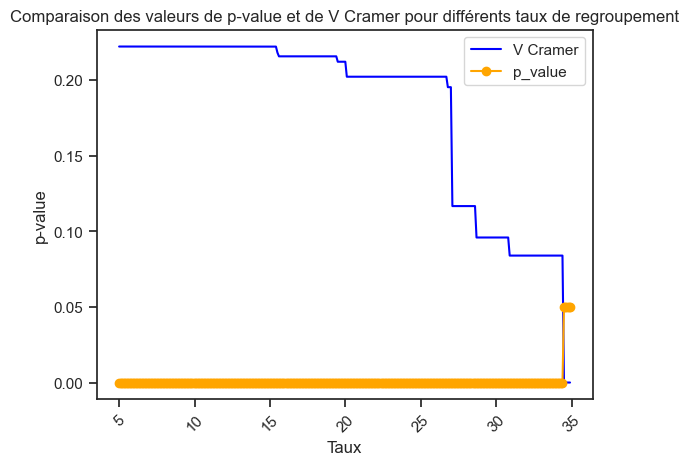


Optimisation Corrélation variable 'vehi_choc':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [802]:
# 'vehi_choc'
code_to_huelabel = {
    '-1': 'non renseigné',
    '0' : 'Aucun',
    '1' : 'Avant',
    '2' : 'Avant droit',
    '3' : 'Avant gauche',
    '4' : 'Arrière',
    '5' : 'Arrière droit',
    '6' : 'Arrière gauche',
    '7' : 'Côté droit',
    '8' : 'Côté gauche',
    '9' : 'Chocs multiples (tonneaux)'
}

new_rgmt = analyse_variable_categorielle(train, 'vehi_choc', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

vehi_chocMV
1    0.364299
3    0.147471
2    0.129622
4    0.098505
8    0.064289
0    0.060414
7    0.057470
6    0.034604
5    0.026914
9    0.016412
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.210

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
vehi_chocMV                            
0              5579   6899   3239   638
1             34249  42255  18954  3164
2             17797  11912   4575   807
3             20066  13491   5314  1052
4             12582  12073   1711   301
5              4573   2163    481    69
6              5622   3104    562    80
7              6047   6737   2417   357
8              6769   7548   2667   420
9               717   2157   1262   307



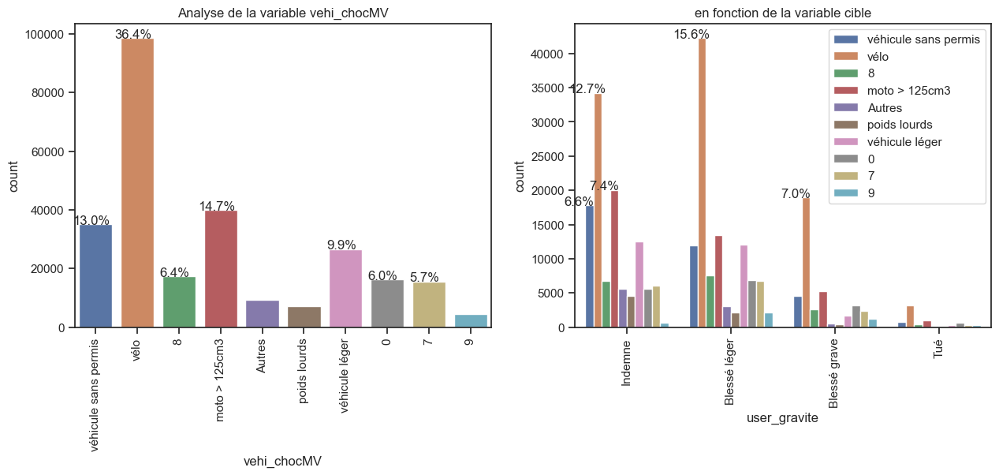

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_chocMV                                         
0             0.341119  0.421828  0.198043  0.039009
1             0.347275  0.428454  0.192188  0.032082
2             0.507167  0.339460  0.130375  0.022997
3             0.502618  0.337926  0.133106  0.026351
4             0.471819  0.452732  0.064162  0.011287
5             0.627642  0.296871  0.066017  0.009470
6             0.600128  0.331341  0.059991  0.008540
7             0.388675  0.433025  0.155354  0.022946
8             0.388934  0.433693  0.153241  0.024132
9             0.161377  0.485483  0.284042  0.069097


Meilleurs résultats obtenu avec taux= 2.7
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16183



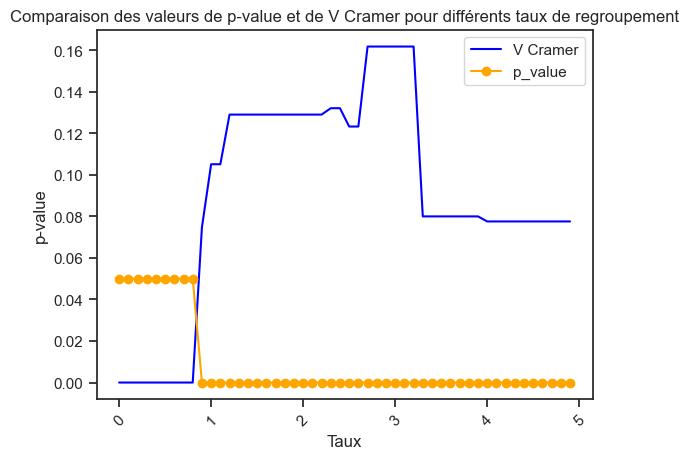

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.21009



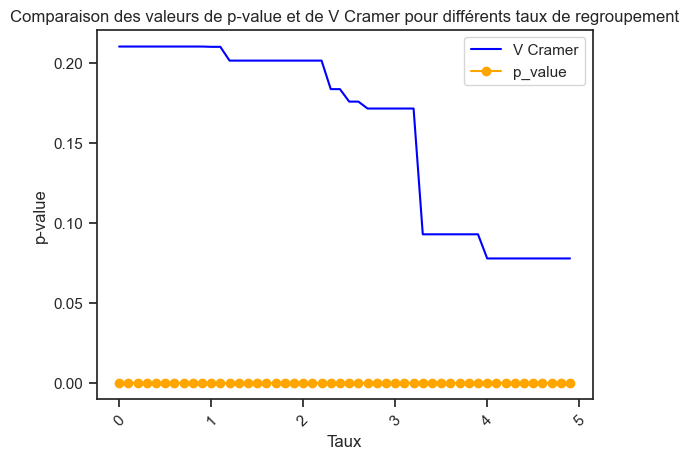


Optimisation Corrélation variable 'vehi_chocMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [676]:
# 'VEHI_CHOC' - Remplacement des missing values
train['vehi_chocMV'] = train.vehi_choc.fillna(train.vehi_choc.mode()[0])                      # valeur NaN si existante
train['vehi_chocMV'] = train.vehi_choc.replace(-1, train.vehi_choc.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'vehi_chocMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_CHOC'__</span> :</u>
1. Quelques missing values (120). 
2. 10 modalités : 5 modalités représentent + de 80% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.210)
   - après missing Values via modalité la plus fréquente : Cramer=0.210
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.22235
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'VEHI_CHOC'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_MANV'__ : </span></u>


Manoeuvre au moment de l'accident



Il y a 0.0% (75) de données manquantes (ou assimilées).
Il y a 28 modalités.

vehi_manv
 1     0.394538
 2     0.083401
 0     0.076789
 15    0.056013
 13    0.049414
 9     0.028533
 17    0.026166
 14    0.024794
 16    0.024684
 26    0.021846
 3     0.019791
 19    0.018498
 5     0.018381
 4     0.017379
 11    0.017307
 12    0.017149
 23    0.016162
 10    0.014735
 7     0.012840
 6     0.012493
 21    0.011794
 8     0.011570
 18    0.007805
 20    0.006752
 22    0.003833
 24    0.003794
 25    0.003375
-1     0.000164
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.39844

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
vehi_manv                               
-1               28     34     10      3
 0             5602   6732  10698  11984
 1            42546  51400  49150  36815
 2            14402  12651   5854   5124
 3              247  

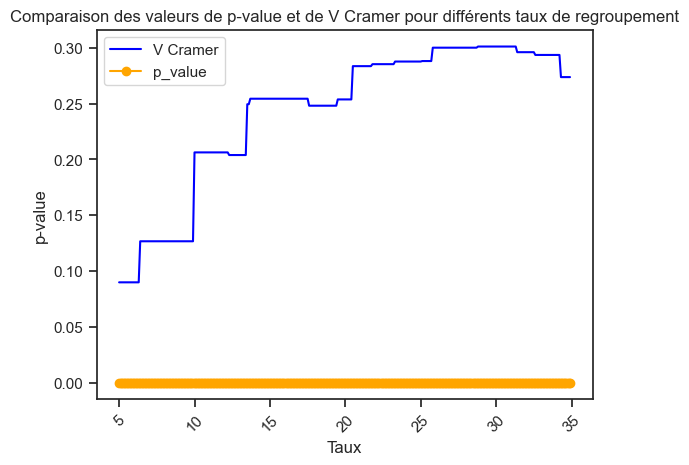

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 27
Meilleurs résultats obtenu avec taux= 6.299999999999995
Liste des modalités regroupées dans la nouvelle catégorie 27 : [-1, 26]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.39844



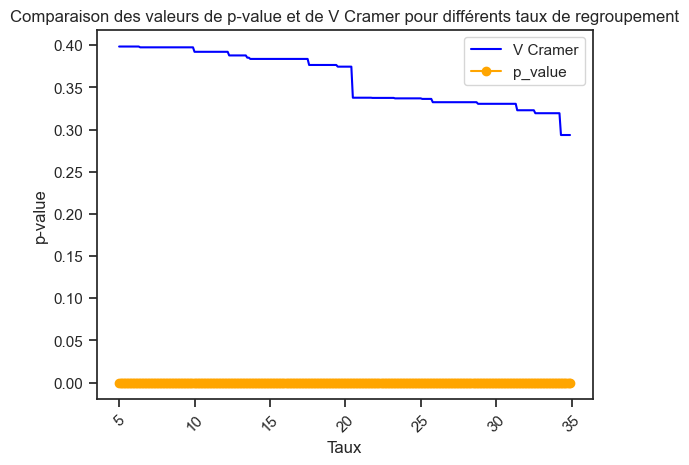


Optimisation Corrélation variable 'vehi_manv':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [803]:
# 'vehi_manv'
new_rgmt = analyse_variable_categorielle(train, 'vehi_manv', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 27 modalités.

vehi_manvMV
1     0.425130
2     0.109930
15    0.077982
0     0.057854
13    0.042868
26    0.034604
17    0.031764
9     0.029052
16    0.027383
19    0.024487
23    0.024232
14    0.021709
21    0.015843
5     0.010561
11    0.010058
12    0.009028
3     0.008769
20    0.006420
4     0.006339
10    0.006150
18    0.005127
24    0.003760
25    0.003088
22    0.002963
7     0.002704
6     0.001707
8     0.000488
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.277

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
vehi_manvMV                            
0              5602   6277   3153   630
1             42574  49046  20250  3220
2             14402  12291   2675   392
3               247   1807    294    26
4               969    470    232    45
5               806   1200    6

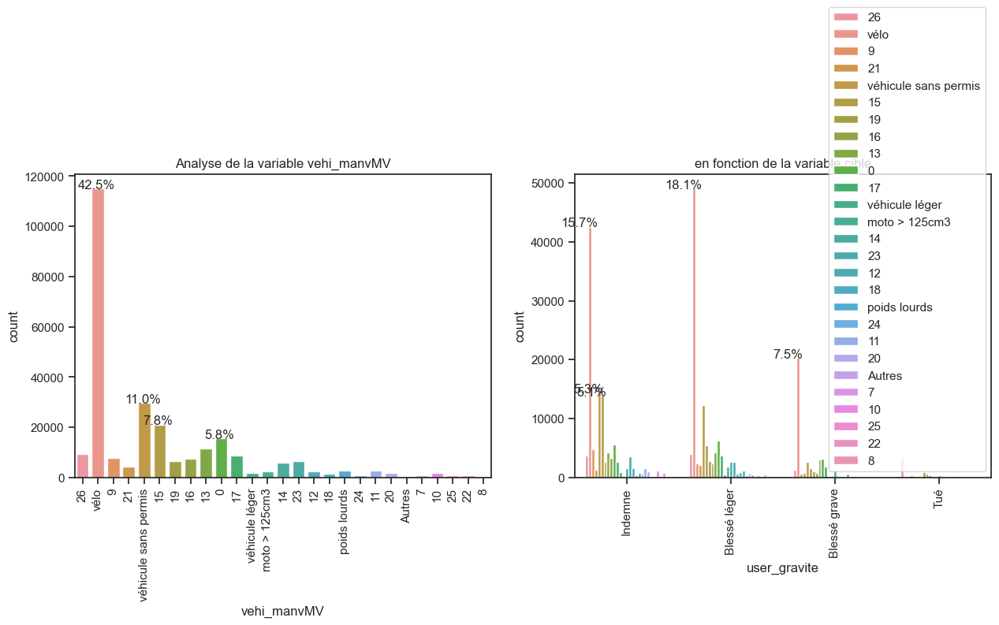

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_manvMV                                         
0             0.357681  0.400779  0.201315  0.040225
1             0.369919  0.426153  0.175949  0.027978
2             0.483938  0.413004  0.089886  0.013172
3             0.104044  0.761163  0.123842  0.010952
4             0.564685  0.273893  0.135198  0.026224
5             0.281917  0.419727  0.236446  0.061910
6             0.290043  0.348485  0.283550  0.077922
7             0.303279  0.588798  0.095628  0.012295
8             0.204545  0.628788  0.159091  0.007576
9             0.604069  0.306548  0.078449  0.010935
10            0.740541  0.184384  0.069069  0.006006
11            0.602644  0.304444  0.077855  0.015057
12            0.665712  0.270049  0.053191  0.011047
13            0.281603  0.369927  0.265144  0.083326
14            0.266633  0.4

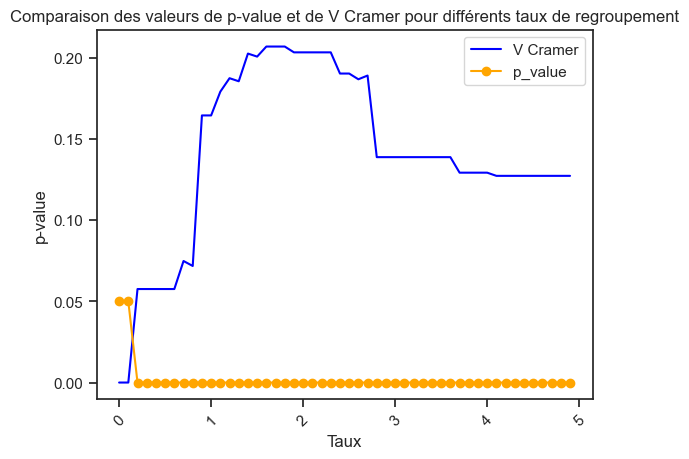

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 27
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 27 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.27728



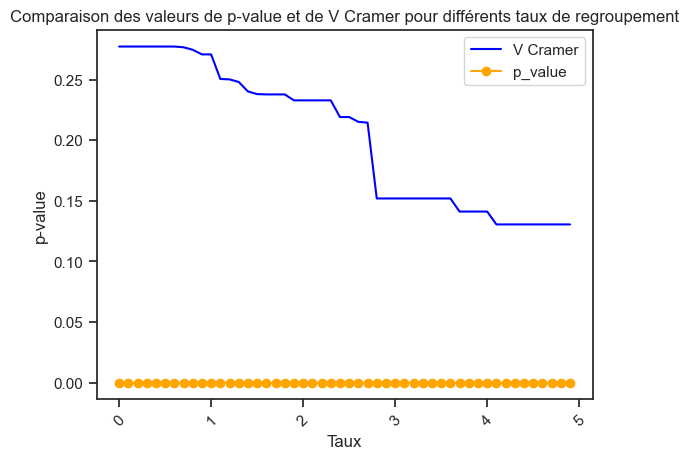


Optimisation Corrélation variable 'vehi_manvMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [677]:
# 'VEHI_MANV' - Remplacement des missing values
train['vehi_manvMV'] = train.vehi_manv.fillna(train.vehi_manv.mode()[0])                      # valeur NaN si existante
train['vehi_manvMV'] = train.vehi_manv.replace(-1, train.vehi_manv.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'vehi_manvMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_MANV'__</span> :</u>
1. Quelques missing values (75). 
2. 27 modalités : 9 modalités représentent + de 80% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.277)
   - après missing Values via modalité la plus fréquente : Cramer=0.277
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.38844
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'VEHI_MANV'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_MOTOR'__ : </span></u>


Type de motorisation du véhicule



Il y a 0.0% (756) de données manquantes (ou assimilées).
Il y a 8 modalités.

vehi_motor
 1    0.823502
 0    0.066945
 5    0.033008
 3    0.031331
 2    0.028320
 4    0.011452
 6    0.003785
-1    0.001658
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.19401

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
vehi_motor                              
-1              209    186    125    236
 0             7395   6530   8373   8229
 1            99517  90839  92058  93106
 2             3159   1899   3427   4429
 3             2006   5489   3489   3303
 4               61    213   2003   2945
 5              966   8182   4203   1701
 6              688    663    323     52



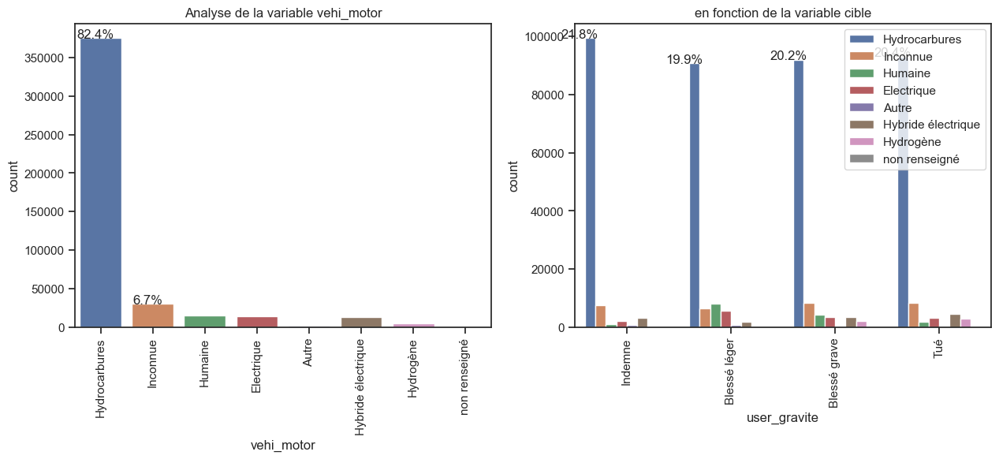

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_motor                                          
-1            0.276455  0.246032  0.165344  0.312169
 0            0.242245  0.213909  0.274282  0.269565
 1            0.265011  0.241902  0.245148  0.247939
 2            0.244618  0.147050  0.265371  0.342961
 3            0.140407  0.384195  0.244208  0.231189
 4            0.011681  0.040789  0.383570  0.563960
 5            0.064178  0.543582  0.279232  0.113008
 6            0.398610  0.384125  0.187138  0.030127


Meilleurs résultats obtenu avec taux= 23.199999999999935
Liste des modalités retenues en modalité de regroupement 1 : [-1, 0, 1, 2, 4]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.14291



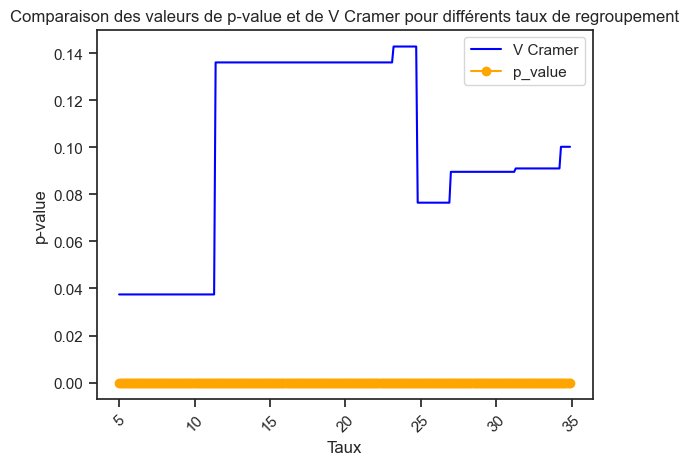

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 7
Meilleurs résultats obtenu avec taux= 11.299999999999978
Liste des modalités regroupées dans la nouvelle catégorie 7 : [6]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.19401



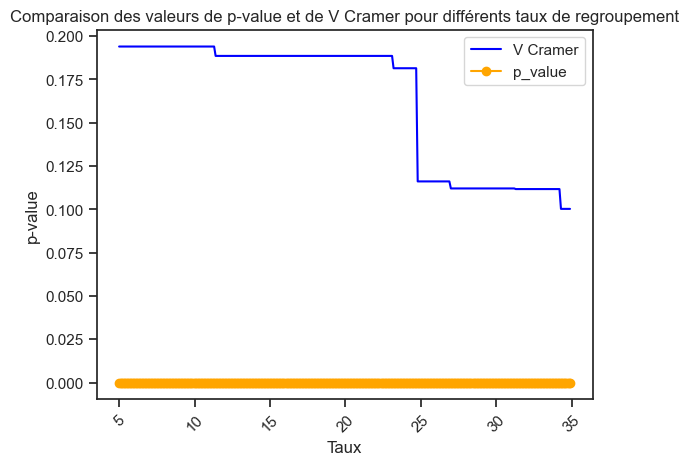


Optimisation Corrélation variable 'vehi_motor':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [806]:
# 'vehi_motor'
code_to_huelabel = {
    '-1': 'non renseigné',
    '0' : 'Inconnue',
    '1' : 'Hydrocarbures',
    '2' : 'Hybride électrique',
    '3' : 'Electrique',
    '4' : 'Hydrogène',
    '5' : 'Humaine',
    '6' : 'Autre'
}

new_rgmt = analyse_variable_categorielle(train, 'vehi_motor', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 7 modalités.

vehi_motorMV
1    0.839212
0    0.058249
5    0.044940
3    0.031439
2    0.019282
6    0.006291
4    0.000587
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.182

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
vehi_motorMV                           
0              7395   5997   2082   295
1             99726  86704  34540  6219
2              3159   1660    343    58
3              2006   5258   1093   154
4                61     74     23     1
5               966   7983   2797   420
6               688    663    304    48



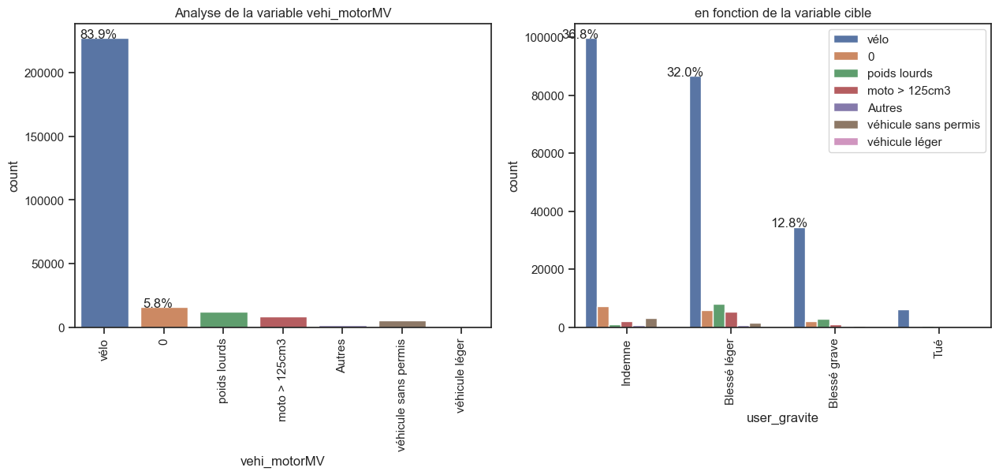

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_motorMV                                        
0             0.468958  0.380303  0.132031  0.018708
1             0.438956  0.381638  0.152032  0.027374
2             0.605172  0.318008  0.065709  0.011111
3             0.235695  0.617789  0.128422  0.018094
4             0.383648  0.465409  0.144654  0.006289
5             0.079402  0.656173  0.229903  0.034522
6             0.403993  0.389313  0.178509  0.028186


Meilleurs résultats obtenu avec taux= 2.9000000000000004
Liste des modalités retenues en modalité de regroupement 1 : [5]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.15078



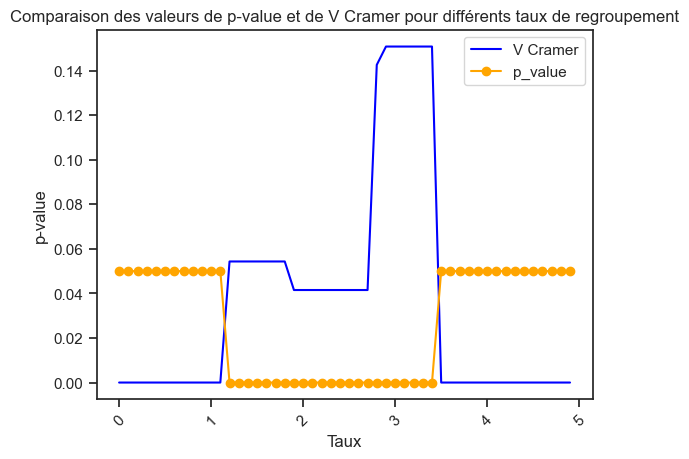

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 7
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 7 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.18246



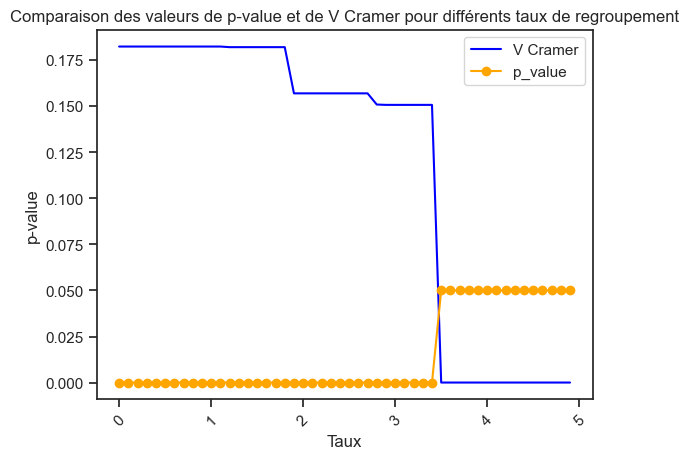


Optimisation Corrélation variable 'vehi_motorMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [678]:
# 'VEHI_MOTOR' - Remplacement des missing values
train['vehi_motorMV'] = train.vehi_motor.fillna(train.vehi_motor.mode()[0])                      # valeur NaN si existante
train['vehi_motorMV'] = train.vehi_motor.replace(-1, train.vehi_motor.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'vehi_motorMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_MOTOR'__</span> :</u>
1. Quelques missing value (460). 
2. 7 modalités : 1 modalité représent + de 83% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.183)
   - après missing Values via modalité la plus fréquente : Cramer=0.182
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.19401 
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'VEHI_MOTOR'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_OBS'__ : </span></u>


Obstacle fixe heurté :




Il y a 0.0% (87) de données manquantes (ou assimilées).
Il y a 19 modalités.

vehi_obs
 0     0.727709
 1     0.048989
 2     0.038625
 3     0.026114
 4     0.023386
 6     0.020373
 13    0.018840
 8     0.016307
 5     0.014495
 7     0.012039
 12    0.011333
 9     0.010037
 10    0.007362
 14    0.007272
 11    0.007153
 15    0.005800
 16    0.003283
 17    0.000693
-1     0.000191
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.37991

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2      3
vehi_obs                                 
-1                27     42     17      1
 0            104747  93409  75982  57700
 1              1993   3508   5554  11284
 2               634   1705   5650   9624
 3               964   1938   3657   5349
 4               897   2670   2786   4311
 5               106    336   2151   4017
 6               613   1544   3187

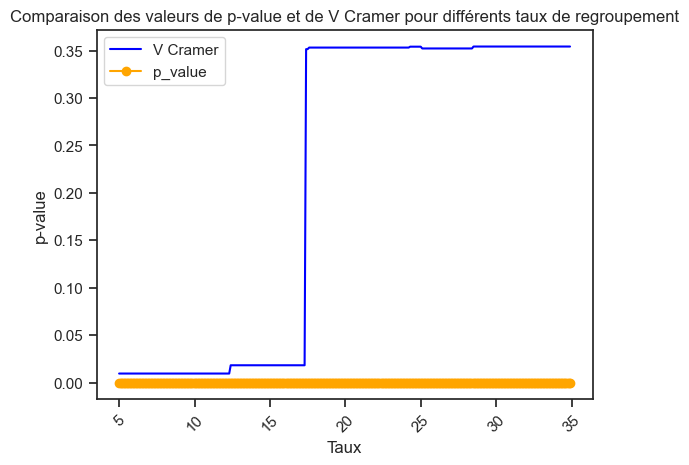

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 18
Meilleurs résultats obtenu avec taux= 12.299999999999974
Liste des modalités regroupées dans la nouvelle catégorie 18 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.37991



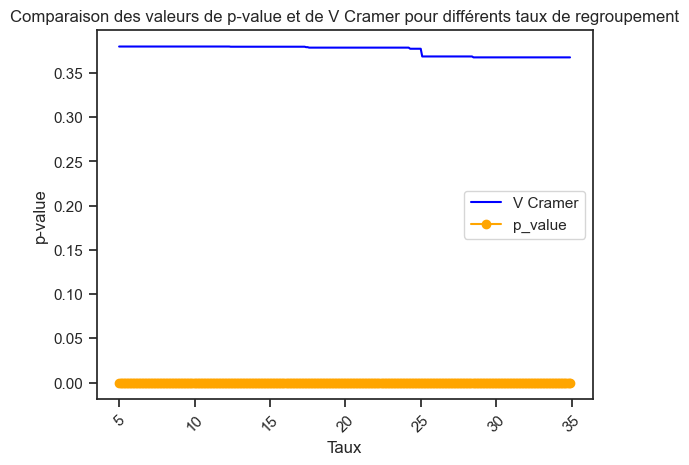


Optimisation Corrélation variable 'vehi_obs':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [807]:
# 'vehi_obs'
new_rgmt = analyse_variable_categorielle(train, 'vehi_obs', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 18 modalités.

vehi_obsMV
0     0.838706
1     0.023586
13    0.020361
2     0.017952
4     0.015548
3     0.014661
6     0.013867
8     0.013704
12    0.007861
14    0.007380
15    0.006786
9     0.005397
16    0.004540
7     0.003483
5     0.002076
11    0.001817
10    0.001197
17    0.001079
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.275

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2     3
vehi_obsMV                              
0             104774  88882  29134  4262
1               1993   3285    936   171
2                634   1527   1995   704
3                964   1797    917   291
4                897   2574    627   111
5                106    256    167    33
6                613   1486   1308   347
7                207    377    306    53
8                742   1660   1032   

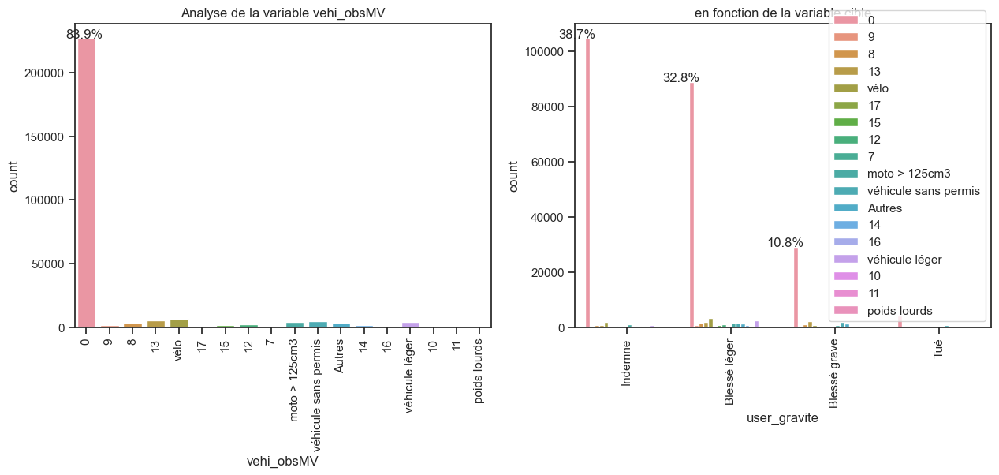

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_obsMV                                          
0             0.461454  0.391461  0.128314  0.018771
1             0.312138  0.514487  0.146594  0.026782
2             0.130453  0.314198  0.410494  0.144856
3             0.242882  0.452759  0.231041  0.073318
4             0.213115  0.611547  0.148967  0.026372
5             0.188612  0.455516  0.297153  0.058719
6             0.163292  0.395844  0.348428  0.092435
7             0.219512  0.399788  0.324496  0.056204
8             0.200000  0.447439  0.278167  0.074394
9             0.255989  0.531143  0.184120  0.028747
10            0.157407  0.429012  0.336420  0.077160
11            0.182927  0.512195  0.258130  0.046748
12            0.192669  0.507989  0.250470  0.048872
13            0.154753  0.357583  0.413462  0.074202
14            0.310811  0.4

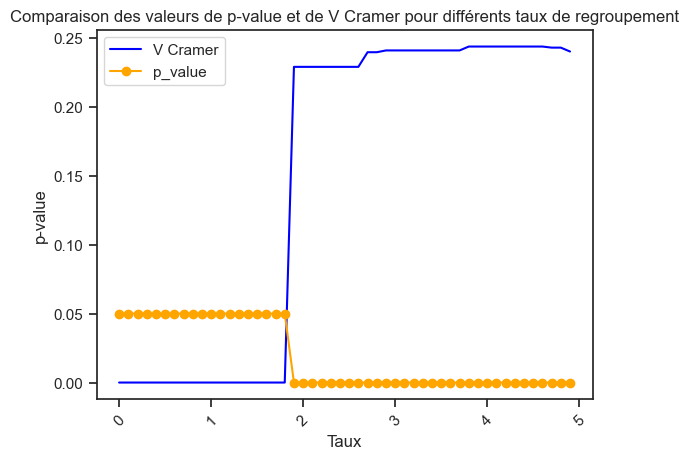

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 18
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 18 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.27488



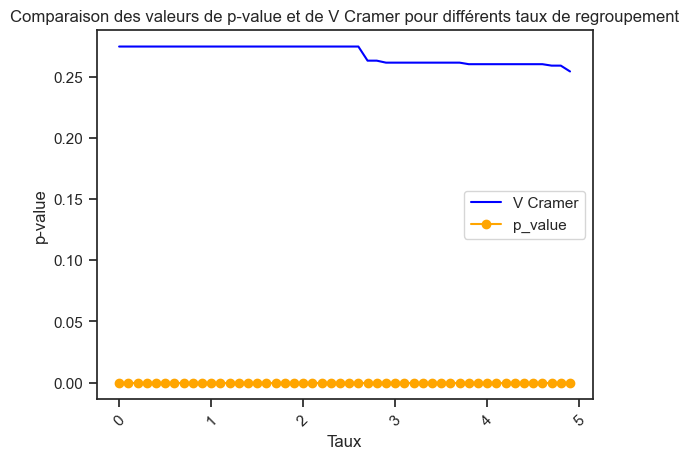


Optimisation Corrélation variable 'vehi_obsMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [679]:
# 'VEHI_OBS' - Remplacement des missing values
train['vehi_obsMV'] = train.vehi_obs.fillna(train.vehi_obs.mode()[0])                      # valeur NaN si existante
train['vehi_obsMV'] = train.vehi_obs.replace(-1, train.vehi_obs.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'vehi_obsMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_OBS'__</span> :</u>
1. Quelques missing values (87). 
2. 18 modalités : 1 modalité représente + de 83% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.275)
   - après missing Values via modalité la plus fréquente : Cramer=0.275
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.37991
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'VEHI_OBS'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_OBSM'__ : </span></u>


Obstacle mobile heurté :
 -1 - non renseigné
 0 : Aucun
 1 – Piéton
 2 – Véhicule
 4 – Véhicule sur rail
 5 – Animal domestique
 6 – Animal sauvage
 9 – Autre




Il y a 0.0% (104) de données manquantes (ou assimilées).
Il y a 11 modalités.

vehi_obsm
 2    0.485994
 0    0.291548
 1    0.204724
 9    0.008842
 3    0.002193
 4    0.002018
 5    0.001682
 6    0.001555
 7    0.000614
 8    0.000603
-1    0.000228
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.43653

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
vehi_obsm                               
-1               31     60     12      1
 0            12169  23891  40594  56293
 1            18408  15217  27746  31984
 2            80245  73692  43770  23908
 3                0     24    384    592
 4               59    171    328    362
 5               30    138    297    302
 6               42    137    316    214
 7                0      6    124    150
 8                0      8    120    147
 9             3017    657    310     48



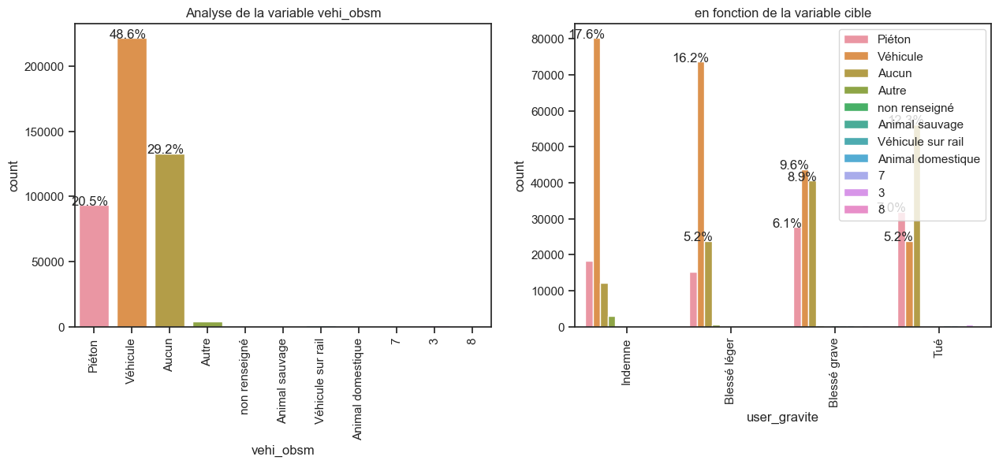

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_obsm                                           
-1            0.298077  0.576923  0.115385  0.009615
 0            0.091533  0.179703  0.305340  0.423424
 1            0.197183  0.163001  0.297210  0.342606
 2            0.362092  0.332523  0.197505  0.107881
 3            0.000000  0.024000  0.384000  0.592000
 4            0.064130  0.185870  0.356522  0.393478
 5            0.039113  0.179922  0.387223  0.393742
 6            0.059238  0.193230  0.445698  0.301834
 7            0.000000  0.021429  0.442857  0.535714
 8            0.000000  0.029091  0.436364  0.534545
 9            0.748264  0.162946  0.076885  0.011905


Meilleurs résultats obtenu avec taux= 10.79999999999998
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 3, 4, 5, 6, 7, 8]
Test Statistique du chi2 : p-value=0.000  

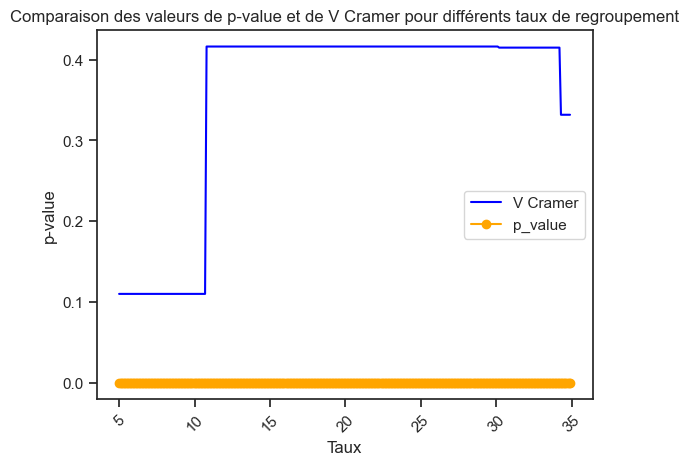

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 10.69999999999998
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.43615



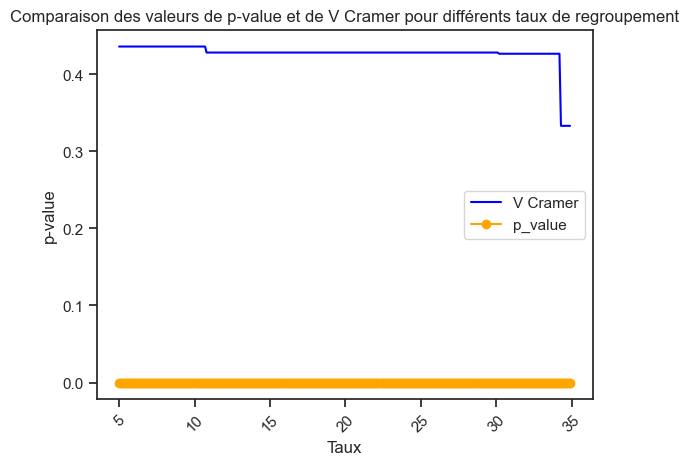


Optimisation Corrélation variable 'vehi_obsm':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [808]:
# 'vehi_obsm'
code_to_huelabel = {
     '-1': 'non renseigné',
     '0' : 'Aucun',
     '1' : 'Piéton',
     '2' : 'Véhicule',
     '4' : 'Véhicule sur rail',
     '5' : 'Animal domestique',
     '6' : 'Animal sauvage',
     '9' : 'Autre'
}

new_rgmt = analyse_variable_categorielle(train, 'vehi_obsm', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 7 modalités.

vehi_obsmMV
2    0.644943
0    0.193250
1    0.143718
9    0.014820
6    0.001382
4    0.001031
5    0.000857
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.253

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
vehi_obsmMV                            
0             12169  22705  14235  3207
1             18408  13750   5696  1053
2             80276  70811  20679  2831
4                59    159     34    27
5                30    127     65    10
6                42    130    179    23
9              3017    657    294    44



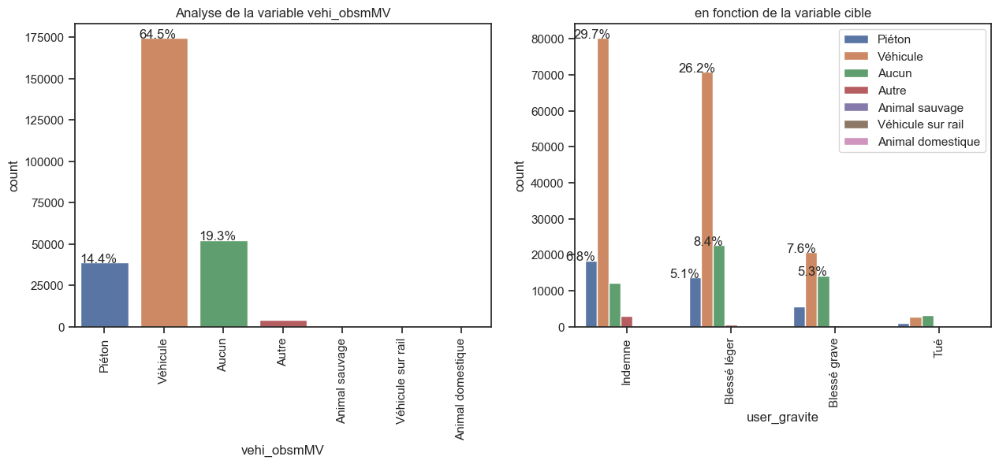

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_obsmMV                                         
0             0.232606  0.433997  0.272096  0.061301
1             0.473128  0.353407  0.146400  0.027065
2             0.459779  0.405568  0.118438  0.016214
4             0.211470  0.569892  0.121864  0.096774
5             0.129310  0.547414  0.280172  0.043103
6             0.112299  0.347594  0.478610  0.061497
9             0.751994  0.163759  0.073280  0.010967


Meilleurs résultats obtenu avec taux= 2.8000000000000003
Liste des modalités retenues en modalité de regroupement 1 : [0, 4, 5, 6]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.23717



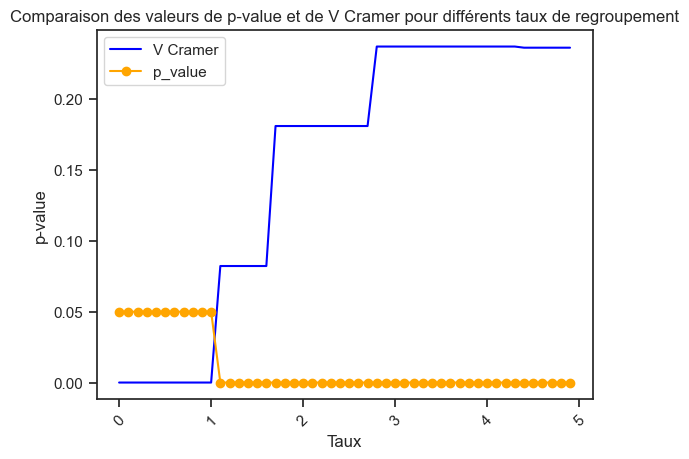

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.25323



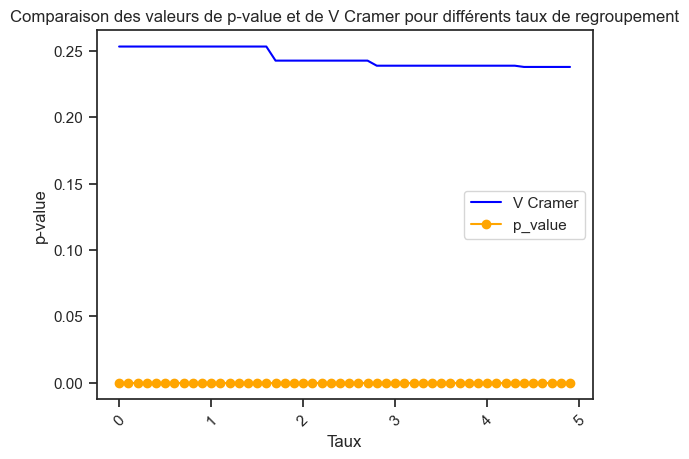


Optimisation Corrélation variable 'vehi_obsmMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [681]:
# 'VEHI_OBSM' - Remplacement des missing values
train['vehi_obsmMV'] = train.vehi_obsm.fillna(train.vehi_obsm.mode()[0])                      # valeur NaN si existante
train['vehi_obsmMV'] = train.vehi_obsm.replace(-1, train.vehi_obsm.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'vehi_obsmMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_OBSM'__</span> :</u>
1. Quelques missing values (104). 
2. 7 modalités : 2 modalités représentent + de 85% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.253)
   - après missing Values via modalité la plus fréquente : Cramer=0.253
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.43653
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'VEHI_OBSM'__</span> :</u>

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__
  

###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'VEHI_SENC'__ : </span></u>


Sens de circulation :
-1 : Non renseign é
0 : incon nu
1 – PK ou PR ou numéro d’adresse postale croissant
 2 – PK ou PR ou numéro d’adresse postale décroissant
 3 – Absence de repère 




Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 4 modalités.

vehi_senc
1    0.516866
2    0.318947
3    0.094767
0    0.069420
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.18975

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
vehi_senc                               
0              7287   7820   9444   7105
1             51596  52276  61248  70573
2             38655  38342  35060  33384
3             16463  15563   8249   2939



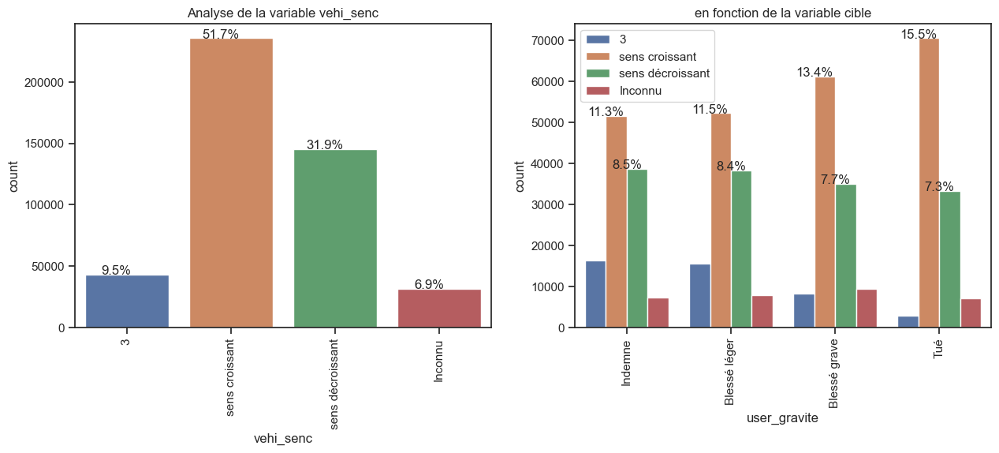

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
vehi_senc                                           
0             0.230193  0.247031  0.298332  0.224444
1             0.218912  0.221797  0.259863  0.299428
2             0.265778  0.263626  0.241060  0.229536
3             0.380965  0.360138  0.190887  0.068010


Meilleurs résultats obtenu avec taux= 6.899999999999993
Liste des modalités retenues en modalité de regroupement 1 : [0, 1, 2]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16612



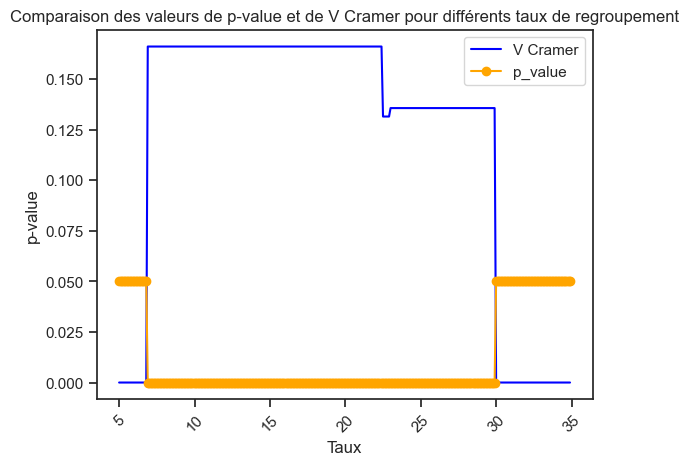

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 4
Meilleurs résultats obtenu avec taux= 22.399999999999938
Liste des modalités regroupées dans la nouvelle catégorie 4 : [3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.18975



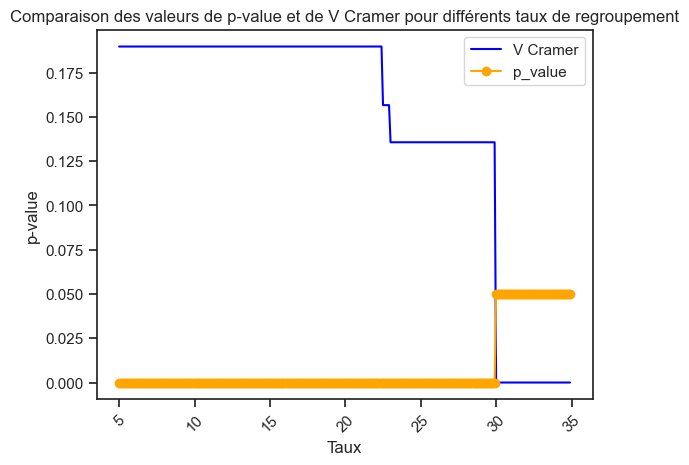


Optimisation Corrélation variable 'vehi_senc':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [811]:
# 'vehi_senc'
code_to_huelabel = {
     '-1': 'non renseigné',
     '0' : 'Inconnu',
     '1' : 'sens croissant',
     '2' : 'sens décroissant',
     '4' : 'Absence de repère'
}
new_rgmt = analyse_variable_categorielle(train, 'vehi_senc', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'VEHI_SENC'__</span> :</u>
1. Aucune missing value
2. 8 modalités : 3 modalités représentent 87% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.022)
   - après missing Values via modalité la plus fréquente : Cramer=
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.18975
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'VEHI_SENC'__</span> :</u>


  __<span style="color:red">==> LA VARIABLE POURRA ETRE ECARTEE DU SCOPE DES VARIABLES EXPLICATIVES__</span>
  

###
99



##### FICHIER __'USER'__

<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_CATU'__ : </span></u>


Catégorie d'usager :
1 : Conducteur
2 : Passager
3 : Piéton



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 3 modalités.

user_catu
1    0.773265
2    0.160773
3    0.065962
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.18966

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
user_catu                               
1             95546  77543  87613  91910
2             17840  23101  15861  16511
3               615  13357  10527   5580



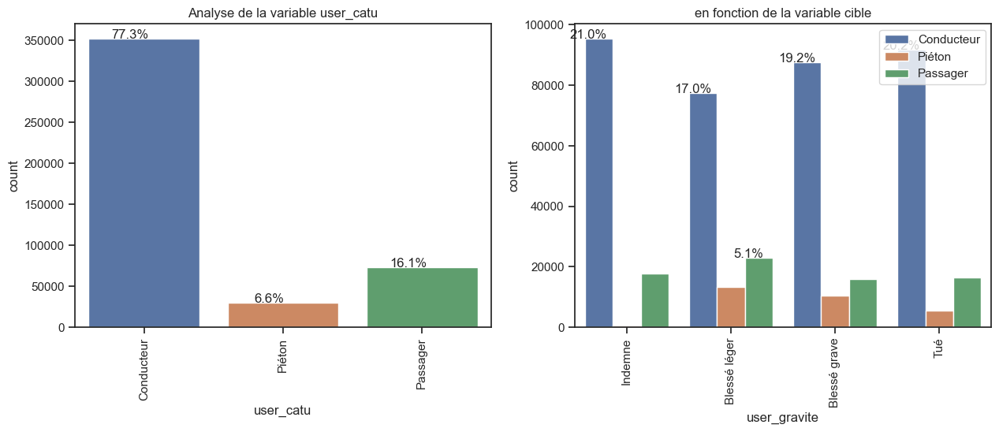

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_catu                                           
1             0.270966  0.219910  0.248469  0.260655
2             0.243340  0.315101  0.216346  0.225212
3             0.020446  0.444064  0.349978  0.185511


Meilleurs résultats obtenu avec taux= 18.59999999999995
Liste des modalités retenues en modalité de regroupement 1 : [1, 2]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.17182



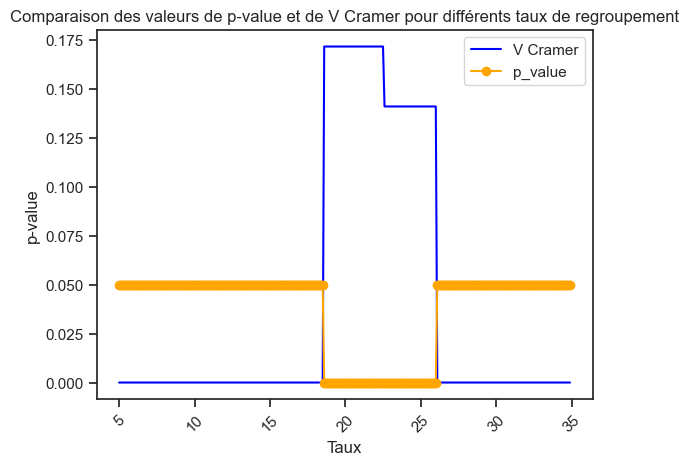

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 4
Meilleurs résultats obtenu avec taux= 22.499999999999936
Liste des modalités regroupées dans la nouvelle catégorie 4 : [3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.18966



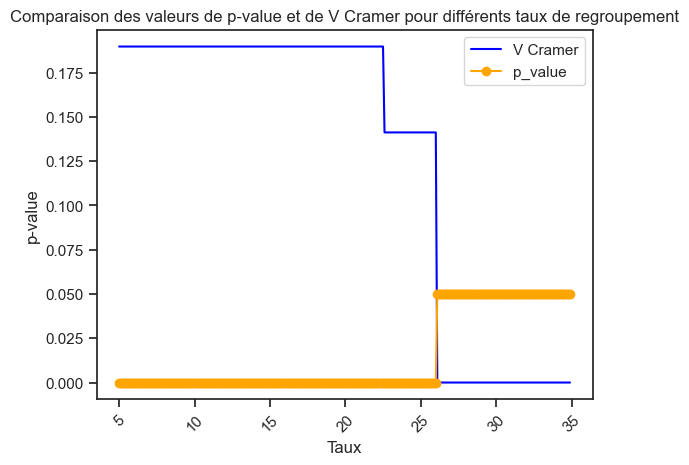


Optimisation Corrélation variable 'user_catu':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [812]:
# 'user_catu'
code_to_huelabel = {
    '1' : 'Conducteur',
    '2' : 'Passager',
    '3' : 'Piéton'
}

new_rgmt = analyse_variable_categorielle(train, 'user_catu', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'USER_CATU'__</span> :</u>
1. Aucune missing value
2. 3 modalités : 2 modalités représentent 92% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.243)
   - après missing Values via modalité la plus fréquente : Cramer=
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.18966
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

  __==> UNE DES VARIABLES DONT LA DISTRIBUTION EST LA PLUS HOMOGENE__

###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_CATU'__</span> :</u>


  __==> LA VARIABLE POURRA ETRE CONSERVEE EN L'ETAT__

###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_ACTP'__ : </span></u>


Action du piéto
B – Inconnue 


In [814]:
# 'user_actp'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '0' : 'Non renseigné ou sans objet',
    '1' : 'Déplac. Sens véhi. heurtant',
    '2' : 'Déplac. Sens inverse véhi.', 
    '3' : 'Traversant',
    '4' : 'Masqué',
    '5' : 'Jouant – courant',
    '6' : 'Avec animal',
    '9' : 'Autre',
    'A' : 'Monte/descend du véhicule',
    'B' : 'Inconnue'
}

# Remplacement des code Alpha 'A' et 'B' par 10 et 11
train.user_actp  = train.user_actp.str.replace('A', '10')
train.user_actp  = train.user_actp.str.replace('B', '11')
train.user_actp = train.user_actp.astype(int)

# Missing Values

new_rgmt = analyse_variable_categorielle(train, 'user_actp', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


KeyError: 'user_actp'


Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 12 modalités.

user_actpMV
0     0.925664
3     0.054603
9     0.004983
1     0.004954
5     0.003055
2     0.002327
11    0.002142
4     0.000979
10    0.000850
6     0.000218
7     0.000118
8     0.000107
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.232

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2     3
user_actpMV                             
0             113397  95474  35572  6150
1                 71    747    406   117
2                 29    342    207    52
3                331   9806   4044   601
4                  3    180     63    19
5                 15    592    208    12
6                  6     19     28     6
7                  1     26      5     0
8                  0     22      7     0
9                 92    729    406   122
10                14    129     60    27
11 

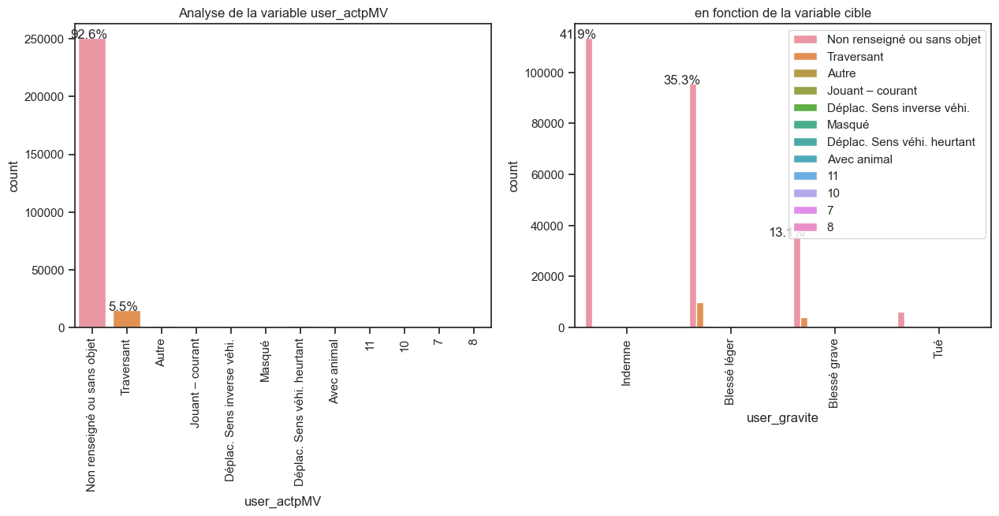

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_actpMV                                         
0             0.452515  0.380992  0.141951  0.024542
1             0.052946  0.557047  0.302759  0.087248
2             0.046032  0.542857  0.328571  0.082540
3             0.022392  0.663374  0.273576  0.040658
4             0.011321  0.679245  0.237736  0.071698
5             0.018138  0.715840  0.251511  0.014510
6             0.101695  0.322034  0.474576  0.101695
7             0.031250  0.812500  0.156250  0.000000
8             0.000000  0.758621  0.241379  0.000000
9             0.068199  0.540400  0.300964  0.090437
10            0.060870  0.560870  0.260870  0.117391
11            0.072414  0.470690  0.303448  0.153448


Meilleurs résultats obtenu avec taux= 2.5
Liste des modalités retenues en modalité de regroupement 1 : [1, 2, 3, 4, 6, 9, 10, 11]
T

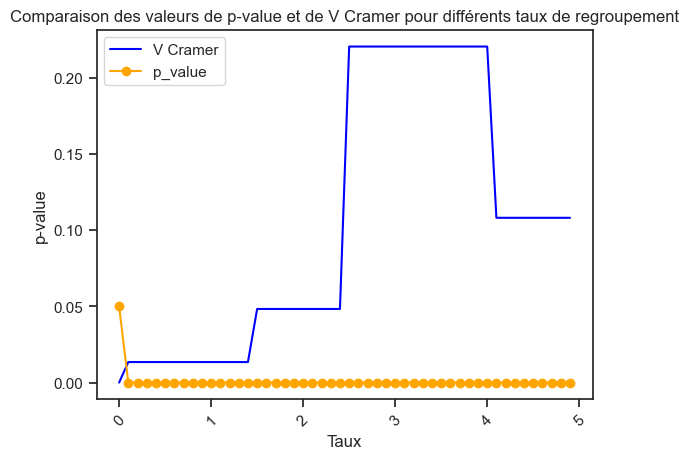

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 12
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 12 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.23226



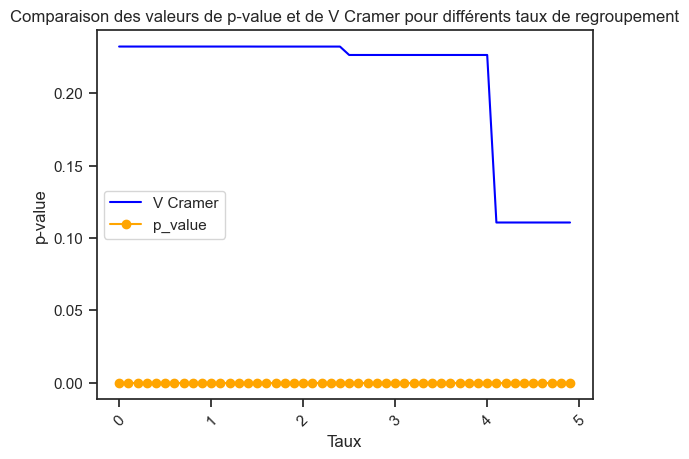


Optimisation Corrélation variable 'user_actpMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [686]:
# 'USER_ACTP' - Remplacement des missing values
train['user_actpMV'] = train.user_actp.fillna(train.user_actp.mode()[0])                      # valeur NaN si existante
train['user_actpMV'] = train.user_actp.replace(-1, train.user_actp.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'user_actpMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'USER_ACTP'__</span> :</u>
1. Quelques missing values (57). 
2. 12 modalités : 1 modalité représente + de 92% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.233)
   - après missing Values via modalité la plus fréquente : Cramer=0.232
   - après Rééquilibrage des classes via SMOTE : V Cramer=non calculé
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration



###


<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_ACTP'__</span> :</u>
  
  __==> TRANSFORMATION DES CODES A --> 10 et B --> 11 et FORCAGE DE LA VARIABLE EN INT__
  
  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__

  __==> TRANSFORMATION ONE HOT ENCODING POURRA ETRE TESTEE__

###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_ETATP'__ : </span></u>


Permet d'identifier si le piéton accidenté était seul ou non :
-1: Non renseigné
0: Sans Objet
1: Seul
2: Accompagné
3: En groupe


Il y a 0.0% (363) de données manquantes (ou assimilées).
Il y a 5 modalités.

user_etatp
 0    0.927952
 1    0.058554
 2    0.010862
 3    0.001836
-1    0.000796
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.17556

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0       1       2       3
user_etatp                                  
-1                32     246      78       7
 0            113367  100558  102506  106719
 1               239   10005    9789    6668
 2               289    2718    1382     564
 3                74     474     246      43



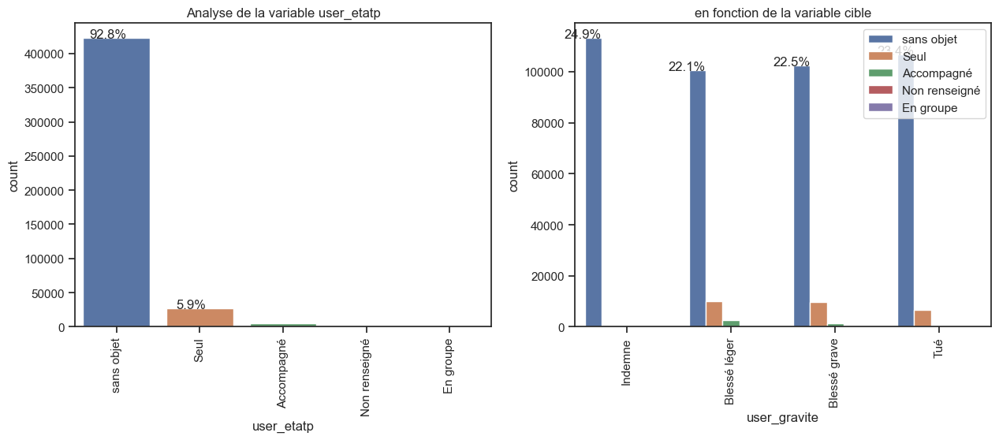

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_etatp                                          
-1            0.088154  0.677686  0.214876  0.019284
 0            0.267912  0.237641  0.242245  0.252201
 1            0.008951  0.374705  0.366615  0.249728
 2            0.058348  0.548758  0.279023  0.113870
 3            0.088411  0.566308  0.293907  0.051374


Meilleurs résultats obtenu avec taux= 24.99999999999993
Liste des modalités retenues en modalité de regroupement 1 : [0]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16657



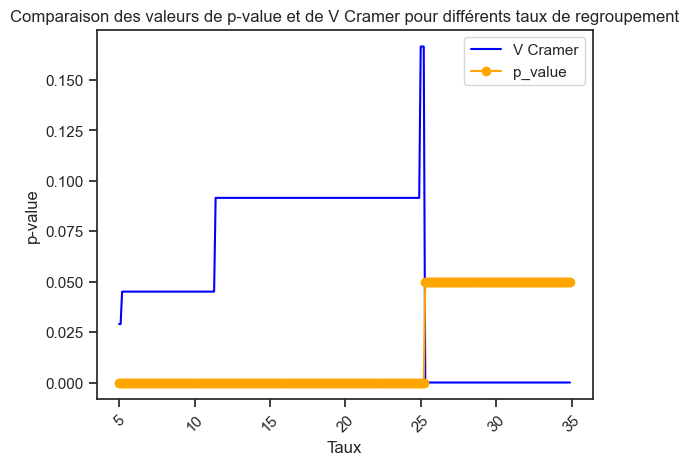

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 4
Meilleurs résultats obtenu avec taux= 5.1
Liste des modalités regroupées dans la nouvelle catégorie 4 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.17556



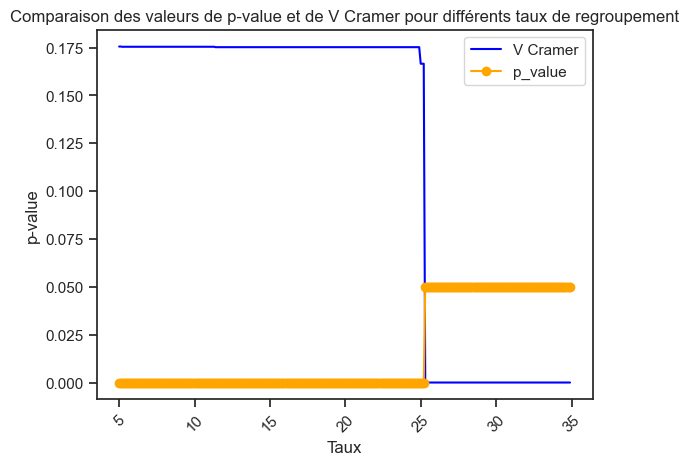


Optimisation Corrélation variable 'user_etatp':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [815]:
# 'user_etatp'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '0' : 'sans objet',
    '1' : 'Seul',
    '2' : 'Accompagné', 
    '3' : 'En groupe'
}

new_rgmt = analyse_variable_categorielle(train, 'user_etatp', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 4 modalités.

user_etatpMV
0    0.925756
1    0.056365
2    0.015012
3    0.002866
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.227

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2     3
user_etatpMV                            
0             113399  95521  35558  6140
1                239   9670   4464   886
2                289   2675    968   132
3                 74    473    192    37



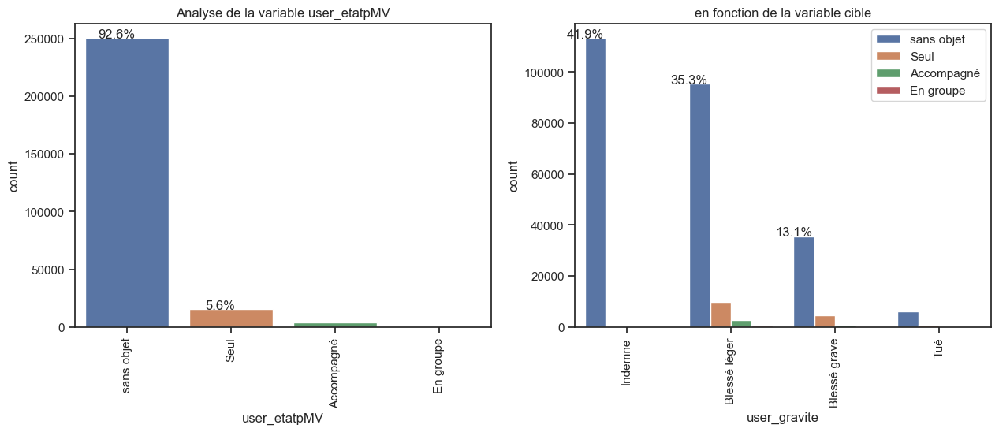

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_etatpMV                                        
0             0.452477  0.381142  0.141881  0.024499
1             0.015663  0.633724  0.292549  0.058064
2             0.071112  0.658219  0.238189  0.032480
3             0.095361  0.609536  0.247423  0.047680


Meilleurs résultats obtenu avec taux= 2.5
Liste des modalités retenues en modalité de regroupement 1 : [1, 2, 3]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.22599



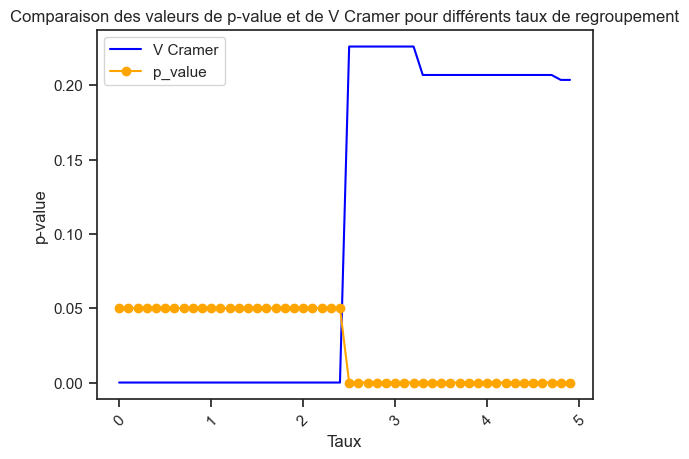

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 4
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 4 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.22750



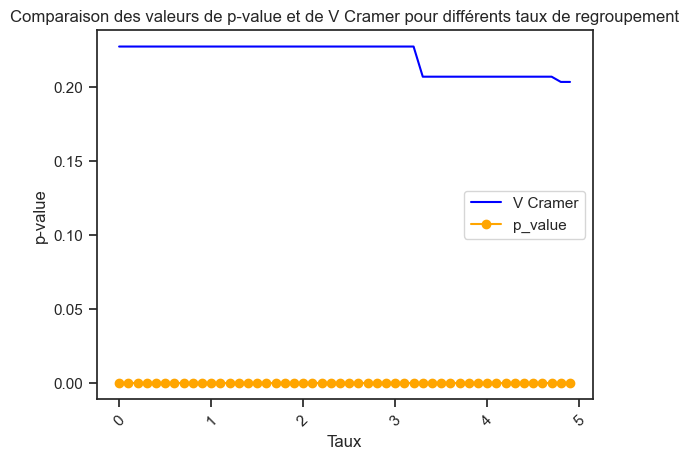


Optimisation Corrélation variable 'user_etatpMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [691]:
# 'USER_ETATP' - Remplacement des missing values
train['user_etatpMV'] = train.user_etatp.fillna(train.user_etatp.mode()[0])                      # valeur NaN si existante
train['user_etatpMV'] = train.user_etatp.replace(-1, train.user_etatp.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'user_etatpMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'USER_ETATP'__</span> :</u>
1. Quelques missing values (361). 
2. 4 modalités : 1 modalité représente 92% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.229)
   - après missing Values via modalité la plus fréquente : Cramer=0.227
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.17556
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_ETATP'__</span> :</u>
  
  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__


###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_LOCP'__ : </span></u>



Localisaiton du piéton :
-1: Non renseigné
0: Sans objet
Sur chaussée :
1: A + 50 m du passage piéton
2: A – 50 m du passage piéton
Sur passage piéton :
3: Sans signalisation lumineuse
4: Avec signalisation lumineuse
Divers :
5: Sur trottoir
6: Sur accotement
7 – Sur refuge ou BAU
8 – Sur contre allée
9 – Inconnue 


Il y a 0.0% (61) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_locp
 0    0.904187
 1    0.024866
 2    0.024245
 3    0.022765
 4    0.010693
 5    0.006037
 6    0.002393
 9    0.002235
 8    0.001454
 7    0.000991
-1    0.000134
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.20626

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0       1      2      3
user_locp                                 
-1                 3      44     14      0
 0            113400  100504  98706  99703
 1                77    1705   4281   5276
 2               100    3171   4184   3601
 3               135    4208   3809   2229
 4                82    2304   1272   1218
 5               116    1074    734    829
 6                41     236    350    464
 7                 1      19    148    284
 8                14     180    207    262
 9                32     556    29

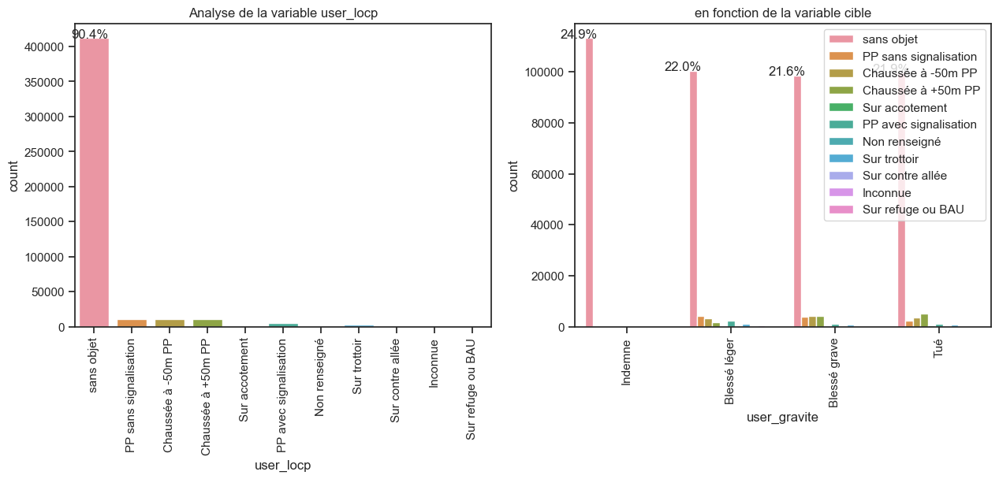

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_locp                                           
-1            0.049180  0.721311  0.229508  0.000000
 0            0.275034  0.243757  0.239396  0.241814
 1            0.006791  0.150366  0.377547  0.465297
 2            0.009045  0.286813  0.378437  0.325705
 3            0.013005  0.405356  0.366920  0.214719
 4            0.016817  0.472518  0.260870  0.249795
 5            0.042136  0.390120  0.266618  0.301126
 6            0.037580  0.216315  0.320807  0.425298
 7            0.002212  0.042035  0.327434  0.628319
 8            0.021116  0.271493  0.312217  0.395173
 9            0.031403  0.545633  0.290481  0.132483


Meilleurs résultats obtenu avec taux= 24.199999999999932
Liste des modalités retenues en modalité de regroupement 1 : [1, 2, 4, 5, 6, 7, 8]
Test Statistique du chi2 : p-value=0.000  ; 

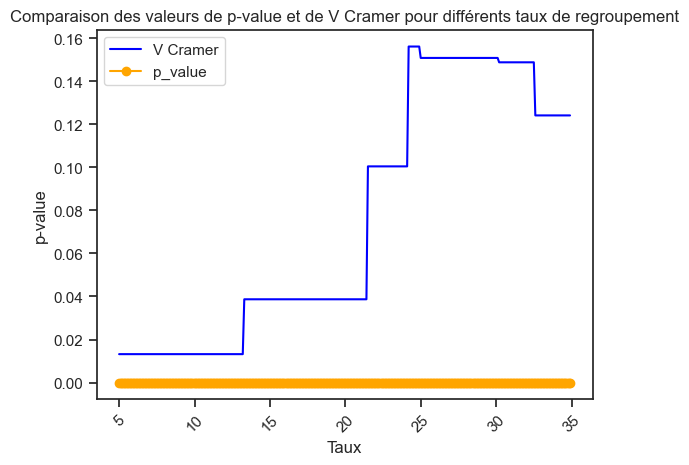

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 13.19999999999997
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.20626



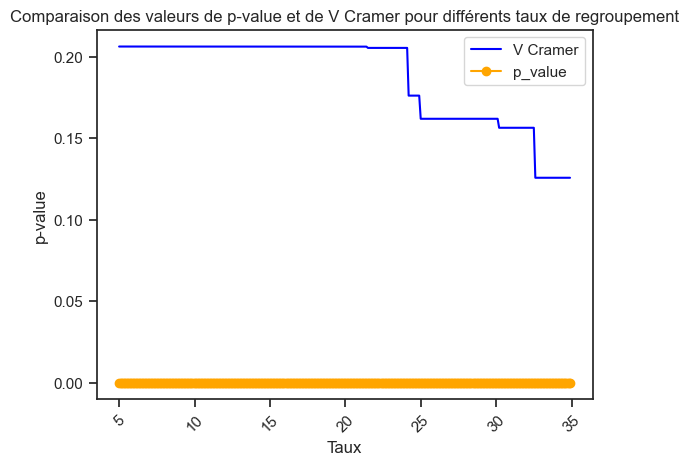


Optimisation Corrélation variable 'user_locp':
OPTIMISATION REGROUPEMENT NON BINAIRE : taux de regroupement optimal=13.19999999999997 , best_p_value=0.000  - best_V_Cramer=0.20626
Liste des catégories conservées :  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Liste des modalités regroupées pour former la nouvelle modalité '10' : [-1]


In [816]:
# 'user_locp'
code_to_huelabel = {
    '-1': 'Non renseigné',
    '0' : 'sans objet',
    '1' : 'Chaussée à +50m PP',
    '2' : 'Chaussée à -50m PP', 
    '3' : 'PP sans signalisation',
    '4' : 'PP avec signalisation',
    '5' : 'Sur trottoir',
    '6' : 'Sur accotement',
    '7' : 'Sur refuge ou BAU',
    '8' : 'Sur contre allée',
    '9' : 'Inconnue'
}

new_rgmt = analyse_variable_categorielle(train, 'user_locp', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

user_locpMV
0    0.925912
3    0.022784
2    0.016493
4    0.011093
1    0.010993
5    0.005951
9    0.003476
6    0.002154
8    0.001056
7    0.000089
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.240

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2     3
user_locpMV                             
0             113403  95522  35581  6154
1                 77   1503   1052   344
2                100   2971   1210   184
3                135   4075   1777   181
4                 82   2246    598    77
5                116   1052    396    47
6                 41    228    196   118
7                  1     15      8     0
8                 14    172     88    12
9                 32    555    276    78



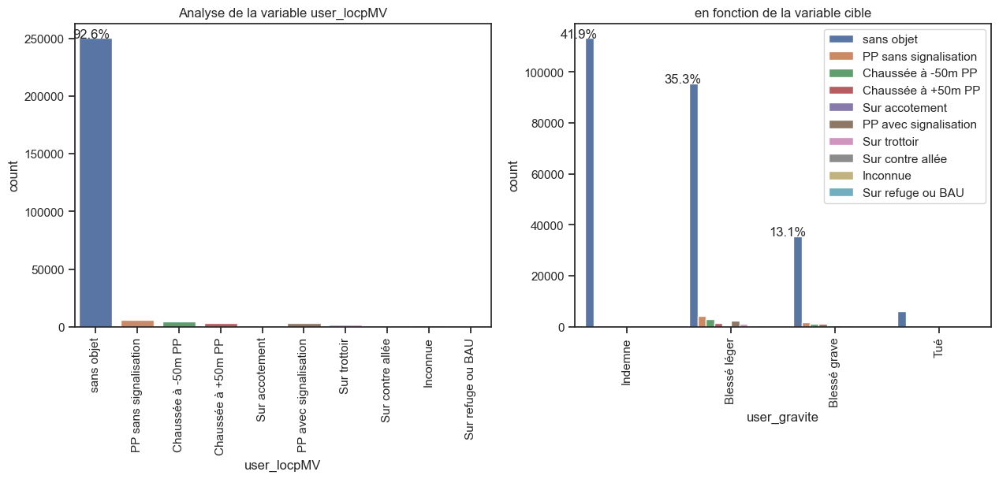

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_locpMV                                         
0             0.452418  0.381082  0.141949  0.024551
1             0.025874  0.505040  0.353495  0.115591
2             0.022396  0.665398  0.270997  0.041209
3             0.021887  0.660668  0.288100  0.029345
4             0.027306  0.747919  0.199134  0.025641
5             0.072005  0.653011  0.245810  0.029174
6             0.070326  0.391081  0.336192  0.202401
7             0.041667  0.625000  0.333333  0.000000
8             0.048951  0.601399  0.307692  0.041958
9             0.034006  0.589798  0.293305  0.082891


Meilleurs résultats obtenu avec taux= 2.5
Liste des modalités retenues en modalité de regroupement 1 : [1, 2, 3, 4, 5, 6, 8, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.22554



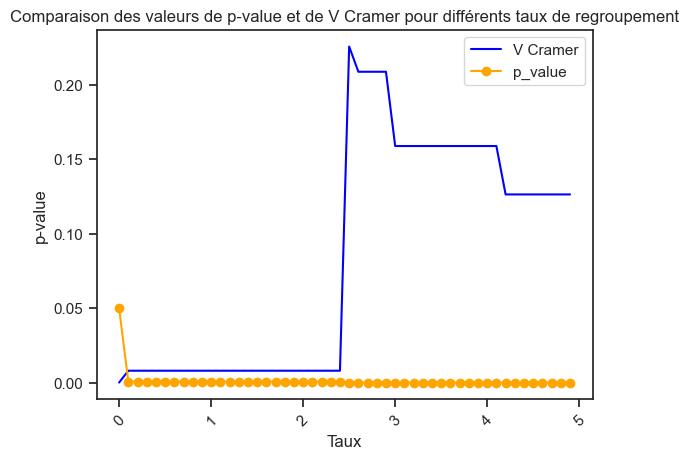

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.24033



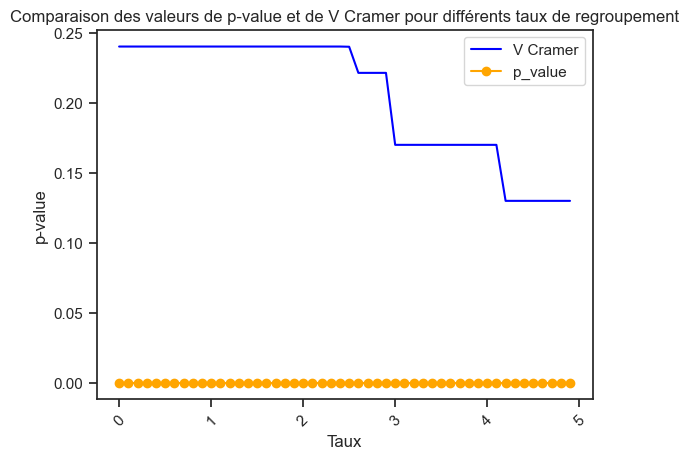


Optimisation Corrélation variable 'user_locpMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [693]:
# 'USER_LOCP' - Remplacement des missing values
train['user_locpMV'] = train.user_locp.fillna(train.user_locp.mode()[0])                      # valeur NaN si existante
train['user_locpMV'] = train.user_locp.replace(-1, train.user_locp.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'user_locpMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'USER_LOCP'__</span> :</u>
1. Quelques missing values (61). 
2. 10 modalités : 1 modalité représentent + de 92% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.241)
   - après missing Values via modalité la plus fréquente : Cramer=0.240
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.20626
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_LOCP'__</span> :</u>
  
  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__


###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_PLACE'__ : </span></u>


Emplacement de la personne dans le véhicule :
-1 : Non renseigné
0 : Piéton
1 : Conducteur
2 : place avant droit véhicule + 3 roue - place arrière véhicule à moins de 4 roues
3 : Place arrière droit (y compris les side-car)
4 : Place arrière gauche
5: Place arrière centrale
6: Place avant centre
7 : Place latérale gauche (au moins un siège devant et un siège derrière)
8: Centre du véhicule (au moins un siège de chaque coté)
9: Latéral droit (au moins un siège devant et au moins un derrière)
10: Piéton





Il y a 0.0% (3) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_place
 1     0.733169
 2     0.089304
 10    0.065964
 3     0.025085
 4     0.021120
 7     0.014936
 9     0.014695
 5     0.013307
 8     0.011658
 6     0.010754
-1     0.000007
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.26343

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
user_place                              
-1                3      0      0      0
 1            95507  76918  81428  80475
 2            10723  14828   8635   6537
 3             2018   2830   2705   3886
 4             1815   2487   2143   3186
 5              550    737   1763   3018
 6              168    235   1560   2941
 7             1022   1017   1928   2844
 8              392    569   1562   2793
 9             1187   1023   1750   2741
 10             616  13357  10527   5580

TENTA

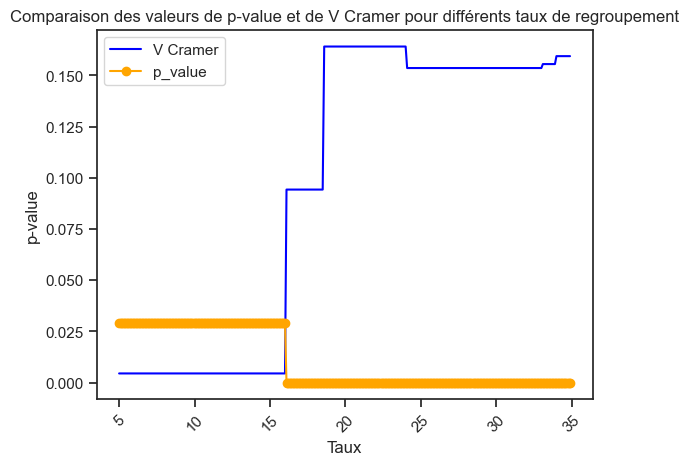

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 11
Meilleurs résultats obtenu avec taux= 15.999999999999961
Liste des modalités regroupées dans la nouvelle catégorie 11 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.26343



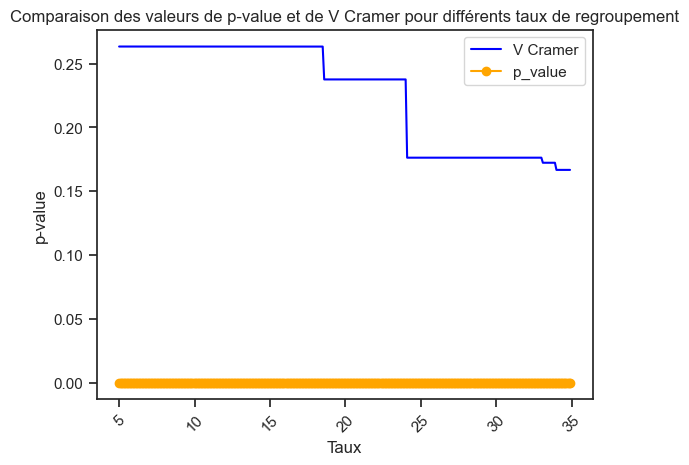


Optimisation Corrélation variable 'user_place':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [817]:
# 'user_place'
new_rgmt = analyse_variable_categorielle(train, 'user_place', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

user_placeMV
1     0.745768
2     0.112601
10    0.075451
3     0.019145
4     0.017347
9     0.009933
7     0.009205
5     0.005112
8     0.004111
6     0.001326
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.24847

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
user_placeMV                           
1             95510  72773  28538  5071
2             10723  14397   4697   666
3              2018   2615    461    89
4              1815   2374    429    78
5               550    633    166    35
6               168    146     43     2
7              1022    929    461    80
8               392    489    195    37
9              1187    931    496    75
10              616  13052   5696  1062



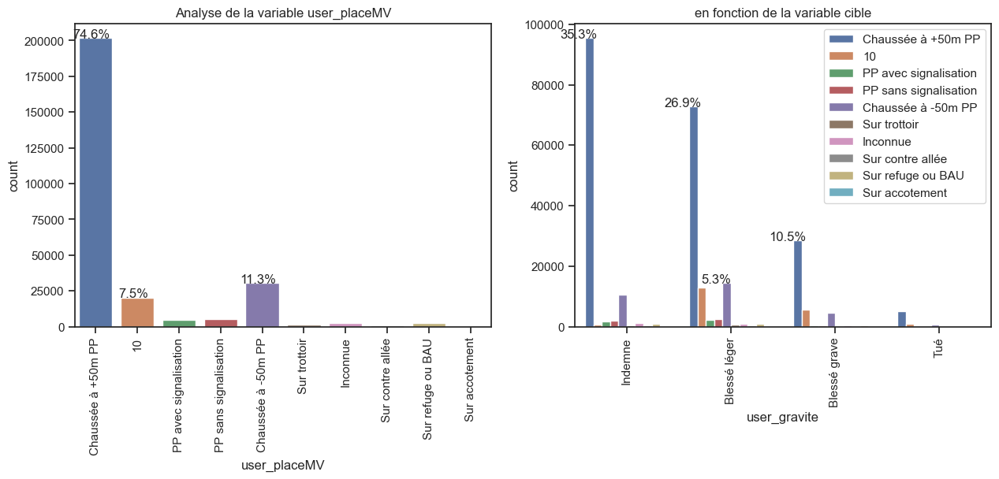

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_placeMV                                        
1             0.473075  0.360455  0.141353  0.025117
2             0.351770  0.472296  0.154086  0.021848
3             0.389350  0.504534  0.088945  0.017172
4             0.386499  0.505537  0.091354  0.016610
5             0.397399  0.457370  0.119942  0.025289
6             0.467967  0.406685  0.119777  0.005571
7             0.410112  0.372793  0.184992  0.032103
8             0.352201  0.439353  0.175202  0.033243
9             0.441428  0.346225  0.184455  0.027891
10            0.030158  0.638990  0.278860  0.051993


Meilleurs résultats obtenu avec taux= 3.4000000000000004
Liste des modalités retenues en modalité de regroupement 1 : [10]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.22770



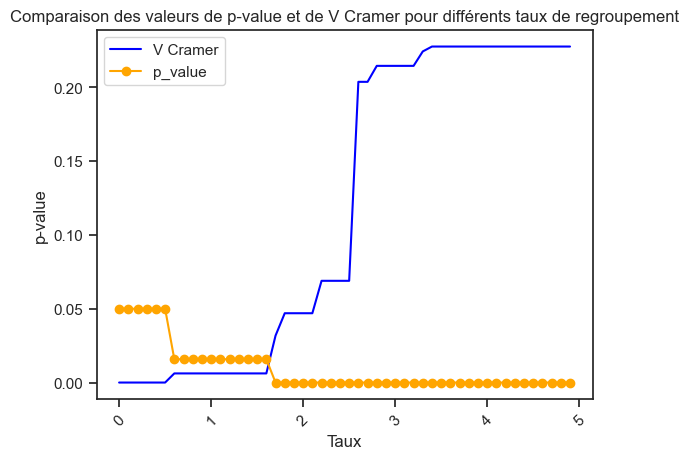

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 11
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 11 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.24847



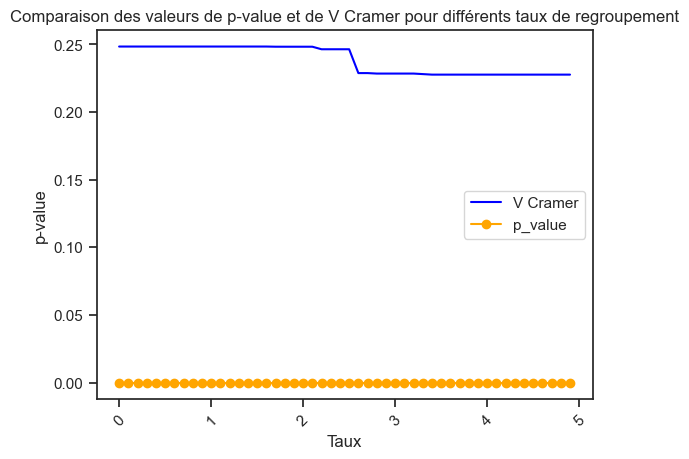


Optimisation Corrélation variable 'user_placeMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [697]:
# 'USER_LOCP' - Remplacement des missing values
train['user_placeMV'] = train.user_place.fillna(train.user_place.mode()[0])                      # valeur NaN si existante
train['user_placeMV'] = train.user_place.replace(-1, train.user_place.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'user_placeMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'USER_PLACE'__</span> :</u>
1. Quelques missing values (3). 
2. 10 modalités : 2 modalités représentent + de 85% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.24850)
   - après missing Values via modalité la plus fréquente : Cramer=0.24847
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.26343
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_PLACE'__</span> :</u>
  
  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1' OU REMPLACEMENT PAR MODE[0]__


###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_SECU1'__ : </span></u>



Le renseignement indique la présence et l'utilisation de l'équipement :
-1: Non renseigné
0: Aucun équipement
1: Ceinture
2: Casque
3: Dispositif enfants
4: Gilet réfléchissant
5: Airbag (2RM/3RM)
6: Gants (2RM/3RM)
7: Gants + Airbag (2RM/3RM)
8: Non déterminable
9: Autre 




Il y a 1.0% (3946) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_secu1
 1    0.498814
 2    0.186404
 0    0.171060
 8    0.074686
 3    0.015395
 4    0.011406
 6    0.011360
 5    0.011178
 7    0.010502
-1    0.008653
 9    0.000544
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.54021

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
user_secu1                              
-1             3781    117     39      9
 0             1781  14747  23666  37810
 1            92422  53148  41413  40478
 2             4323  30430  33540  16708
 3              793    834   2054   3339
 4               31    202   1878   3090
 5               19    132   1835   3111
 6               14    195   1916   3055
 7                1    136   1744   2908
 8            10750  13996   5833   3478
 9               86     64     83     15

TENTATIVE OPT

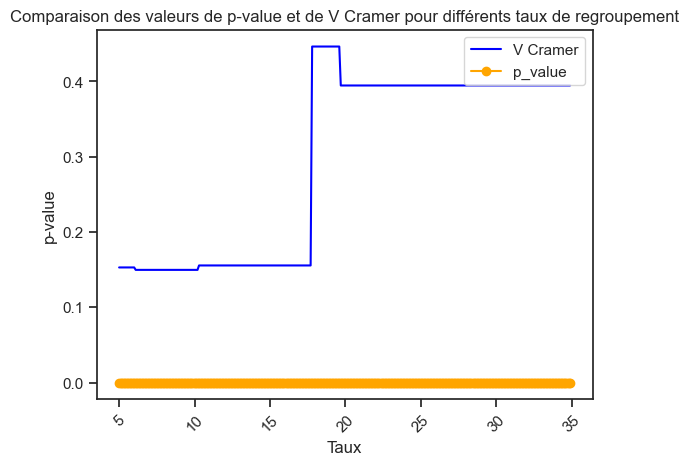

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 5.9999999999999964
Liste des modalités regroupées dans la nouvelle catégorie 10 : [-1]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.54021



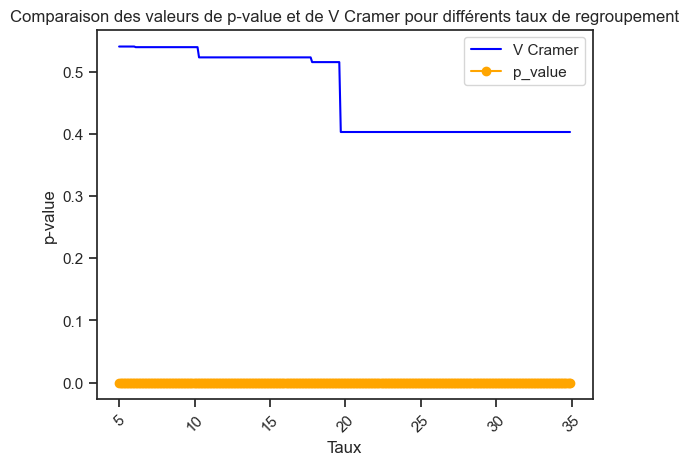


Optimisation Corrélation variable 'user_secu1':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [818]:
# 'user_secu1'
new_rgmt = analyse_variable_categorielle(train, 'user_secu1', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

user_secu1MV
1    0.598422
2    0.187369
8    0.111338
0    0.094180
3    0.006113
9    0.000909
6    0.000772
4    0.000639
5    0.000222
7    0.000037
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.46811

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
user_secu1MV                           
0              1781  13943   7809  1963
1             95322  50402  13834  2445
2              4846  29314  14759  1805
3               793    703    131    28
4                31     57     62    23
5                19     14     20     7
6                14     55    123    17
7                 1      3      6     0
8             11108  13784   4357   892
9                86     64     81    15



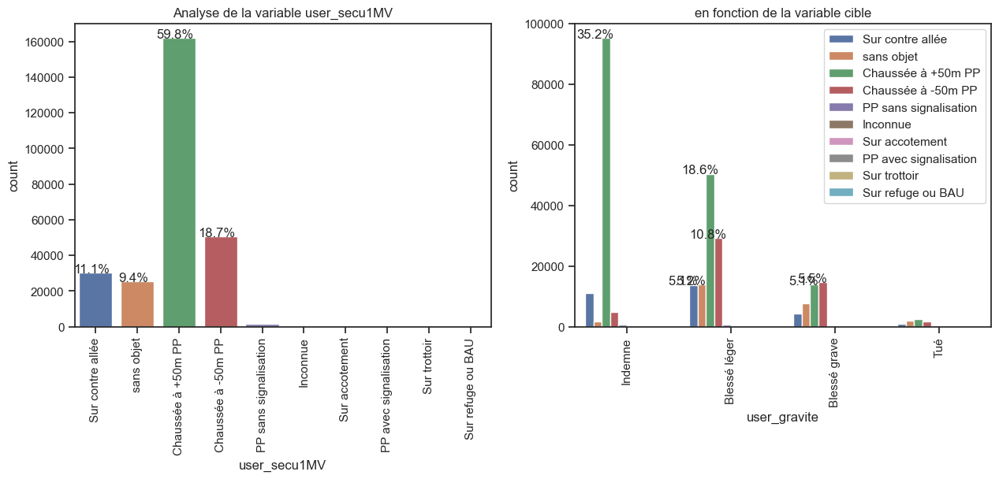

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_secu1MV                                        
0             0.069854  0.546870  0.306283  0.076992
1             0.588397  0.311118  0.085393  0.015092
2             0.095537  0.577912  0.290967  0.035585
3             0.479154  0.424773  0.079154  0.016918
4             0.179191  0.329480  0.358382  0.132948
5             0.316667  0.233333  0.333333  0.116667
6             0.066986  0.263158  0.588517  0.081340
7             0.100000  0.300000  0.600000  0.000000
8             0.368535  0.457317  0.144554  0.029594
9             0.349593  0.260163  0.329268  0.060976


Meilleurs résultats obtenu avec taux= 3.0
Liste des modalités retenues en modalité de regroupement 1 : [0, 2, 4, 5, 6, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.44082



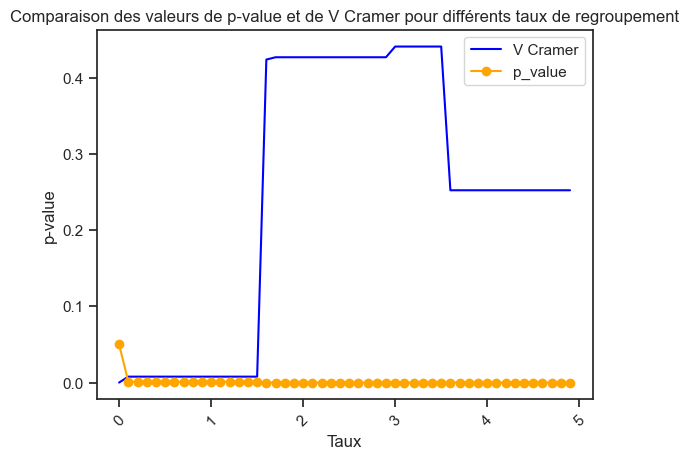

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.46811



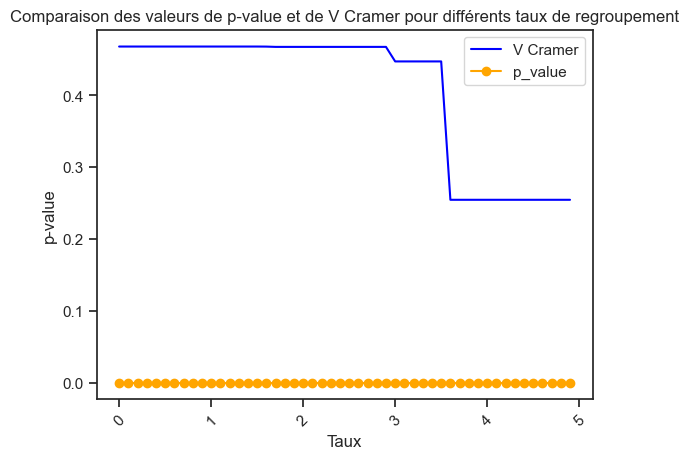


Optimisation Corrélation variable 'user_secu1MV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [703]:
# 'USER_SECU1' - Remplacement des missing values par la modalité la plus représentée
#train['user_secu1MV'] = train.user_secu1.fillna(train.user_secu1.mode()[0])                      # valeur NaN si existante
#train['user_secu1MV'] = train.user_secu1.replace(-1, train.user_secu1.mode()[0]).astype(int)     # valeur -1 si existante
#new_rgmt = analyse_variable_categorielle(train, 'user_secu1MV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  

# ==> Cramer = 0.47449

# SOLUTION 2 - on privilégie la modalité la plus représentée en tenant compte de la catégorie des véhicules
modalites = train.groupby('agg_catv_perso')['user_secu1'].agg(lambda x: x.mode().iloc[0])
train['user_secu1MV'] = train.apply(lambda row: modalites[row['agg_catv_perso']] if row['user_secu1'] == -1 else row['user_secu1'], axis=1)
new_rgmt = analyse_variable_categorielle(train, 'user_secu1MV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  

# ==> Cramer = 0.46811

<u>CONCLUSION <span style="color:red">__'USER_SECU1'__</span> :</u>
1. 1% de missing values (3946).
   - Le remplacement via la modalité la plus fréquente impacte légèrement le test de Cramer (0.47449)
   - Le remplacement via la modalité la plus f. en tenant compte de la catégorie de véhicule impacte encore plus le test de Cramer (0.46811)
     
3. 10 modalités : 3 modalités représentent + de 87% 
5. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
6. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.48324)
   - après missing Values via modalité la plus fréquente : Cramer=0.47449
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.54021
7. Regroupement (binaire) des catégories entre elles : aucune amélioration
8. Regroupement (non binaire) : aucune amélioration

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1'__

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_SECU1'__</span> :</u>
  
  __==> LA VARIABLE POURRA ETRE CONSERVEE EN L'ETAT__

###


<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_SECU2'__ : </span></u>



Le renseignement indique la présence et l'utilisation de l'équipement :
-1: Non renseigné
0: Aucun équipement
1: Ceinture
2: Casque
3: Dispositif enfants
4: Gilet réfléchissant
5: Airbag (2RM/3RM)
6: Gants (2RM/3RM)
7: Gants + Airbag (2RM/3RM)
8: Non déterminable
9: Autre 



Il y a 45.0% (206067) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_secu2
-1    0.451897
 0    0.311004
 6    0.084528
 8    0.057103
 4    0.020305
 5    0.020263
 1    0.015824
 2    0.014943
 3    0.014803
 7    0.007474
 9    0.001857
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.39254

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
user_secu2                              
-1            45401  40693  57091  62882
 0            51090  43447  22601  24681
 1              280    396   2858   3682
 2               47    402   2877   3488
 3              183    318   2845   3404
 4             1601   1314   2850   3494
 5             1031   1615   3177   3417
 6             2218  14529  15188   6610
 7               52    316   1521   1519
 8            11907  10683   2679    770
 9              191    288    314     54

TENTATIVE 

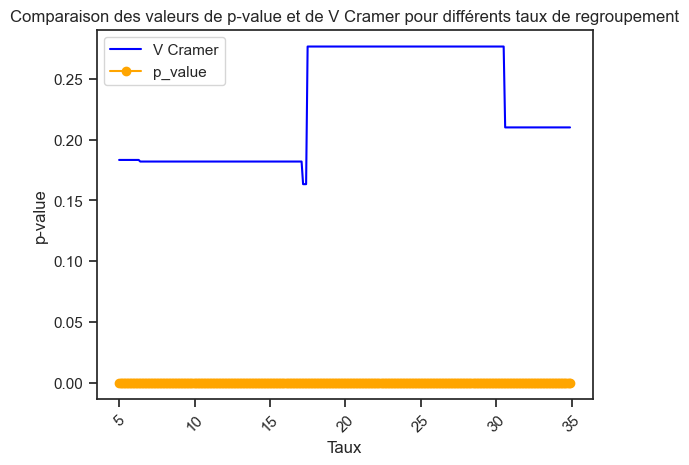

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 6.299999999999995
Liste des modalités regroupées dans la nouvelle catégorie 10 : [8]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.39254



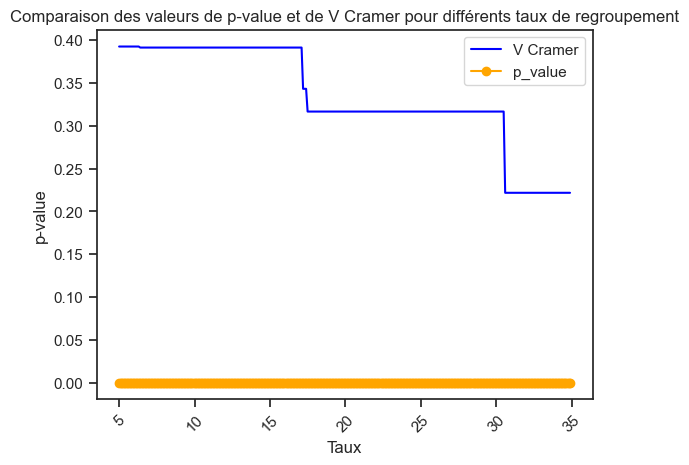


Optimisation Corrélation variable 'user_secu2':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [819]:
# 'user_secu2'
new_rgmt = analyse_variable_categorielle(train, 'user_secu2', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 4.0% (11489) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_secu2MV
 0    0.744578
 8    0.091594
 6    0.091180
-1    0.042439
 5    0.010853
 4    0.010572
 9    0.003047
 1    0.002009
 2    0.001333
 3    0.001204
 7    0.001189
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.28538

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2     3
user_secu2MV                           
-1             1752   5020   3971   746
 0            94739  75346  26394  5091
 1              280    178     71    15
 2               47    185    113    16
 3              183     96     43     4
 4             1601   1108    142    11
 5             1031   1411    440    56
 6             2218  13991   7559   916
 7               52    163     96    11
 8            11907  10555   2056   278
 9              191    286    297    51



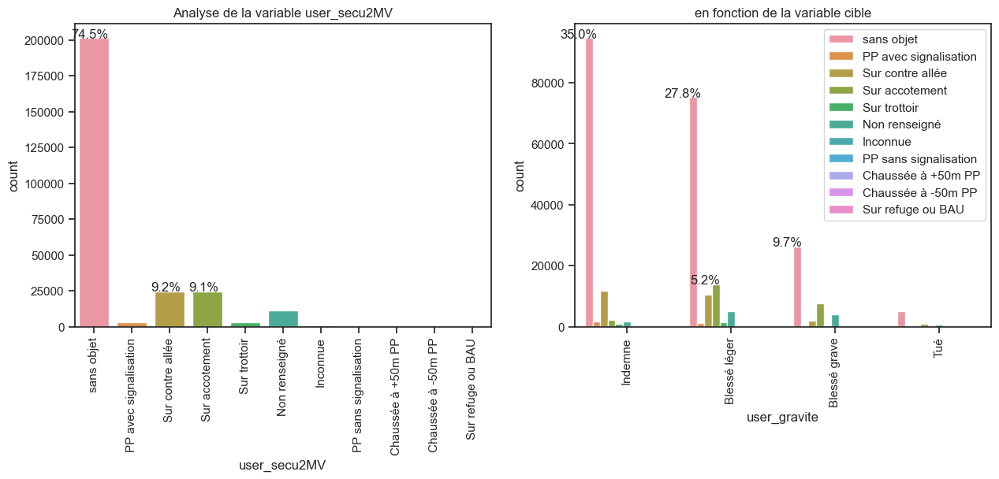

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_secu2MV                                        
-1            0.152494  0.436940  0.345635  0.064932
 0            0.470005  0.373796  0.130942  0.025257
 1            0.514706  0.327206  0.130515  0.027574
 2            0.130194  0.512465  0.313019  0.044321
 3            0.561350  0.294479  0.131902  0.012270
 4            0.559399  0.387142  0.049616  0.003843
 5            0.350919  0.480259  0.149762  0.019061
 6            0.089856  0.566804  0.306231  0.037109
 7            0.161491  0.506211  0.298137  0.034161
 8            0.480198  0.425673  0.082917  0.011211
 9            0.231515  0.346667  0.360000  0.061818


Meilleurs résultats obtenu avec taux= 2.8000000000000003
Liste des modalités retenues en modalité de regroupement 1 : [-1, 2, 6, 7, 9]
Test Statistique du chi2 : p-value=0.000  ; V de 

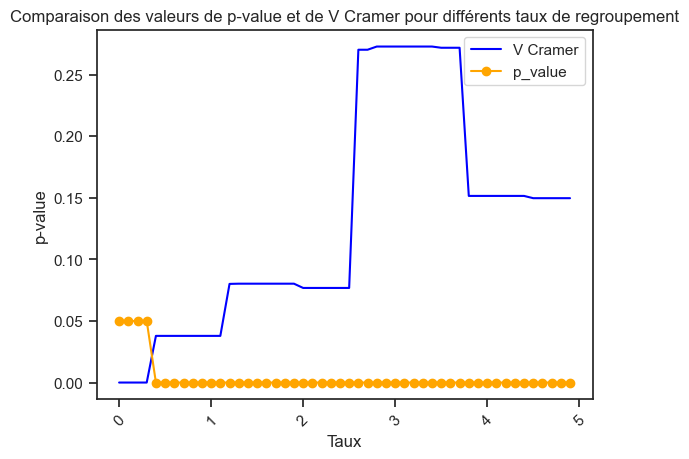

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.28538



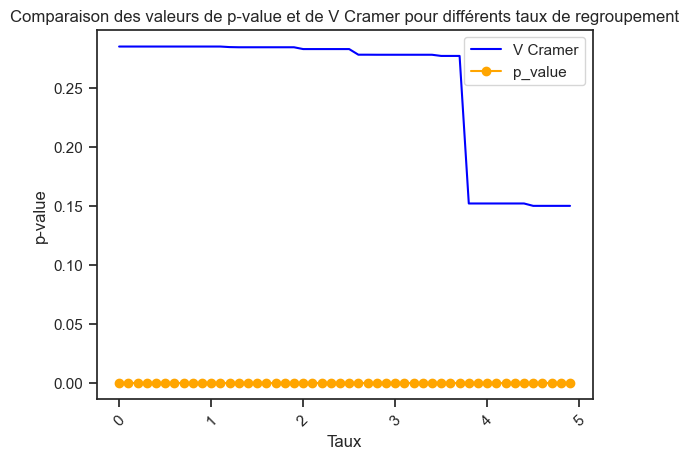


Optimisation Corrélation variable 'user_secu2MV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [731]:
# 'USER_SECU2' - Remplacement des missing values par la modalité la plus représentée
#train['user_secu2MV'] = train.user_secu2.replace(-1, train.user_secu2.value_counts().index[1]).astype(int)     # valeur -1 si existante
#new_rgmt = analyse_variable_categorielle(train, 'user_secu2MV', valna=-1, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  

# ==> Cramer = 0.23851

# SOLUTION 2 - on privilégie la modalité la plus représentée en tenant compte de la catégorie des véhicules
modalites = train.groupby('agg_catv_perso')['user_secu2'].agg(lambda x: x.value_counts().index[1])
train['user_secu2MV'] = train.apply(lambda row: modalites[row['agg_catv_perso']] if row['user_secu2'] == -1 else row['user_secu2'], axis=1)
new_rgmt = analyse_variable_categorielle(train, 'user_secu2MV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  

# ==> Cramer = 0.28538

<u>CONCLUSION <span style="color:red">__'USER_SECU2'__</span> :</u>
1. 42% de missing values (114704)
   - Le remplacement par la modalité la plus fréquente impacte le test de Cramer (0.23851)
   - idem si l'on réalise le remplacement en tenant compte des catégories de véhicules (0.28538)
3. 10 modalités : 2 modalités représentent + de 84% 
4. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
5. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.329)
   - après missing Values via modalité la plus fréquente : Cramer=0.23851 - cette méthode impacte le test de Cramer 
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.39254
6. Regroupement (binaire) des catégories entre elles : aucune amélioration
7. Regroupement (non binaire) : aucune amélioration

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1'__

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_SECU2'__</span> :</u>

  __==> LA VARIABLE POURRA ETRE CONSERVEE EN L'ETAT__


###
<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_SECU3'__ : </span></u>



Le renseignement indique la présence et l'utilisation de l'équipement :
-1: Non renseigné
0: Aucun équipement
1: Ceinture
2: Casque
3: Dispositif enfants
4: Gilet réfléchissant
5: Airbag (2RM/3RM)
6: Gants (2RM/3RM)
7: Gants + Airbag (2RM/3RM)
8: Non déterminable
9: Autre 



Il y a 97.0% (442728) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_secu3
-1    0.970886
 0    0.008658
 9    0.005373
 1    0.002011
 8    0.001923
 6    0.001906
 4    0.001903
 2    0.001899
 3    0.001897
 5    0.001875
 7    0.001669
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.15636

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0       1       2       3
user_secu3                                  
-1            113574  113065  108407  107682
 0               202     227    1245    2274
 1                25      33     344     515
 2                 1      10     352     503
 3                 1      11     357     496
 4                 5      11     351     501
 5                 7      19     355     474
 6                 7      46     393     423
 7                 0      10     345     406
 8                81      22     358     416
 9  

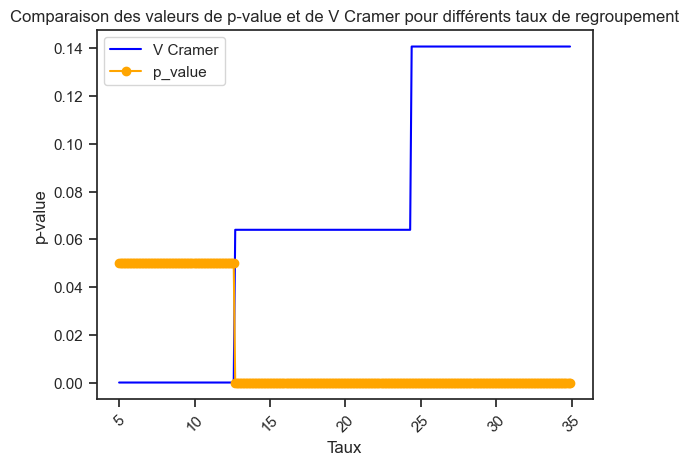

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 24.299999999999933
Liste des modalités regroupées dans la nouvelle catégorie 10 : [9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.15636



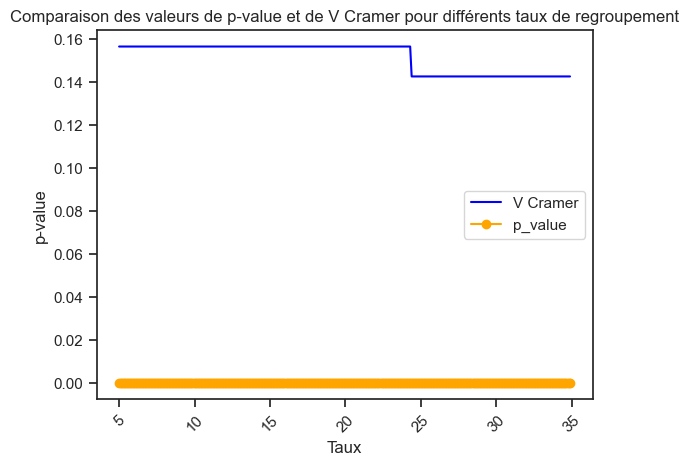


Optimisation Corrélation variable 'user_secu3':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [820]:
# 'user_secu3'
new_rgmt = analyse_variable_categorielle(train, 'user_secu3', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 10 modalités.

user_secu3MV
9    0.996506
0    0.001998
6    0.000513
8    0.000443
1    0.000229
4    0.000137
5    0.000100
2    0.000033
7    0.000030
3    0.000011
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.03887

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0       1      2     3
user_secu3MV                             
0                202     196    102    41
1                 25      27      7     3
2                  1       3      5     0
3                  1       1      0     1
4                  5       9     20     3
5                  7      14      6     0
6                  7      42     76    14
7                  0       5      2     1
8                 81      16     17     6
9             113672  108026  40947  7126



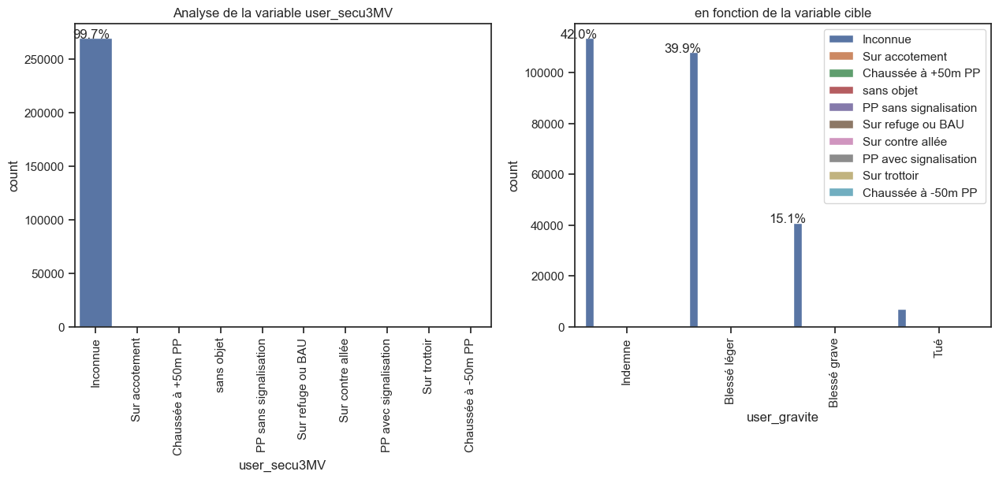

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite         0         1         2         3
user_secu3MV                                        
0             0.373383  0.362292  0.188540  0.075786
1             0.403226  0.435484  0.112903  0.048387
2             0.111111  0.333333  0.555556  0.000000
3             0.333333  0.333333  0.000000  0.333333
4             0.135135  0.243243  0.540541  0.081081
5             0.259259  0.518519  0.222222  0.000000
6             0.050360  0.302158  0.546763  0.100719
7             0.000000  0.625000  0.250000  0.125000
8             0.675000  0.133333  0.141667  0.050000
9             0.421365  0.400436  0.151784  0.026415


Meilleurs résultats obtenu avec taux= 4.9
Liste des modalités retenues en modalité de regroupement 1 : [0, 3, 4, 6, 7, 8]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.02502



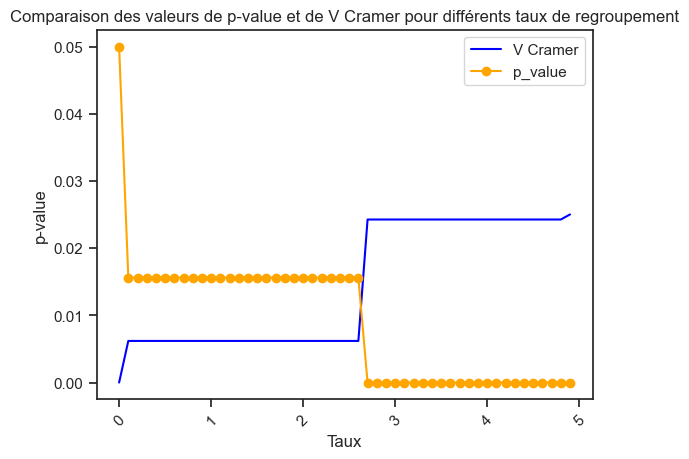

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.03887



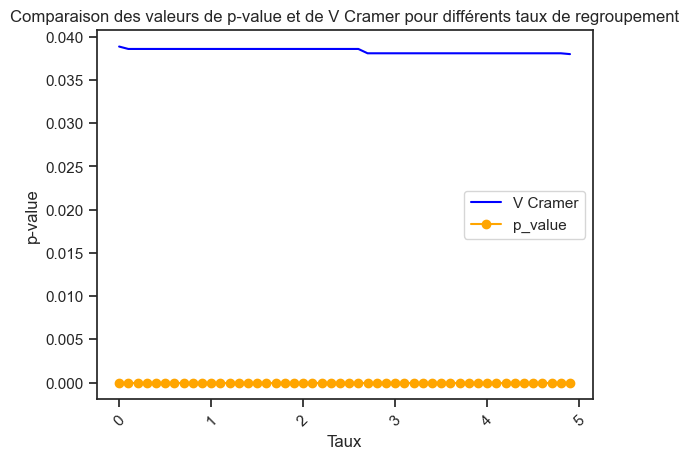


Optimisation Corrélation variable 'user_secu3MV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [734]:
# 'USER_SECU3' - Remplacement des missing values par la modalité la plus représentée
#train['user_secu3MV'] = train.user_secu3.replace(-1, train.user_secu3.value_counts().index[1]).astype(int)     # valeur -1 si existante
#new_rgmt = analyse_variable_categorielle(train, 'user_secu3MV', valna=-1, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  

# ==> Cramer = 0.038

# SOLUTION 2 - on privilégie la modalité la plus représentée en tenant compte de la catégorie des véhicules
modalites = train.groupby('agg_catv_perso')['user_secu3'].agg(lambda x: x.value_counts().index[1])
train['user_secu2MV'] = train.apply(lambda row: modalites[row['agg_catv_perso']] if row['user_secu3'] == -1 else row['user_secu3'], axis=1)
new_rgmt = analyse_variable_categorielle(train, 'user_secu3MV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  

# ==> Cramer = 0.038

<u>CONCLUSION <span style="color:red">__'USER_SECU3'__</span> :</u>
1. 99% de missing values (267797) : même constat pour les remplacements des missing value ==> maintien de la catégorie '-1'
2. 10 modalités : 1 modalité représente 99% 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.120)
   - après missing Values via modalité la plus fréquente : Cramer=
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.03887
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1'__

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_SECU3'__</span> :</u>

  __==> LA VARIABLE POURRA ETRE CONSERVEE EN L'ETAT (si l'on ne regarde que le test sans SMOTE__

__<span style="color:red">==> LA VARIABLE SERA ECARTEE DU SCOPE DES VARIABLES EXPLICATIVES (si l'on retient le test SMOTE)__</span>

###

<u>ANALYSE DETAILLEE DE <span style="color:red">__'USER_TRAJET'__ : </span></u>



Le renseignement indique la présence et l'utilisation de l'équipement :

Type de trajet :
-1: Non renseigné
0: Non renseigné
1: Domicile – travail
2: Domicile – école
3: Courses – achats
4: Utilisation professionnelle
5: Promenade – loisirs
9: Autre 



Il y a 18.0% (84133) de données manquantes (ou assimilées).
Il y a 11 modalités.

user_trajet
 5    0.335738
-1    0.184501
 1    0.123216
 4    0.107905
 3    0.064791
 0    0.054456
 9    0.054267
 2    0.045956
 6    0.009741
 8    0.009728
 7    0.009702
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.43924

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite      0      1      2      3
user_trajet                             
-1            32110  31668  14088   6267
 0                0    892  10522  13418
 1            14856  16342  13142  11847
 2             1711   3560   7031   8654
 3             4036   3527   9539  12443
 4            16082   7902  10477  14744
 5            35898  38974  41262  36964
 6                0    126   1510   2806
 7                0    149   1488   2787
 8                0    161   1501   2774
 9             9308  10700   3441   1297

TENTATIVE 

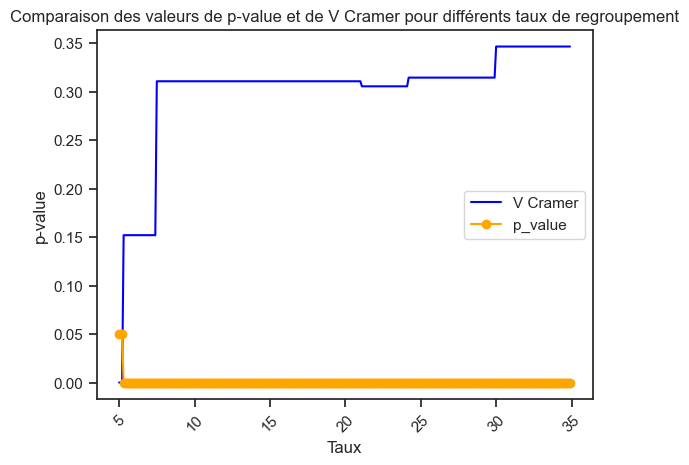

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 7.3999999999999915
Liste des modalités regroupées dans la nouvelle catégorie 10 : [9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.43924



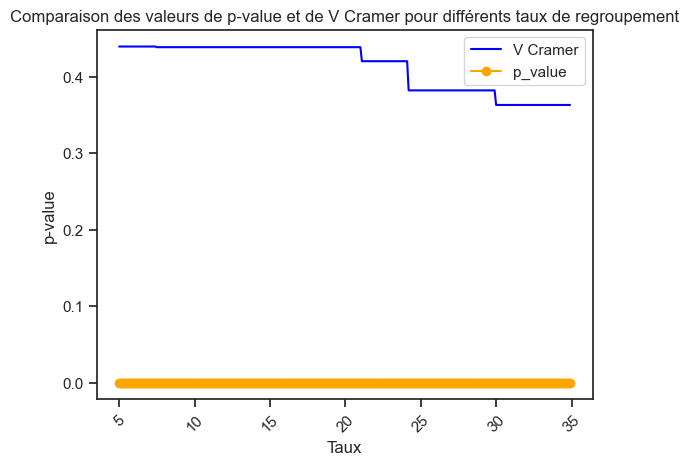


Optimisation Corrélation variable 'user_trajet':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [821]:
# 'user_trajet'
new_rgmt = analyse_variable_categorielle(train, 'user_trajet', valna=-1, liste_taux=liste_taux, viewPercent=5.0, rotation_xlabel=90)  



Il y a 0.0% (0) de données manquantes (ou assimilées).
Il y a 6 modalités.

user_trajetMV
5    0.631848
1    0.133671
4    0.092813
9    0.085621
3    0.034796
2    0.021251
Name: proportion, dtype: float64

Test Statistique du chi2 (sans regroupement) : p-value=0.000 ; V de Cramer=0.16563

Tableau de contingence entre la variable et la variable cible (pour chi2): 


user_gravite       0      1      2     3
user_trajetMV                           
1              14856  15626   4960   745
2               1711   3083    901    58
3               4036   3046   1934   404
4              16082   7217   1525   302
5              68008  68810  29105  5129
9               9308  10557   2757   557



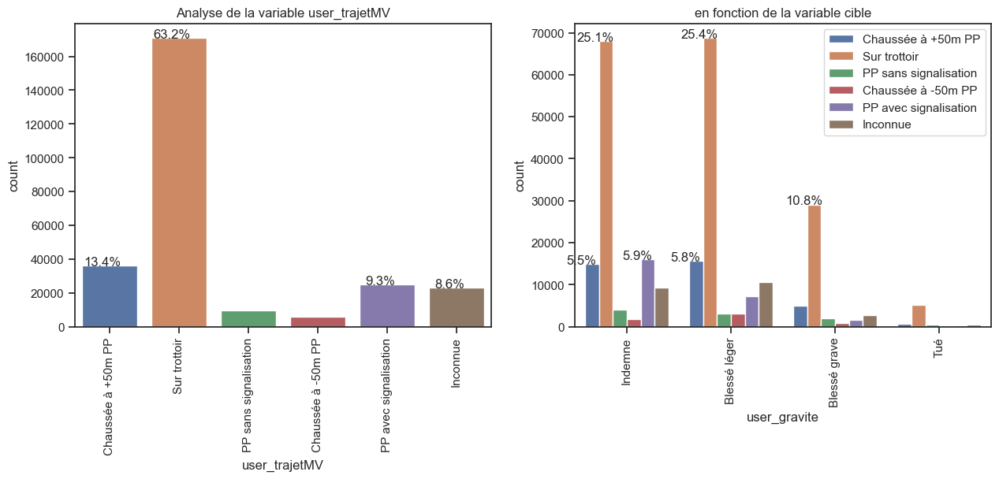

TENTATIVE OPTIMISATION PAR REGROUPEMENT BINAIRE
Tableau de contingence normalisé entre la variable et la variable cible : 


user_gravite          0         1         2         3
user_trajetMV                                        
1              0.410534  0.431813  0.137066  0.020588
2              0.297410  0.535894  0.156614  0.010082
3              0.428450  0.323355  0.205308  0.042887
4              0.640054  0.287232  0.060694  0.012019
5              0.397587  0.402275  0.170153  0.029985
9              0.401570  0.455455  0.118944  0.024030


Meilleurs résultats obtenu avec taux= 1.3
Liste des modalités retenues en modalité de regroupement 1 : [1, 3, 5, 9]
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.12017



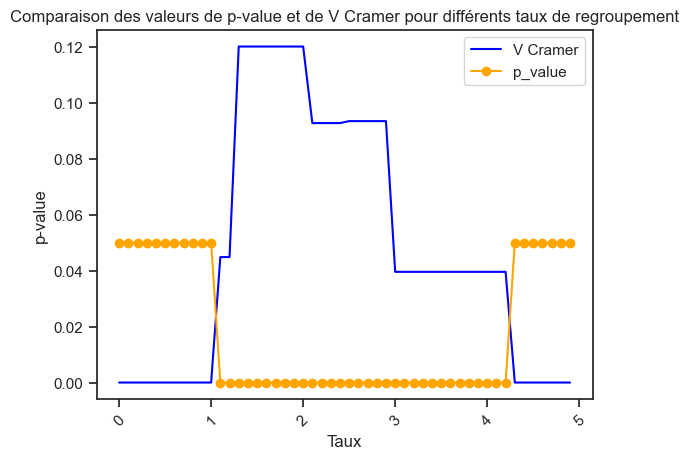

TENTATIVE OPTIMISATION PAR REGROUPEMENT NON BINAIRE

REGROUPEMENT NON BINAIRE : new_modalite= 10
Meilleurs résultats obtenu avec taux= 0.0
Liste des modalités regroupées dans la nouvelle catégorie 10 : []
Test Statistique du chi2 : p-value=0.000  ; V de Cramer=0.16563



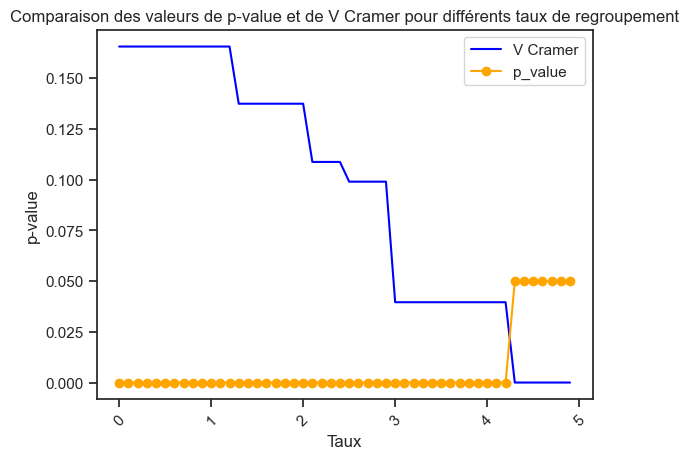


Optimisation Corrélation variable 'user_trajetMV':
 ==>> AUCUNE OPTIMISATION IDENTIFIEE PAR TRANSFORMATION DU REGROUPEMENT DE LA VARIBLE.


In [736]:
# 'USER_TRAJET' - Remplacement des missing values
train['user_trajetMV'] = train.user_trajet.fillna(train.user_trajet.mode()[0])                      # valeur NaN si existante
train['user_trajetMV'] = train.user_trajet.replace(-1, train.user_trajet.mode()[0]).astype(int)     # valeur -1 si existante
new_rgmt = analyse_variable_categorielle(train, 'user_trajetMV', valna=-1, liste_taux=liste_taux, code_to_huelabel=code_to_huelabel, viewPercent=5.0, rotation_xlabel=90)  


<u>CONCLUSION <span style="color:red">__'USER_TRAJET'__</span> :</u>
1. 27% de missing values (73665)
2. 6 modalités : 4 modalités représentent + de 80% (dont missing values) 
3. Le test statistique du chi2 donne une p-value proche de 0%  ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)
4. Le test de Cramer (+ Chi2) :
   - df initial : Il semble indiquer que cette corrélation semble assez faible malgré tout (Cramer=0.19506)
   - après missing Values via modalité la plus fréquente : Cramer=0.16563 - Cette méthode impacte légèrement le test de Cramer
   - après Rééquilibrage des classes via SMOTE : V Cramer=0.43924
5. Regroupement (binaire) des catégories entre elles : aucune amélioration
6. Regroupement (non binaire) : aucune amélioration

  __==> MAINTIEN DES MISSING VALUES DANS LA CATEGORISATION '-1'__

###

<u>TRANSFORMATIONS A PREVOIR <span style="color:red">__'USER_TRAJET'__</span> :</u>

  __==> LA VARIABLE POURRA ETRE CONSERVEE EN L'ETAT__


###


### EXPLORATION DES DONNEES
__<u> <span style="color:blue">ETAPE 3.4 - VARIABLES QUANTITATIVES</span></u>__ 

<u>ANALYSE DETAILLEE DE <span style="color:red">__'LIEU_LARROUT'__ : </span></u>

Largeur de la chaussée affectée à la circulation

<u>CONCLUSION <span style="color:red">__'LIEU_LARROUT'__</span> :</u>
1. Plus de 93% de valeurs manquantes
2. Aucune transformation à prévoir (pas de missing value et variable binaire)
3. Le test statistique du chi2 donne une p-value proche de 0% ==> hypothèse nulle est rejetée (les variables semblent dépendantes statistiquement)

  __==> LA VARIABLE <span style="color:red">'LIEU_LARROUT'</span> POURRA ETRE CONSERVEE EN L'ETAT COMME VARIABLES EXPLICATIVES__


Il y a 93.89999999999999% de données manquantes (ou assimilées).

Statistiques de la variable (hors valeur nan): 

count    16561.000000
mean         5.906721
std          3.350324
min          0.000000
25%          4.000000
50%          5.000000
75%          7.000000
max         24.000000
Name: lieu_larrout, dtype: float64

Outliers=
-> Q1= 4.0 - Q3= 7.0 - IQR= 3.0 - Borne inf= -0.5 - Borne sup= 11.5
-> Outlier(s) inférieur(s) - min= nan - max= nan - nb= 0
[]
-> Outlier(s) supérieur(s) - min= 11.6 - max= 24.0 Outliers nb= 1489
[11.6 11.6 11.6 ... 24.  24.  24. ]
Test staistique ANOVA - PR(>F)= 7.811650470981064e-70



,df,sum_sq,mean_sq,F,PR(>F)
lieu_larrout,1.0,197.402014,197.402014,312.230071,7.811650e-70
Residual,270715.0,171154.834566,0.632233,NaN,NaN


Outliers=
-> Q1= 4.0 - Q3= 7.0 - IQR= 3.0 - Borne inf= -0.5 - Borne sup= 11.5
-> Outlier(s) inférieur(s) - min= nan - max= nan - nb= 0
[]
-> Outlier(s) supérieur(s) - min= 11.6 - max= 24.0 Outliers nb= 1489
[11.6 11.6 11.6 ... 24.  24.  24. ]


lieu_larrout
-1.00     254156
 4.00       4914
 5.00       2225
 7.00       1913
 3.00       1540
 5.50       1166
 10.50       510
 14.00       488
 10.00       464
 0.00        448
 6.00        444
 13.50       421
 3.50        379
 12.00       254
 9.00        222
 17.50       115
 8.00         70
 6.50         53
 15.00        53
 18.00        49
 4.50         41
 5.40         39
 7.30         38
 5.80         35
 5.60         30
 7.50         29
 5.30         24
 6.20         22
 6.80         22
 6.30         20
 7.60         20
 21.00        20
 10.30        18
 13.00        18
 6.70         17
 5.20         16
 6.40         15
 3.80         15
 24.00        14
 4.80         14
 11.00        14
 8.50         14
 6.60         13
 5.70         13
 7.20         12
 4.40         12
 14.50        11
 3.60         11
 7.80         11
 17.00        11
 11.50        10
 2.50         10
 4.90         10
 4.20         10
 20.00         8
 7.70          8
 6.10          7
 4.30          7
 

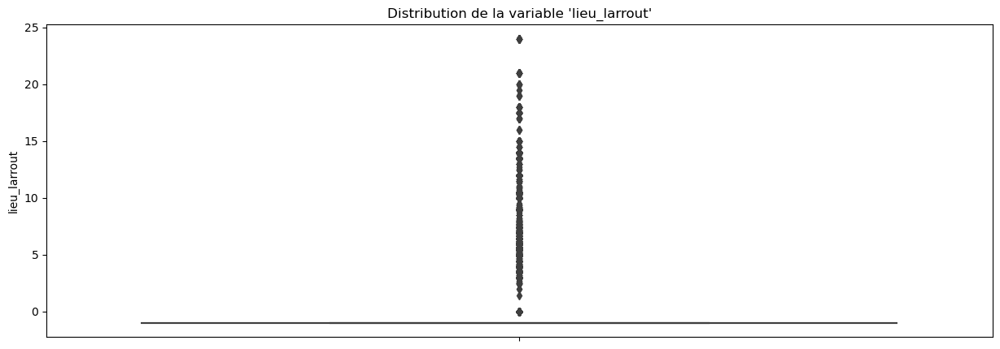

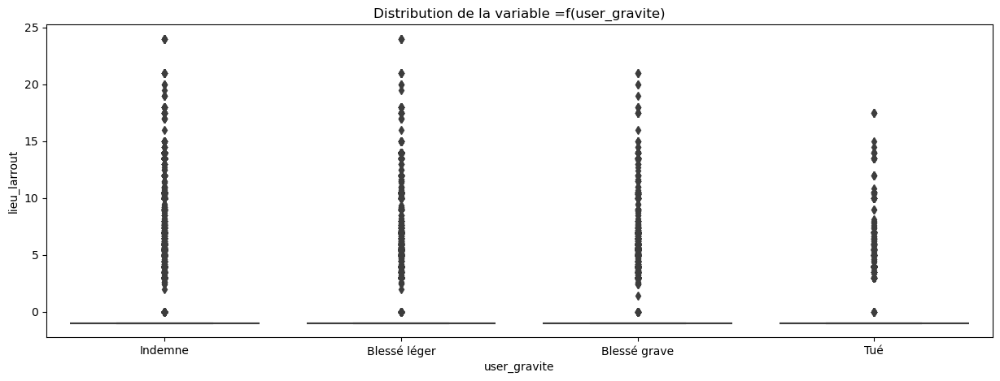

In [191]:
# Test sur variable lieu_larrout
#code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué', '-1' : 'Non définie'}
analyse_variable_quantitative(train, x='lieu_larrout', cible='user_gravite', valna=-1, code_to_xlabel=code_to_xlabel)

# Répartition des valeurs
display(train.lieu_larrout.value_counts())        # 255000 valeurs considérées comme manquante

In [13]:
# ETAPE 2 - Exploration des données - Missing Values
# Variable 'atm' - condition atmosphériques : donnée catégorielle non ordonnée (éligible à dichotomisation)
NaN_value = df.atm.value_counts().index[0]
df['atm'] = df.atm.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'col' - type de collision : donnée catégorielle non ordonnée (éligible à dichotomisation)
NaN_value = df.col.value_counts().index[0]
df['col'] = df.col.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'int' - type d'intersection : donnée catégorielle non ordonnée (éligible à dichotomisation)
NaN_value = df.int.value_counts().index[0]
df['int'] = df.int.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_nbv' - nombre de voie : donnée quantitative
NaN_value = df.lieu_nbv.value_counts().index[0]
df['lieu_nbv'] = df.lieu_nbv.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_vosp' - voie réservée - donnée catégorielle non ordonnée (éligible à dichotomisation)
NaN_value = df.lieu_vosp.value_counts().index[0]
df['lieu_vosp'] = df.lieu_vosp.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_prof' - type de trajet - donnée catégorielle non ordonnée (éligible à dichotomisation)
NaN_value = df.lieu_prof.value_counts().index[0]
df['lieu_prof'] = df.lieu_prof.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_plan' - tracé en plan - donnée catégorielle non ordonnée (éligible à dichotomisation)
NaN_value = df.lieu_plan.value_counts().index[0]
df['lieu_plan'] = df.lieu_plan.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_surf'
NaN_value = df.lieu_surf.value_counts().index[0]
df['lieu_surf'] = df.lieu_surf.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_infra'
NaN_value = df.lieu_infra.value_counts().index[0]
df['lieu_infra'] = df.lieu_infra.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_prof'
NaN_value = df.lieu_prof.value_counts().index[0]
df['lieu_prof'] = df.lieu_prof.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'lieu_vma'
NaN_value = df.lieu_vma.value_counts().index[0]
df['lieu_vma'] = df.lieu_vma.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_catv'
NaN_value = df.vehi_catv.value_counts().index[0]
df['vehi_catv'] = df.vehi_catv.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_obs'
NaN_value = df.vehi_obs.value_counts().index[0]
df['vehi_obs'] = df.vehi_obs.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_obsm'
NaN_value = df.vehi_obsm.value_counts().index[0]
df['vehi_obsm'] = df.vehi_obsm.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_choc'
NaN_value = df.vehi_choc.value_counts().index[0]
df['vehi_choc'] = df.vehi_choc.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_manv'
NaN_value = df.vehi_manv.value_counts().index[0]
df['vehi_manv'] = df.vehi_manv.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_motor'
NaN_value = df.vehi_motor.value_counts().index[0]
df['vehi_motor'] = df.vehi_motor.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_obs'
NaN_value = df.vehi_obs.value_counts().index[0]
df['vehi_obs'] = df.vehi_obs.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'vehi_obs'
NaN_value = df.vehi_obs.value_counts().index[0]
df['vehi_obs'] = df.vehi_obs.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_place'
NaN_value = df.user_place.value_counts().index[0]
df['user_place'] = df.user_place.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_sexe'
NaN_value = df.user_sexe.value_counts().index[0]
df['user_sexe'] = df.user_sexe.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_trajet'
NaN_value = df.user_trajet.value_counts().index[0]
df['user_trajet'] = df.user_trajet.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_secu1'
NaN_value = df.user_secu1.value_counts().index[0]
df['user_secu1'] = df.user_secu1.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_secu2'       --> à analyser de plus près vu le nombre de valeur manquantes
NaN_value = df.user_secu2.value_counts().index[0]
df['user_secu2'] = df.user_secu2.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_secu3'       --> à analyser de plus près vu le nombre de valeur manquantes
NaN_value = df.user_secu3.value_counts().index[0]
df['user_secu3'] = df.user_secu3.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_locp'
NaN_value = df.user_locp.value_counts().index[0]
df['user_locp'] = df.user_locp.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_etatp'
NaN_value = df.user_etatp.value_counts().index[0]
df['user_etatp'] = df.user_etatp.apply(lambda valeur :  NaN_value if valeur == -1 else valeur)

# Variable 'user_actp' de type alpha numérique : remplacement des NaN et dichotomisation de la variable
NaN_value = df.user_actp.value_counts().index[0]
df['user_actp'] = df.user_actp.apply(lambda valeur :  NaN_value if valeur == '-1' else valeur)

# Dichotomisation de 'actp'
features = pd.get_dummies(df)


In [14]:
# Focus sur accidents survenus en Métropole (ciblage sur les coordonnées GPS)
df_metropole = df[(df.gps_long >= -5) & (df.gps_long <= 10) & (df.gps_lat >= 41) & (df.gps_lat <= 51)]

# Focus sur accidents survenus hors Métropole (ciblage sur les coordonnées GPS)
df_dom = df[~((df.gps_long >= -5) & (df.gps_long <= 10) & (df.gps_lat >= 41) & (df.gps_lat <= 51))]


#### ANALYSE DE DONNEES AVEC LA DATAVISUALISATION

#### BOXPLOT SUR VARIABLES EXPLICATIVES (QUANTITATIVES)

Outliers METROPOLE=
-> Q1= 64.0 - Q3= 280.0 - IQR= 216.0 - Borne inf= -260.0 - Borne sup= 604.0
-> Outlier(s) inférieur(s) - min= nan - max= nan - nb= 0
[]
-> Outlier(s) supérieur(s) - min= 605.0 - max= 908.0 Outliers nb= 14523
[605. 605. 605. ... 908. 908. 908.]
Outliers DOM=
-> Q1= 209.0 - Q3= 416.0 - IQR= 207.0 - Borne inf= -101.5 - Borne sup= 726.5
-> Outlier(s) inférieur(s) - min= nan - max= nan - nb= 0
[]
-> Outlier(s) supérieur(s) - min= 729.0 - max= 833.0 Outliers nb= 4288
[729. 729. 729. ... 833. 833. 833.]


,id_accident,id_vehicule,num_veh,id_usager,agg,an,atm,col,com,dept,...,agg_nb_total_vl,agg_nb_total_pl,agg_nb_total_va,agg_nb_total_conducteurs,agg_nb_total_conductrices,agg_nb_total_pietons,agg_nb_total_passagers,agg_nb_total_indemnes,agg_nb_total_blesses,agg_nb_total_tues
97,201800000047,0,A01,NaN,2,2018,7,6,660.0,59,...,1,0,0,0,1,1,0,1,0,1
98,201800000047,0,A01,NaN,2,2018,7,6,660.0,59,...,1,0,0,0,1,1,0,1,0,1
122,201800000059,0,A01,NaN,1,2018,1,3,611.0,59,...,2,0,0,2,0,0,0,1,1,0
123,201800000059,0,B01,NaN,1,2018,1,3,611.0,59,...,2,0,0,2,0,0,0,1,1,0
130,201800000062,0,A01,NaN,2,2018,2,6,610.0,59,...,1,0,0,1,0,0,1,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587950,202200055199,715798,A01,968 456,2,2022,7,2,701.0,27,...,2,0,0,1,1,0,0,0,2,0
588031,202200055238,715726,A01,968 364,2,2022,5,6,637.0,21,...,0,0,0,1,0,0,0,0,1,0
588103,202200055280,715661,B01,968 276,1,2022,1,3,617.0,91,...,2,0,0,1,1,0,1,2,1,0
588104,202200055280,715661,B01,968 277,1,2022,1,3,617.0,91,...,2,0,0,1,1,0,1,2,1,0


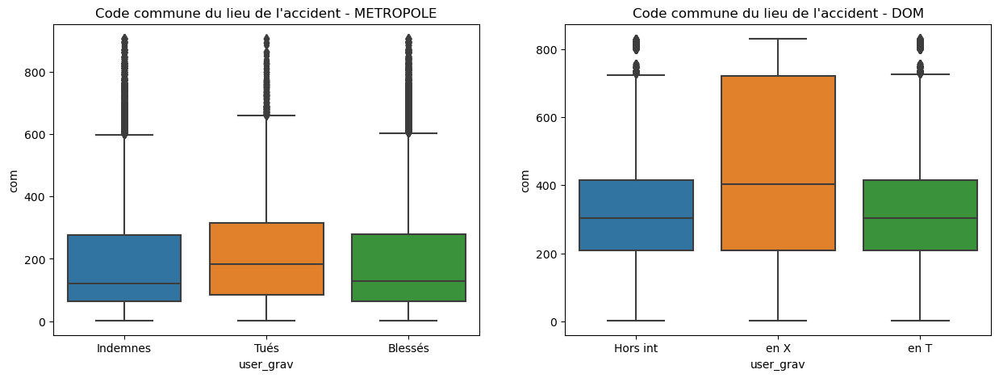

In [232]:
# BOXPLOT Variable 'com' : code commune
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
figs, axs = monboxplot(df_metropole, df_dom, x='user_gravite', y='com', title="Code commune du lieu de l'accident", 
                       code_to_xlabel=code_to_xlabel, viewOutliers=True)

# Ctrl code commune
df_metropole[(df_metropole.com>600)]         # Il s'agit bien de communes de France --> préprocessing de 'com' à vérifier !!!



Outliers METROPOLE=
-> Q1= 34.0 - Q3= 87.0 - IQR= 53.0 - Borne inf= -45.5 - Borne sup= 166.5
-> Outlier(s) supérieur(s) - min= 201 - max= 988 Outliers nb= 37959
Outliers DOM=
-> Q1= 33.0 - Q3= 81.0 - IQR= 48.0 - Borne inf= -39.0 - Borne sup= 153.0
-> Outlier(s) supérieur(s) - min= 201 - max= 986 Outliers nb= 6472


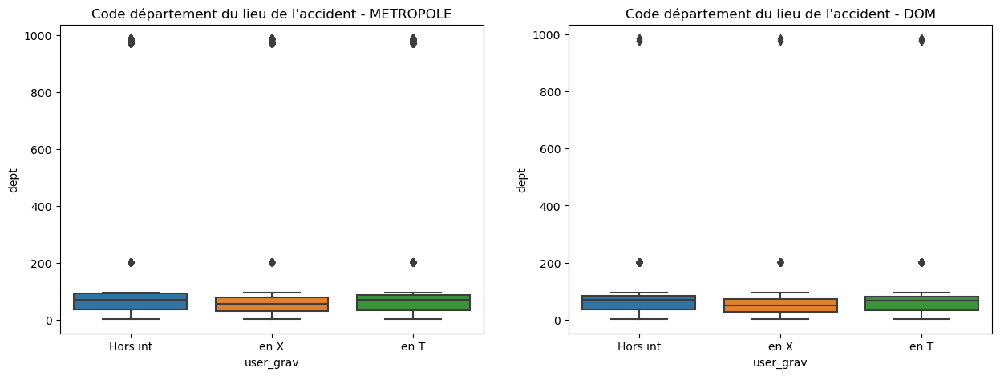

In [203]:
# BOXPLOT Variable 'dept' : code commune
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axs = monboxplot(df, df_metropole, x='user_gravite', y='dept', title="Code département du lieu de l'accident", 
                      code_to_xlabel=code_to_label, viewOutliers=False)

# Ctrl code commune
#df_metropole[(df_metropole.dept>203)]         # Il s'agit bien de lieux en métropole --> préprocessing de 'dept' à vérifier !!!


Outliers METROPOLE=
-> Q1= 1968.0 - Q3= 1997.0 - IQR= 29.0 - Borne inf= 1924.5 - Borne sup= 2040.5
-> Outlier(s) inférieur(s) - min= 1900.0 - max= 1924.0 - nb= 426
Outliers DOM=
-> Q1= 1971.0 - Q3= 1997.0 - IQR= 26.0 - Borne inf= 1932.0 - Borne sup= 2036.0
-> Outlier(s) inférieur(s) - min= 1900.0 - max= 1931.0 - nb= 84


(<Figure size 1500x500 with 2 Axes>,
 array([<Axes: title={'center': 'Année de naissance des usagers - METROPOLE'}, xlabel='user_grav', ylabel='user_an_nais'>,
        <Axes: title={'center': 'Année de naissance des usagers - DOM'}, xlabel='user_grav', ylabel='user_an_nais'>],
       dtype=object))

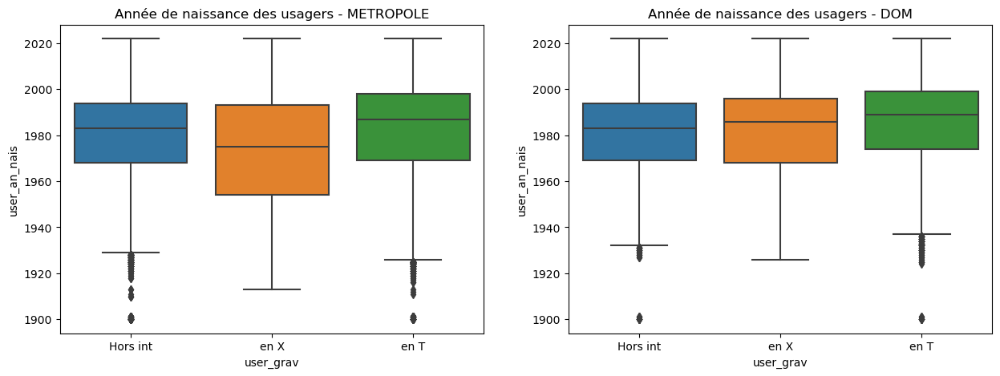

In [204]:
# BOXPLOT : Variable année de naissance : analyse des valeurs avant remplacement (outliers)
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
monboxplot(df_metropole, df_dom, x='user_gravite', y='user_an_nais', title="Année de naissance des usagers", 
           viewOutliers=False, code_to_xlabel=code_to_label)
       
# --> Les données ne semblent pas anormales 
# --> Les usagers d'un certains ages se retrouvent outlier du fait de leur faible représentation : 
# ===>>> faut-il les maintenir dans le df au risque de dégrader la qualité du modèle ?


In [ ]:
sns.swarmplot(x="user_gravite", y="user_an_nais", data = df_metropole, )

In [ ]:
# BOXPLOT : Variable 'lieu_lartpc' (outliers)
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
monboxplot(df_metropole, df_dom, x='user_gravite', y='lieu_lartpc', title="Largeur du terre plein", 
           viewOutliers=False, code_to_xlabel=code_to_xlabel)
       
# --> 3867 Outliers supérieurs à Q3 dont certains sont étranges 
# ==>>> analyse de la distribution des valeurs


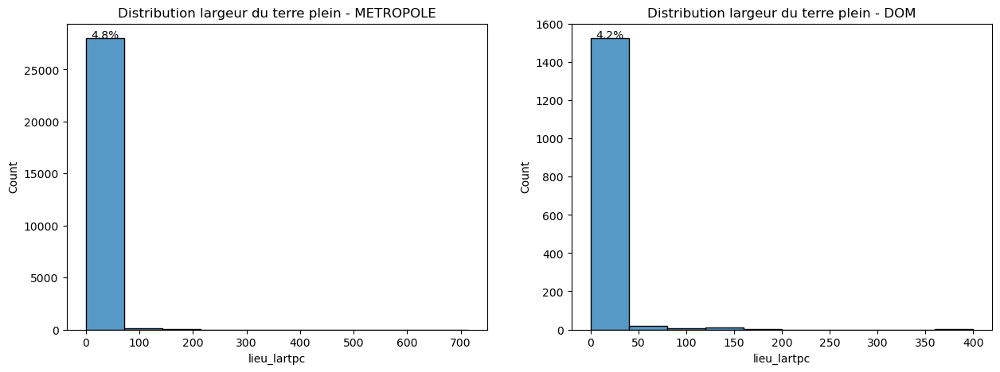

In [206]:
# Variable 'lieu_lartpc' - Analyse de sa distribution
fig, axs = monhistplot(df_metropole, df_dom, x="lieu_lartpc", title="Distribution largeur du terre plein", bins = 10, viewPercent = 4)

# ===>>> Variable fortement centrée sur 0 avec beaucoup d'outliers très éloignés : Faut-il garder ce genre de données ?


Outliers=
-> Q1= 4.0 - Q3= 7.0 - IQR= 3.0 - Borne inf= -0.5 - Borne sup= 11.5
-> Outlier(s) supérieur(s) - min= 11.6 - max= 24.0 Outliers nb= 1489


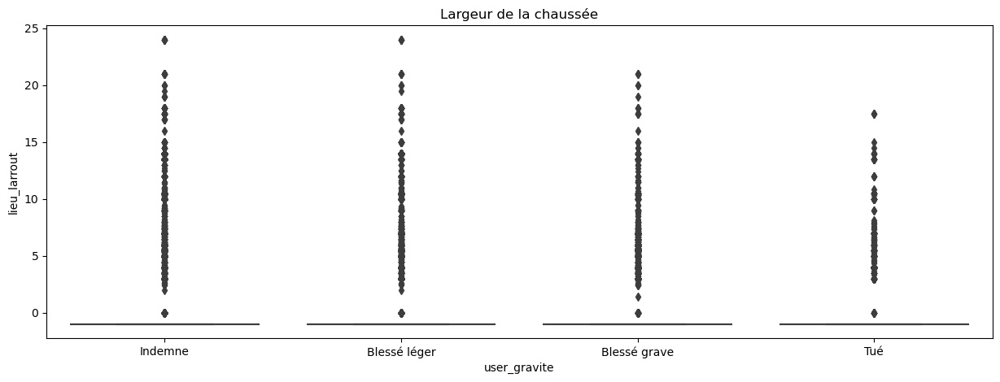

In [149]:
# BOXPLOT : Variable 'lieu_larrout' (outliers)
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axe = monboxplot(train, x='user_gravite', y='lieu_larrout', title="Largeur de la chaussée", 
                      viewOutliers=False, code_to_xlabel=code_to_xlabel)
       
# --> 3310 Outliers borne supérieurs  dont certains sont étranges 
# ==>>> analyse de la distribution des valeurs


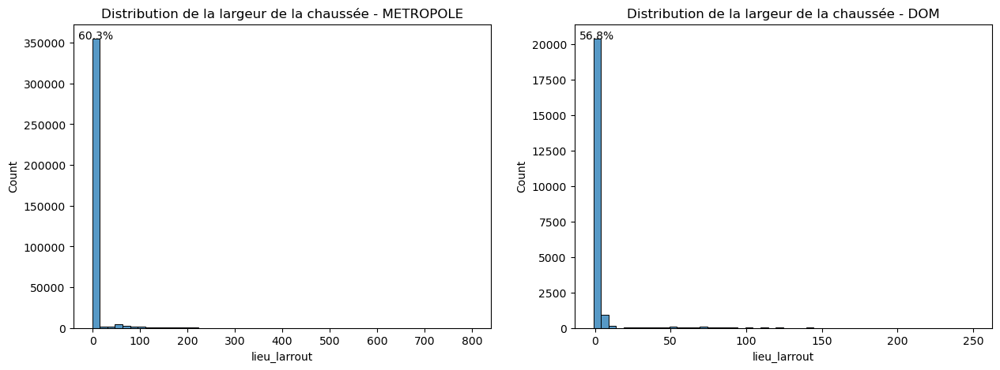

In [208]:
# Variable 'lieu_larrout' - Analyse de sa distribution
fig, axs = monhistplot(df_metropole, df_dom, x="lieu_larrout", title="Distribution de la largeur de la chaussée", bins = 50, viewPercent=5)

# Situation identique à lieu_lartpc
# ===>>> Variable fortement centrée sur 0 avec beaucoup d'outliers très éloignés : Faut-il garder ce genre de données ?


Outliers METROPOLE=
-> Q1= 2.0 - Q3= 3.0 - IQR= 1.0 - Borne inf= 0.5 - Borne sup= 4.5
-> Outlier(s) inférieur(s) - min= 0 - max= 0 - nb= 14672
[0 0 0 ... 0 0 0]
-> Outlier(s) supérieur(s) - min= 5 - max= 13 Outliers nb= 39788
[ 5  5  5 ... 13 13 13]
Outliers DOM=
-> Q1= 2.0 - Q3= 2.0 - IQR= 0.0 - Borne inf= 2.0 - Borne sup= 2.0
-> Outlier(s) inférieur(s) - min= 0 - max= 1 - nb= 5481
[0 0 0 ... 1 1 1]
-> Outlier(s) supérieur(s) - min= 3 - max= 12 Outliers nb= 5639
[ 3  3  3 ... 12 12 12]


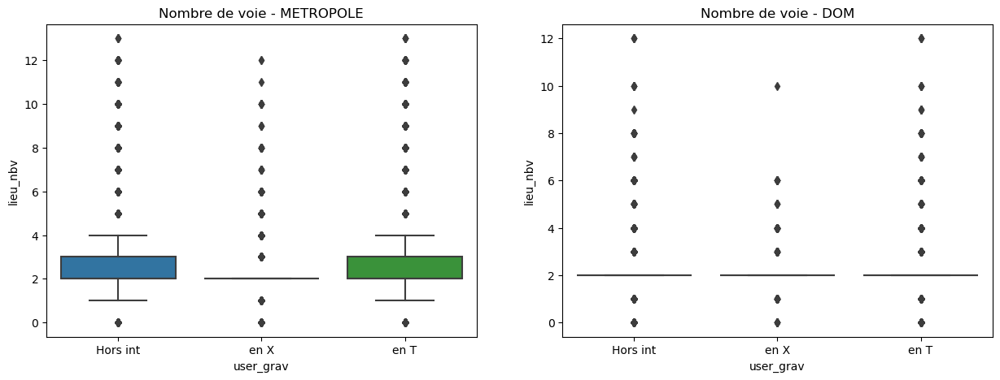

In [209]:
# BOXPLOT : Variable 'lieu_nbv' (outliers)
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axs = monboxplot(df_metropole, df_dom, x='user_gravite', y='lieu_nbv', title="Nombre de voie", code_to_xlabel=code_to_label)
       
# --> 16196 Outliers borne inférieure : nb voie=0
# --> 40695 Outliers borne supérieure : nb voie> 4.5 : de 5 à 13
# ==>>> analyse de la distribution des valeurs


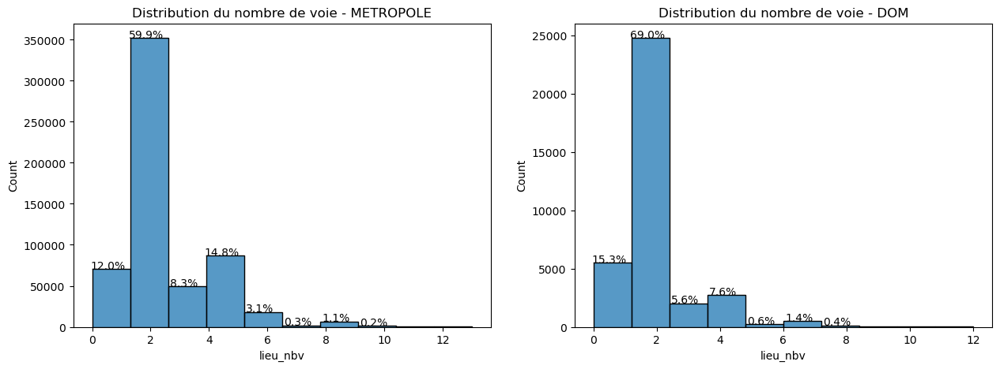

In [210]:
# Variable 'lieu_nbv' - Analyse de sa distribution
fig, axs = monhistplot(df_metropole, df_dom, x="lieu_nbv", title="Distribution du nombre de voie", bins = 10, viewPercent=0.2)

# Distribution quasi normale centrée en 2 
# ===>>>> Faut il intervenir sur les outliers ?
#    - 0 : valeur étrange --> classe[0]
#    - Outliers > 4.5 : plus cohérent (zone de péage par exemple) mais faut-il les garder ?


Outliers METROPOLE=
-> Q1= 50.0 - Q3= 80.0 - IQR= 30.0 - Borne inf= 5.0 - Borne sup= 125.0
-> Outlier(s) inférieur(s) - min= 0.0 - max= 4.0 - nb= 232
-> Outlier(s) supérieur(s) - min= 130.0 - max= 901.0 Outliers nb= 13235
Outliers DOM=
-> Q1= 50.0 - Q3= 70.0 - IQR= 20.0 - Borne inf= 20.0 - Borne sup= 100.0
-> Outlier(s) inférieur(s) - min= 1.0 - max= 15.0 - nb= 92
-> Outlier(s) supérieur(s) - min= 110.0 - max= 900.0 Outliers nb= 1040


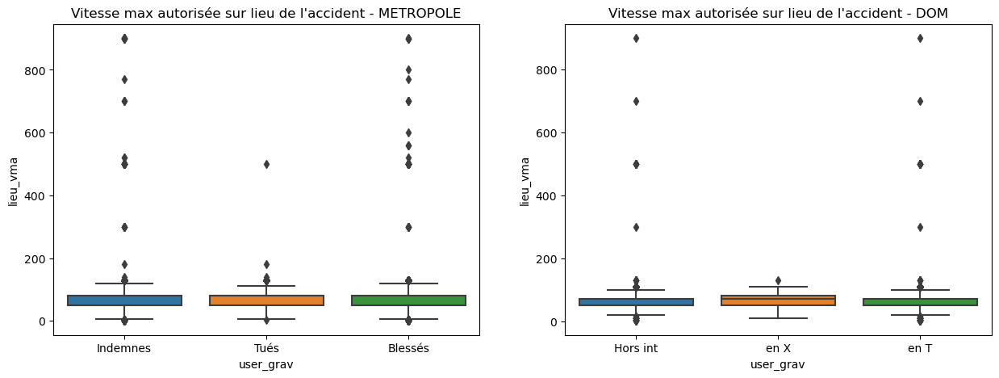

In [211]:
# BOXPLOT : Variable 'lieu_vma'=Vitesse maximale autorisée (outliers)
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axs = monboxplot(df_metropole, df_dom, x='user_gravite', y='lieu_vma', title="Vitesse max autorisée sur lieu de l'accident", 
                      viewOutliers=False, code_to_xlabel=code_to_xlabel)
       
# --> la borne sup calculée est à 125 --> il serait intéressant de la forcer à 130
# --> 13268 Outliers à la borne sup --> anormale --> erreur de saisie
# ==>>> Faut-il les supprimer de df ou corriger leur valeur (privilégier la valeur médianne ?)


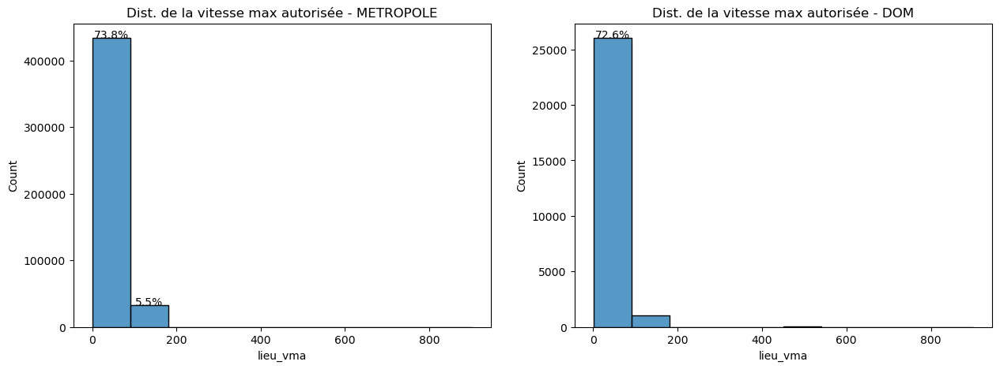

In [212]:
# Variable 'lieu_vma' - Analyse de sa distribution
fig, axs = monhistplot(df_metropole, df_dom,  x="lieu_vma", title="Dist. de la vitesse max autorisée", bins=10, viewPercent=3.0)

# Distribution pseudo  loi normale centrée en 50 
# ===>>>> Surement une erreur de saisie ==> les valeurs semblent * 10


#### COUNTPLOT SUR VARIABLES EXPLICATIVES (CATEGORIELLES)

,df,sum_sq,mean_sq,F,PR(>F)
user_an_nais,1.0,2900.073015,2900.073015,3060.703078,0.0
Residual,618377.0,585923.693090,0.947519,NaN,NaN


Outliers METROPOLE=
-> Q1= 1968.0 - Q3= 1997.0 - IQR= 29.0 - Borne inf= 1924.5 - Borne sup= 2040.5
-> Outlier(s) inférieur(s) - min= 1900.0 - max= 1924.0 - nb= 426
Outliers DOM=
-> Q1= 1971.0 - Q3= 1997.0 - IQR= 26.0 - Borne inf= 1932.0 - Borne sup= 2036.0
-> Outlier(s) inférieur(s) - min= 1900.0 - max= 1931.0 - nb= 84


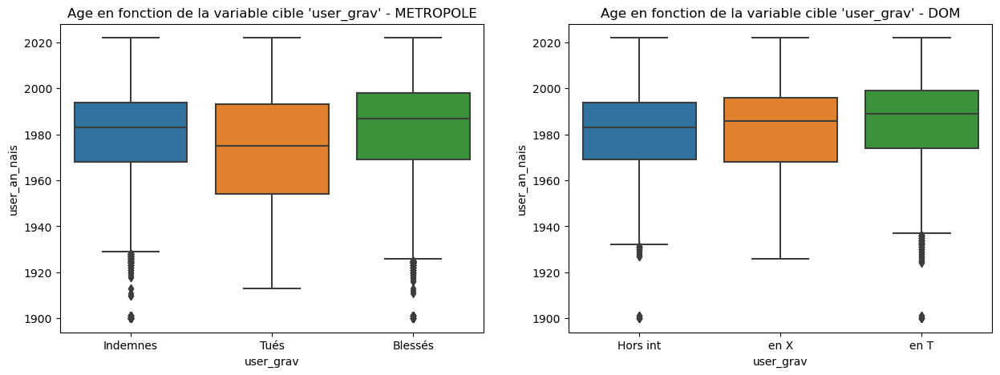

In [213]:


code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axs = monboxplot (df_metropole, df_dom, x="user_gravite", y="user_an_nais", title="Age en fonction de la variable cible 'user_gravite'", 
                       viewOutliers=False, code_to_xlabel=code_to_xlabel)

# ===>>> p-value = 0.0 --> les variables semblent dépendantes

p-value= 0.0


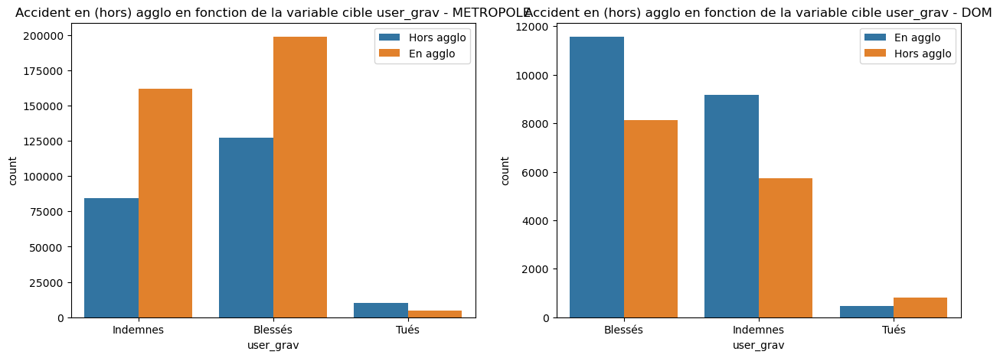

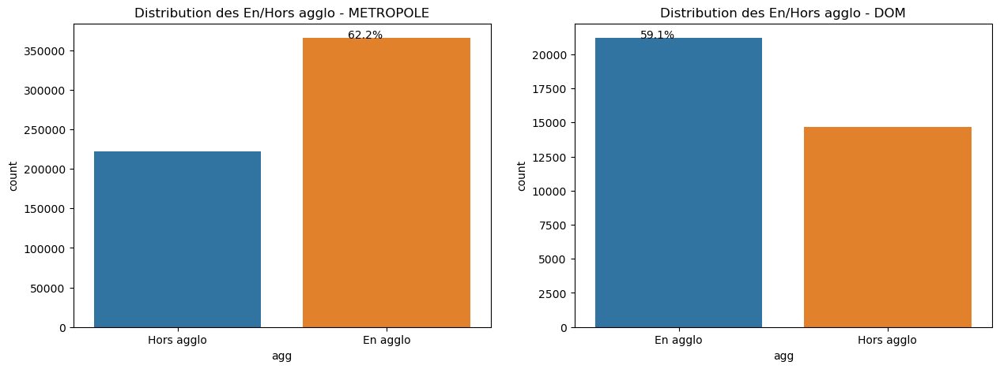

In [217]:
# Analyse statistique du chi2 - entre 'agg' - agglomération et la variable cible user_gravite (2 var. qualitatives)

ct = pd.crosstab(df['user_gravite'], df['agg'])
print("p-value=", chi2_contingency(ct)[1])

code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
code_to_huelabel = {'1' : 'Hors agglo', '2' : 'En agglo'}

fig, axs = moncountplot(df_metropole, df_dom, x="user_gravite", hue="agg", title="Accident en (hors) agglo en fonction de la variable cible user_gravite",
                        code_to_xlabel=code_to_xlabel, code_to_huelabel=code_to_huelabel)

# Graphe 2=Distribution de la variable explicative
fig2, axs2 = moncountplot(df_metropole, df_dom, x="agg", title="Distribution des En/Hors agglo", code_to_xlabel=code_to_huelabel)

# ===>>> Forte dépendance entre 'agg' et la variable cible

p-value= 0.0


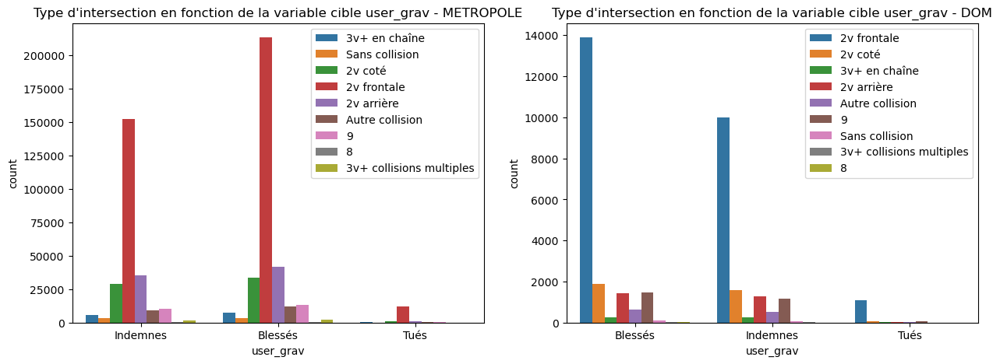

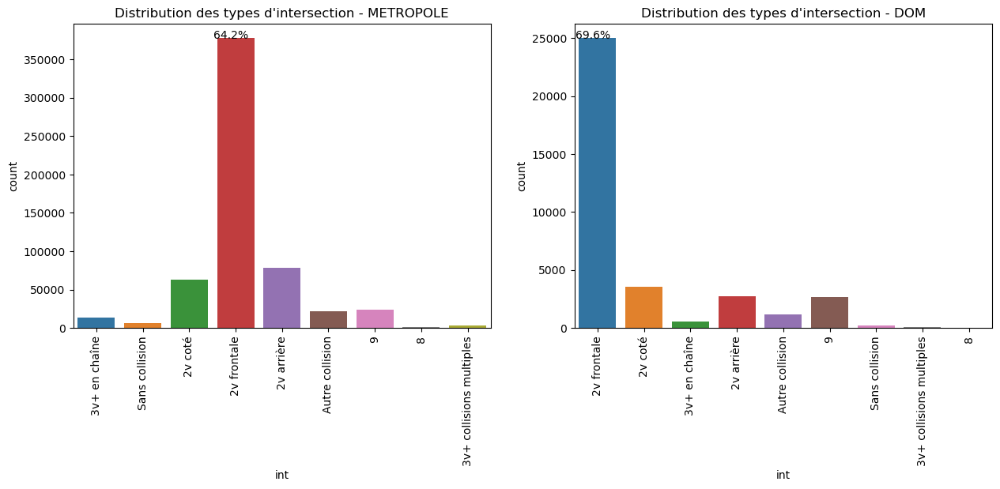

In [220]:
# Analyse statistique du chi2 - entre 'int' - type d'intersection et la variable cible user_gravite (2 var. qualitatives)
# + Distribution de 'int'
ct = pd.crosstab(df['user_gravite'], df['int'])
print("p-value=", chi2_contingency(ct)[1])

# Répartition = f(variable cible)
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
code_to_label = {
    '1' : 'Hors int', 
    '2' : 'en X', 
    '3' : 'en T', 
    '4' : 'en Y', 
    '5' : '+ de 4 branches', 
    '6' : 'Giratoire', 
    '7' : 'Place', 
    '8' : 'Passage à niveau',
    '9' : 'Autre'
}

fig, ax2 = moncountplot(df_metropole, df_dom, x="user_gravite", hue="int", title="Type d'intersection en fonction de la variable cible user_gravite",
                       code_to_xlabel=code_to_xlabel, code_to_huelabel=code_to_huelabel)
fig2, axs2 = moncountplot(df_metropole, df_dom, x="int", title="Distribution des types d'intersection", 
                          code_to_xlabel=code_to_huelabel, rotation_xlabel=90)

# ===>>> Forte dépendance entre 'int' et la variable cible

,df,sum_sq,mean_sq,F,PR(>F)
com,1.0,31.689278,31.689278,33.171533,8.441620e-09
Residual,624048.0,596162.690821,0.955315,NaN,NaN


Outliers METROPOLE=
-> Q1= 64.0 - Q3= 280.0 - IQR= 216.0 - Borne inf= -260.0 - Borne sup= 604.0
-> Outlier(s) inférieur(s) - min= nan - max= nan - nb= 0
[]
-> Outlier(s) supérieur(s) - min= 605.0 - max= 908.0 Outliers nb= 14523
[605. 605. 605. ... 908. 908. 908.]
Outliers DOM=
-> Q1= 209.0 - Q3= 416.0 - IQR= 207.0 - Borne inf= -101.5 - Borne sup= 726.5
-> Outlier(s) inférieur(s) - min= nan - max= nan - nb= 0
[]
-> Outlier(s) supérieur(s) - min= 729.0 - max= 833.0 Outliers nb= 4288
[729. 729. 729. ... 833. 833. 833.]


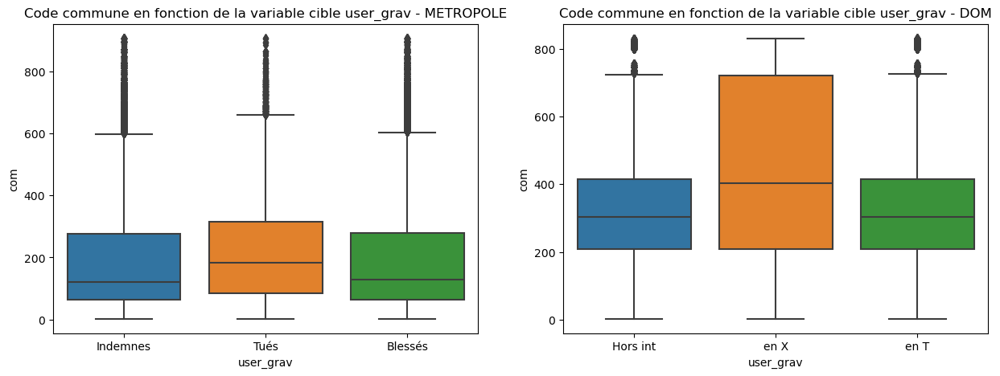

In [221]:
# Analyse statistique - test Anova (entre 'com'=commune (quantitative) la variable cible ='user_gravite' (catégorielle)
result = statsmodels.formula.api.ols('user_gravite ~ com', data=df).fit()
table = statsmodels.api.stats.anova_lm(result)
display(table)

# Graphe
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axs = monboxplot(df_metropole, df_dom, x="user_gravite", y="com", title="Code commune en fonction de la variable cible user_gravite",
                     code_to_xlabel=code_to_xlabel)

# ===>>> p-value < 0.05 --> les variables semblent corrélées

,df,sum_sq,mean_sq,F,PR(>F)
hrmn,1.0,248.346846,248.346846,260.057696,1.713142e-58
Residual,624048.0,595946.033253,0.954968,NaN,NaN


Outliers METROPOLE=
-> Q1= 1006.0 - Q3= 1810.0 - IQR= 804.0 - Borne inf= -200.0 - Borne sup= 3016.0
Outliers DOM=
-> Q1= 915.0 - Q3= 1810.0 - IQR= 895.0 - Borne inf= -427.5 - Borne sup= 3152.5


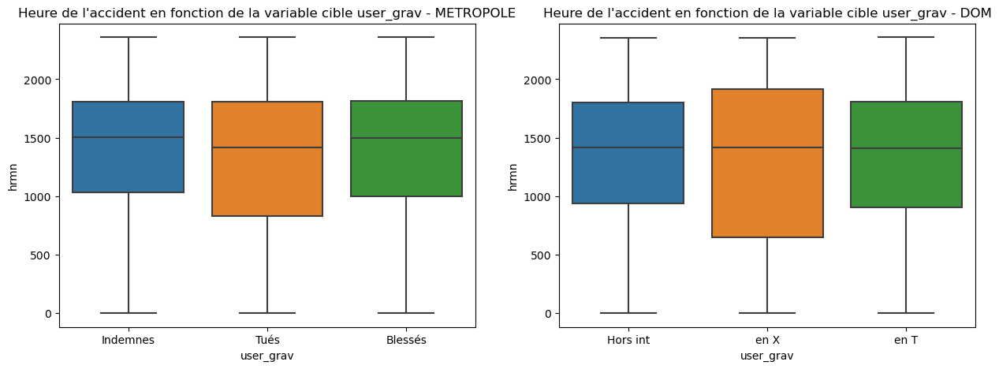

In [222]:
# Analyse statistique - test Anova (entre 'hrmn'=heure de l'accident (quantitative) et la variable cible ='user_gravite' (catégorielle)
result = statsmodels.formula.api.ols('user_gravite ~ hrmn', data=df).fit()
table = statsmodels.api.stats.anova_lm(result)
display(table)

# Graphe
code_to_xlabel = {'0' : 'Indemne', '1' : 'Blessé léger', '2' : 'Blessé grave', '3' : 'Tué'}
fig, axs = monboxplot(df_metropole, df_dom, x="user_gravite", y="hrmn", title="Heure de l'accident en fonction de la variable cible user_gravite",
                     code_to_xlabel=code_to_xlabel, viewOutliers=False)

# p-value < 0.05 --> les variables semblent corrélées

['agg', 'an', 'atm', 'col', 'com', 'dept', 'gps_lat', 'gps_long', 'hrmn', 'int', 'jour', 'lieu_catr', 'lieu_circ', 'lieu_infra', 'lieu_larrout', 'lieu_lartpc', 'lieu_nbv', 'lieu_plan', 'lieu_prof', 'lieu_situ', 'lieu_surf', 'lieu_vma', 'lieu_vosp', 'lum', 'mois', 'user_an_nais', 'user_catu', 'user_etatp', 'user_locp', 'user_place', 'user_secu1', 'user_secu2', 'user_secu3', 'user_sexe', 'user_trajet', 'vehi_catv', 'vehi_choc', 'vehi_manv', 'vehi_motor', 'vehi_obs', 'vehi_obsm', 'vehi_senc', 'agg_catv_perso', 'agg_is_velo', 'agg_is_vsp', 'agg_is_moto', 'agg_is_vl', 'agg_is_pl', 'agg_is_va', 'agg_is_conducteur_vehicule', 'agg_is_conductrice_vehicule', 'agg_nb_pietons_vehicule', 'agg_nb_passagers_vehicule', 'agg_nb_total_vehicules', 'agg_nb_total_velos', 'agg_nb_total_vsp', 'agg_nb_total_motos', 'agg_nb_total_vl', 'agg_nb_total_pl', 'agg_nb_total_va', 'agg_nb_total_conducteurs', 'agg_nb_total_conductrices', 'agg_nb_total_pietons', 'agg_nb_total_passagers', 'user_actp_0', 'user_actp_1', 'us

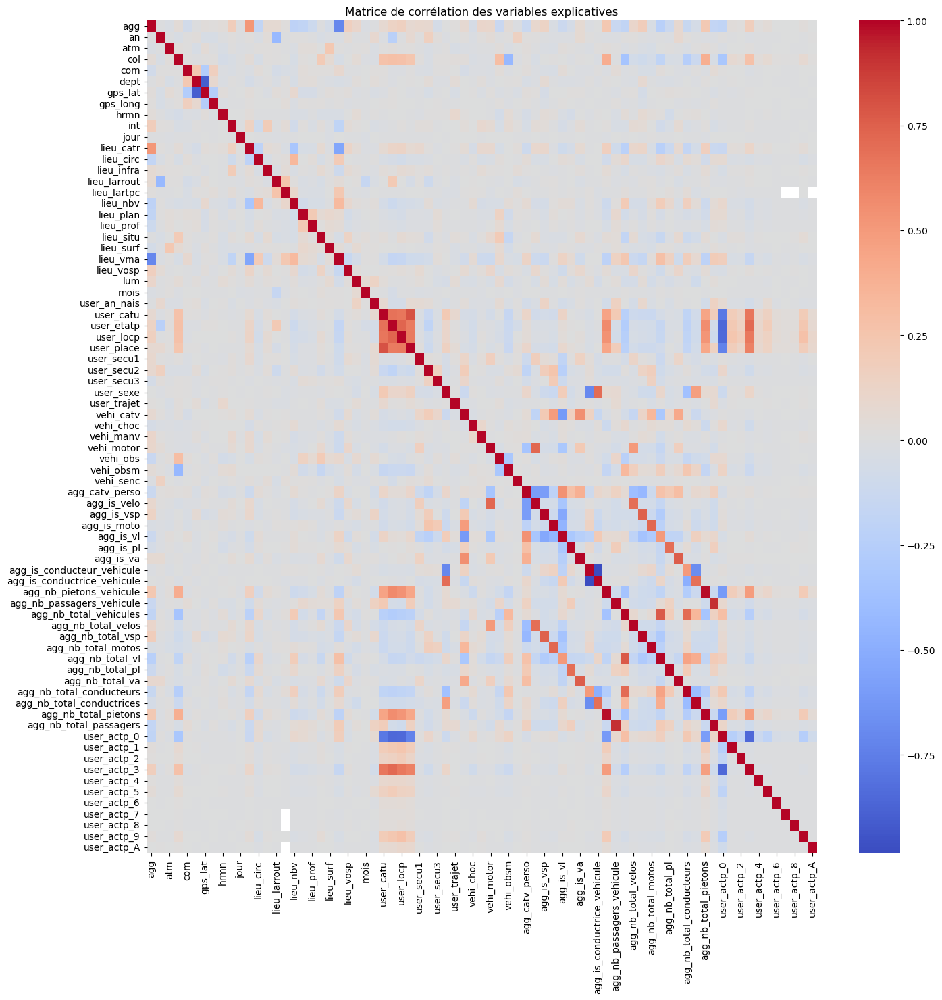

In [223]:
# Recherche de corrélation entre les variables explicatives : DataFrame=feature
colonnes_a_inclure = [colonne for colonne in features.columns if colonne not in ['lieu_env1', 
                                                                                 'user_gravite', 
                                                                                 'agg_nb_indemnes_vehicule', 
                                                                                 'agg_nb_blesses_vehicule',
                                                                                 'agg_nb_tues_vehicule',
                                                                                 'agg_nb_total_indemnes', 
                                                                                 'agg_nb_total_blesses',
                                                                                 'agg_nb_total_tues',
                                                                                ]]
df_a_tracer = features[colonnes_a_inclure]
print (colonnes_a_inclure)

plt.figure(figsize=(16,16))
sns.heatmap(df_a_tracer.iloc[:, 0:-1].corr(), cmap='coolwarm')
plt.title("Matrice de corrélation des variables explicatives");

# Peu de fortes corrélations entre les différentes features. A vérifier par des tests statistiques :
#   - vma=vitesse max et agg= (hors) agglomeration 
# Quelques corrélations à vérifier avec des tests statistiques --> objectif : limiter les variables en entrée
# On note une corrélation entre la latitude et la commune qui semble assez évidente
# Une autre entre la 
# Enfin entre catu=catégorie d'usager - etap=piéton seul ou non (donc lié à catu) / locp= / place=emplacement de l'usager (donc lié à catu)

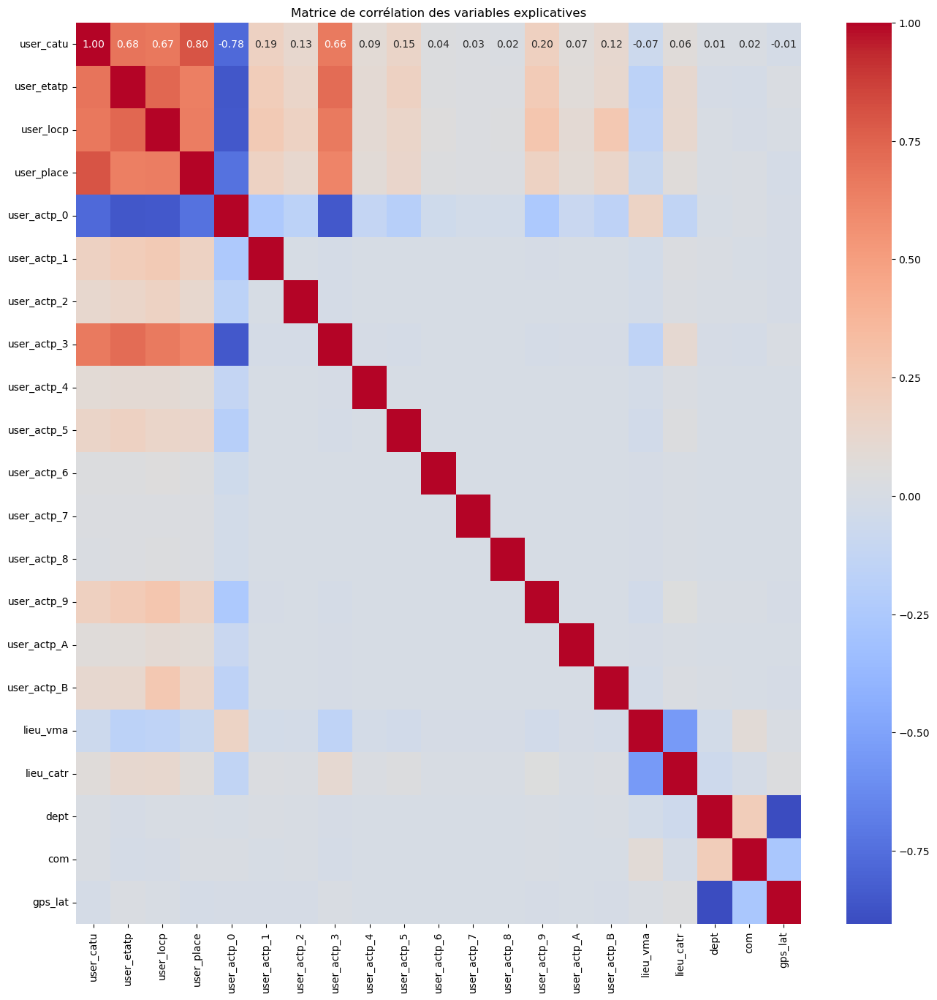

In [224]:
# Focus sur certaines variables 
# Recherche de corrélation entre les variables explicatives : DataFrame=feature
colonnes_a_inclure = ['user_catu', 'user_etatp', 'user_locp', 'user_place',
                      'user_actp_0', 'user_actp_1', 'user_actp_2', 'user_actp_3', 'user_actp_4', 'user_actp_5', 'user_actp_6', 
                      'user_actp_7', 'user_actp_8', 'user_actp_9', 'user_actp_A', 'user_actp_B', 
                     'lieu_vma', 'lieu_catr', 'dept', 'com', 'gps_lat', 'gps_long']
df_a_tracer = features[colonnes_a_inclure]

limite = 0.75
correlation_matrix = df_a_tracer.iloc[:, 0:-1].corr()
layer_matrix = np.abs(correlation_matrix) > limite

plt.figure(figsize=(16,16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matrice de corrélation des variables explicatives");

# Peu de fortes corrélations entre les différentes features. A vérifier par des tests statistiques :
#   - vma=vitesse max et agg= (hors) agglomeration 
# Quelques corrélations à vérifier avec des tests statistiques --> objectif : limiter les variables en entrée
# On note une corrélation entre la latitude et la commune qui semble assez évidente
# Une autre entre la 
# Enfin entre catu=catégorie d'usager - etap=piéton seul ou non (donc lié à catu) / locp= / place=emplacement de l'usager (donc lié à catu)


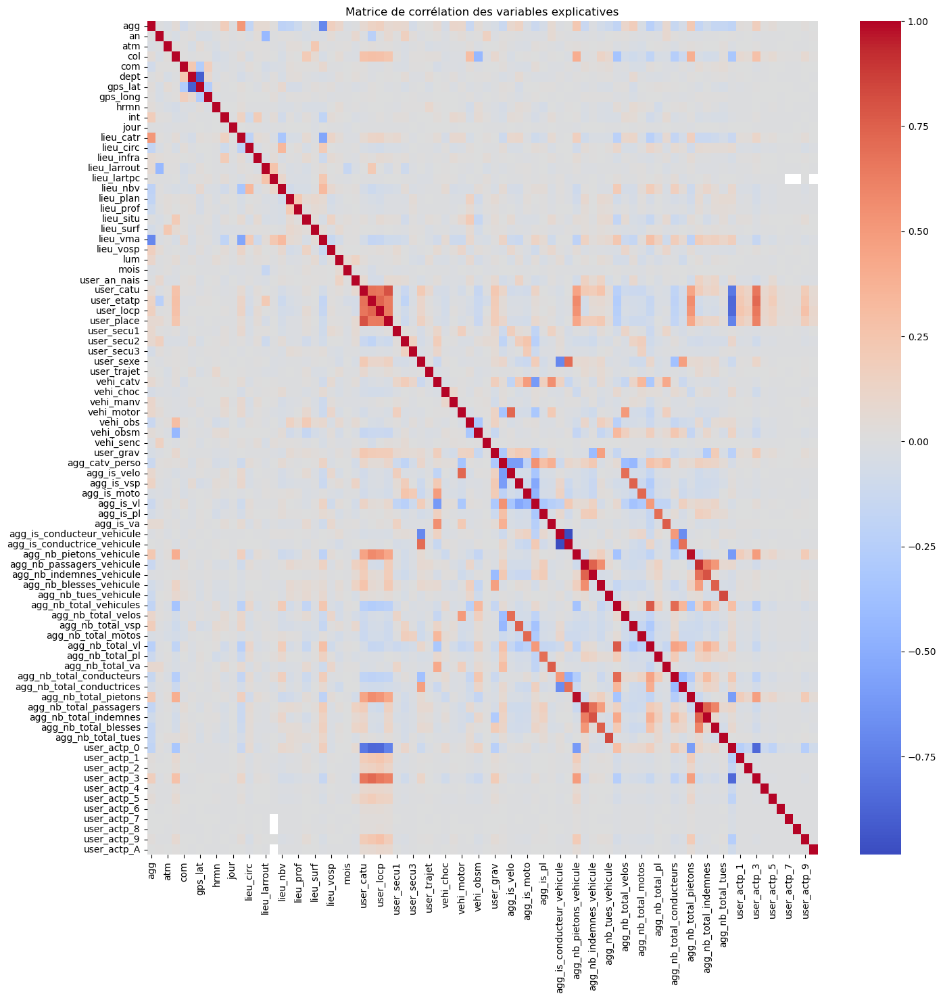

In [225]:
# Recherche de corrélation entre les variables explicatives et variable cible
colonnes_a_inclure = [colonne for colonne in features.columns if colonne not in ['lieu_env1']]
df_a_tracer = features[colonnes_a_inclure]
#print (colonnes_a_inclure)

plt.figure(figsize=(16,16))
sns.heatmap(df_a_tracer.iloc[:, 0:-1].corr(), cmap='coolwarm')
plt.title("Matrice de corrélation des variables explicatives");

# Aucune variable catégorielle ne semble fortement corrélée avec la variable cible 'user_gravite' ou l'une de ses variantes dichotomisées
# ('agg_nb_indemnes_vehicule', 'agg_nb_blesse_vehicule', 'agg_nb_tues_vehicule', 
# 'agg_nb_total_indemnes', 'agg_nb_total_blesse', 'agg_nb_total_tues')

# Pour la suite, peut-être faudrait il :
# --------------------------------------
# - dichotomiser les variables catégorielles explicatives qui ne le seraient pas
# - réaliser l'analyse sur un périmètre restreint du df :
#       -> ciblé sur une typologie d'accident par ex. ceux concernant une typologie de véhicules
#       -> ciblé une zone géographique (décoréler la métropole du reste du territoir, cibler une région...


#### ETAPE 3 - Visualisation géographique des accidents

i= 0 annee= 2018 ax_ligne= 0 ax_colonne= 0
i= 1 annee= 2019 ax_ligne= 1 ax_colonne= 0
i= 2 annee= 2020 ax_ligne= 2 ax_colonne= 0
i= 3 annee= 2021 ax_ligne= 3 ax_colonne= 0
i= 4 annee= 2022 ax_ligne= 4 ax_colonne= 0


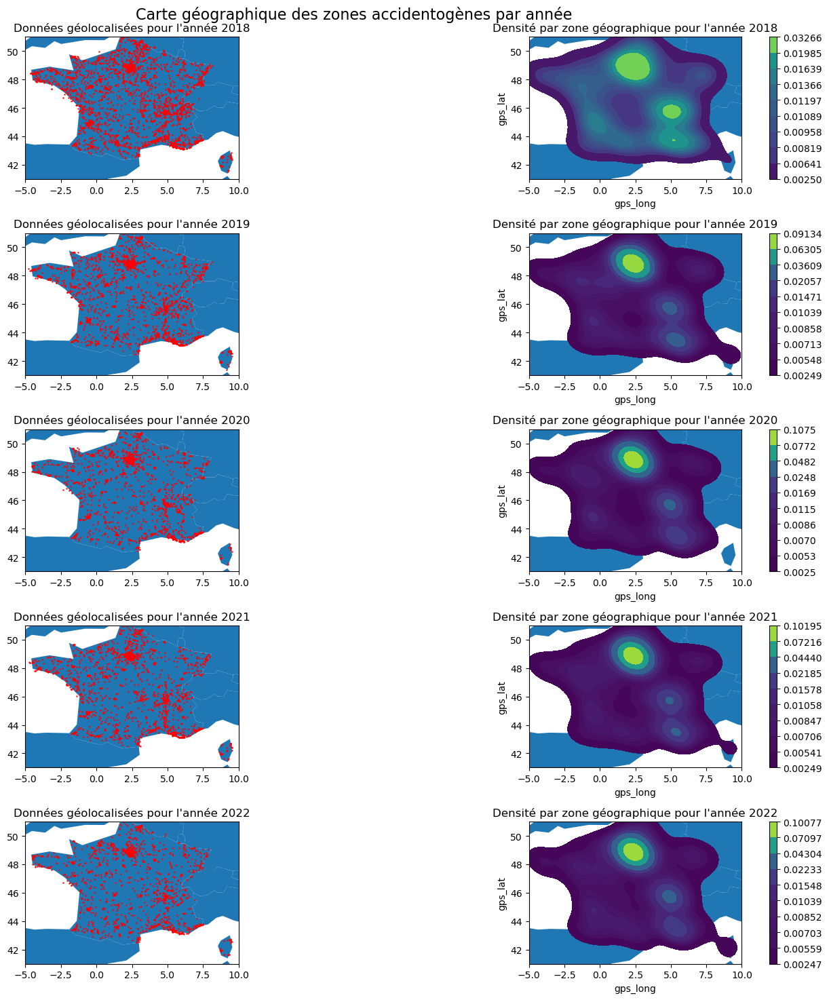

In [227]:
#df.reset_index(inplace=True)
nb_annees = df['carac_an'].unique() 
nb_graphes = len(nb_annees)
nb_rows = nb_graphes // 2 + nb_graphes % 2               # Nombre de lignes à afficher (2 graphes par lignes

# Charger les contours des pays
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
df2 = df_metropole.loc[(df.user_gravite == 2), ['carac_an', 'gps_long', 'gps_lat']]

# Créer une figure et des axes pour les sous-graphes
fig, axs = plt.subplots(nb_graphes, 2, figsize=(15, 15))

# Préparation des cartes par année
for i, annee in enumerate(nb_annees):
    row_idx = i 
    col_idx = 0
    print ("i=", i, "annee=", annee, "ax_ligne=", row_idx, "ax_colonne=", col_idx)
    
    # Tracer le graphe sur le sous-axe correspondant
    ax = axs[row_idx, col_idx]
    
    # zoom sur une région du monde : France métropolitaine
    world.plot(ax=ax)                               # Ajouter les contours de pays
    ax.set_xlim(-5, 10)                             # Longitude
    ax.set_ylim(41, 51)                             # Latitude
    ax.set_title(f'Données géolocalisées pour l\'année {annee}')

    # Visualisation géographique des accidents
    points = [Point(xy) for xy in zip(df2.loc[(df.an == annee), 'gps_long'], df2.loc[(df.an == annee), 'gps_lat'])]
    gdf = gpd.GeoDataFrame(geometry=points, columns=['geometry'])
    gdf.plot(ax=ax, color='red', markersize=0.5)      # Ajouter les points sur la carte

    # Tracer le graphe sur le sous-axe correspondant
    col_idx = col_idx + 1
    ax = axs[row_idx, col_idx]
    
    # zoom sur une région du monde : France métropolitaine
    world.plot(ax=ax)                               # Ajouter les contours de pays
    ax.set_xlim(-5, 10)                             # Longitude
    ax.set_ylim(41, 51)                             # Latitude
    ax.set_title(f'Densité par zone géographique pour l\'année {annee}')
    sns.kdeplot(x=df2.loc[(df.an == annee), 'gps_long'], y=df2.loc[(df.an == annee), 'gps_lat'], cmap='viridis', shade=True, ax=ax, bw=0.3, cbar=True)
    #sns.jointplot(data=df2.loc[(df['carac_an'] == annee), ['gps_long', 'gps_lat']], x='gps_long', y='gps_lat', kind='kde', cmap='viridis', ax=ax, bw = 0.3, cbar=True)

# Supprimer les sous-graphes non utilisés
#for i in range(nb_graphes, nb_rows * 2):
#    ax = axs.flatten()[i]
#    ax.remove()
    
plt.suptitle("Carte géographique des zones accidentogènes par année", fontsize=16)

# Ajuster l'espacement entre les sous-graphes
plt.tight_layout()

# Afficher la figure
plt.show()



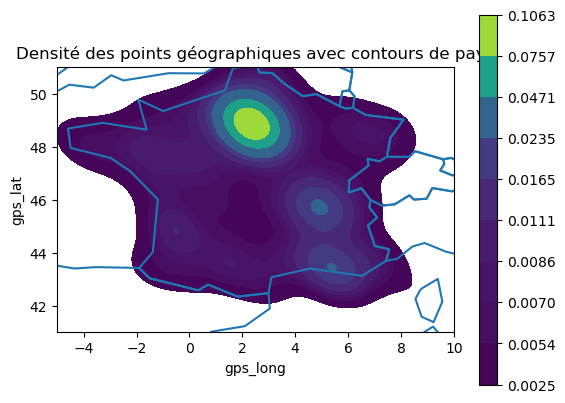

In [229]:
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
df2 = df_metropole.loc[(df.an == 2020), ['gps_long', 'gps_lat']]

# Charger les données géographiques des pays
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Ajouter les contours des pays
ax = world.boundary.plot()
# Tracer le graphe de densité des points géographiques
sns.kdeplot(x=df2['gps_long'], y=df2['gps_lat'], cmap='viridis', shade=True, ax=ax, bw=0.3, cbar=True)
ax.set_xlim(-5, 10)                             # Longitude
ax.set_ylim(41, 51)                             # Latitude

# Ajouter un titre au graphe
plt.title('Densité des points géographiques avec contours de pays')

# Afficher le graphe
plt.show()
